In [2]:
import math
import torch
import torch.nn as nn
import torch.utils
import torch.utils.data
from torchvision import datasets, transforms
from torch.autograd import Variable
import matplotlib.pyplot as plt 
import numpy as np
import scipy.io
from sklearn import preprocessing
plt.rcParams.update({'font.size': 42})
import os, os.path
import pandas as pd
plt.rcParams["figure.figsize"] = (20,10)
from scipy import signal
from scipy.ndimage import gaussian_filter1d
from sklearn.preprocessing import StandardScaler, MinMaxScaler

from scipy import signal
import scipy.stats as stats
plt.rcParams["figure.figsize"] = (20,10)
import mne
from mne.viz import plot_topomap
import pickle
from sklearn.preprocessing import StandardScaler
from torch.utils.data import TensorDataset, DataLoader
from scipy.ndimage import gaussian_filter1d
import mne
from mne.viz import plot_topomap
import numpy.linalg as LA


from matplotlib.colors import ListedColormap
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.datasets import make_moons, make_circles, make_classification
from sklearn.neural_network import MLPClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.gaussian_process import GaussianProcessClassifier
from sklearn.gaussian_process.kernels import RBF
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.discriminant_analysis import QuadraticDiscriminantAnalysis

from sklearn.model_selection import cross_val_score
from sklearn.decomposition import PCA


In [3]:
electrode_names = ['Fp1','AF7','AF3','F1','F3','F5','F7','FT7','FC5','FC3','FC1','C1','C3','C5','T7','TP7','CP5','CP3','CP1','P1','P3','P5','P7','P9','PO7','PO3','O1','Iz','Oz','POz','Pz','CPz','Fpz','Fp2','AF8','AF4','AFz','Fz','F2','F4','F6','F8','FT8','FC6','FC4','FC2','FCz','Cz','C2','C4','C6','T8','TP8','CP6','CP4','CP2','P2','P4','P6','P8','P10','PO8','PO4','O2','Mstd_L','Mstd_R','BL1','BR1','BL2','BR2','BL3','BR3']
ch_names = electrode_names


n_channels = 64
sampling_freq = 128  # in Hertz
info = mne.create_info(n_channels, sfreq=sampling_freq)
print(info)

#ch_names = [f'MEG{n:03}' for n in range(1, 10)] + ['EOG001']
ch_names = ch_names[0:64]
ch_types = ['eeg'] * 64
info = mne.create_info(ch_names, ch_types=ch_types, sfreq=sampling_freq)
print(info)
info.set_montage('biosemi64')

<Info | 7 non-empty values
 bads: []
 ch_names: 0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, ...
 chs: 64 MISC
 custom_ref_applied: False
 highpass: 0.0 Hz
 lowpass: 64.0 Hz
 meas_date: unspecified
 nchan: 64
 projs: []
 sfreq: 128.0 Hz
>
<Info | 7 non-empty values
 bads: []
 ch_names: Fp1, AF7, AF3, F1, F3, F5, F7, FT7, FC5, FC3, FC1, C1, C3, C5, ...
 chs: 64 EEG
 custom_ref_applied: False
 highpass: 0.0 Hz
 lowpass: 64.0 Hz
 meas_date: unspecified
 nchan: 64
 projs: []
 sfreq: 128.0 Hz
>


<Info | 8 non-empty values
 bads: []
 ch_names: Fp1, AF7, AF3, F1, F3, F5, F7, FT7, FC5, FC3, FC1, C1, C3, C5, ...
 chs: 64 EEG
 custom_ref_applied: False
 dig: 67 items (3 Cardinal, 64 EEG)
 highpass: 0.0 Hz
 lowpass: 64.0 Hz
 meas_date: unspecified
 nchan: 64
 projs: []
 sfreq: 128.0 Hz
>

In [4]:
def pre_process_trial(trial,cols,w):
    trial = trial[0:cols]
    trial = trial.T
    
    trial = trial[1::2]
    trial = trial.reshape((1,w,cols))
    return trial

def extract_experiment(path,exp_name,cols,w,j,df,train_data,train_labels,valence):
    n = 0
    full_path= path+"/"+exp_name
    #print(full_path)
    mat = scipy.io.loadmat(full_path)
    bias = 0
    trials = mat['data_eeg'][0][0][1][0]
    odours = mat['data_eeg'][0][0][5]
    if j == 0:
        bias = 0
    elif j == 1:
        bias = len(df[df.Chunks == 1])
    elif j == 2:
        bias = len(df[df.Chunks == 1]) + len(df[df.Chunks == 2])

    for k,trial in enumerate(trials):
        if df.iloc[bias+k].Pleasantness <45:
            trial = pre_process_trial(trial,cols,w)
            #print(trial)
            if not np.any(trial > 200) or not np.any(trial < -200):
                labs = np.zeros(trial.shape[0])
                train_labels = np.append(train_labels,labs)
                valence = np.append(valence,df.iloc[bias+k].Pleasantness)
                #print(trial.shape)
                #print(train_data.shape)
                train_data = np.append(train_data,trial,axis=0)
                n+=1
            
        elif df.iloc[bias+k].Pleasantness > 55:
            trial = pre_process_trial(trial,cols,w)
            if not np.any(trial > 200) or not np.any(trial < -200):
                labs = np.ones(trial.shape[0])
                train_labels = np.append(train_labels,labs)
                valence = np.append(valence,df.iloc[bias+k].Pleasantness)
                #print(trial.shape)
                #print(train_data.shape)
                train_data = np.append(train_data,trial,axis=0)
                n+=1
            
    return train_data,train_labels,n,valence


In [58]:
ground_path='/Users/corytrevor/Documents/Skola/KTH/EE/Master/exjobb/Code/VRNNC/src/iravani_neuro_data/'
dir_names = [name for name in os.listdir(ground_path) if name.startswith('SL') ]
print(dir_names)
dir_names.sort()
ind = 0
cols = 64
w = 768
train_labels = np.zeros(1)
train_data = np.zeros((1,w,cols))
test_labels = np.zeros(1)
test_data = np.zeros((1,w,cols))
trials_per_participant_train = np.zeros(19)
trials_per_participant_test = np.zeros(19)
valence_train = np.zeros(1)
valence_test = np.zeros(1)
for i, dir_name in enumerate(dir_names):
    #if i == 0 or i == 12 or i == 16:
    path = ground_path+dir_name
    exp_names = os.listdir(path)
    exp_names.sort()
    #print(exp_names)
    df = pd.read_csv(ground_path+"table_"+str(i+1)+".csv")
    #print("i",i)
    n_ple = 0
    n_dis = 0
    n_ple_test = 0
    n_dis_test = 0
    #exp_scalers = []
    for j, exp_name in enumerate(exp_names):
        if j < 1 or j > 1:
            train_data, train_labels,n_train,valence_train = extract_experiment(path,exp_name,cols,w,j,df,train_data,train_labels,valence_train)
        else:
            test_data, test_labels,n_test,valence_test = extract_experiment(path,exp_name,cols,w,j,df,test_data,test_labels,valence_test)
    trials_per_participant_train[i] = n_train
    trials_per_participant_test[i] = n_test
    
train_data = train_data[1:]
train_labels = train_labels[1:]
test_data = test_data[1:]
test_labels = test_labels[1:]
train_valence = valence_train[1:]
test_valence = valence_test[1:]

['SL07_09', 'SL07_07', 'SL07_06', 'SL07_08', 'SL07_15', 'SL07_12', 'SL07_23', 'SL07_25', 'SL07_03', 'SL07_04', 'SL07_02', 'SL07_16', 'SL07_20', 'SL07_18', 'SL07_27', 'SL07_26', 'SL07_21', 'SL07_28', 'SL07_10']


In [59]:
print(train_data.shape)
print(train_labels.shape)
print(np.count_nonzero(train_labels==0)/train_labels.shape[0])
print(test_data.shape)

(1530, 768, 64)
(1530,)
0.38562091503267976
(519, 768, 64)


In [60]:
print(trials_per_participant_train)
print(valence_train)
new_train_data = np.zeros((1,w,cols))
new_train_labels = np.zeros(1)
new_train_valence = np.zeros(1)
prev_n = 0
for n in trials_per_participant_train:
    arr = valence_train[prev_n:int(prev_n+n)]
    
    ind = np.argpartition(arr, -4)[-4:]
    new_train_data = np.append(new_train_data,train_data[ind],axis=0)
    new_train_labels = np.append(new_train_labels,train_labels[ind])
    new_train_valence = np.append(new_train_valence,train_valence[ind])
    
    ind = np.argpartition(arr, 4)[:4]
    new_train_data = np.append(new_train_data,train_data[ind],axis=0)
    new_train_labels = np.append(new_train_labels,train_labels[ind])
    new_train_valence = np.append(new_train_valence,train_valence[ind])
    
new_train_data = new_train_data[1:]
new_train_labels = new_train_labels[1:]
new_train_valence = new_train_valence[1:]

[54. 28. 39.  7. 33. 41. 22. 81. 44. 63. 59. 59. 69. 25. 35. 29. 88. 11.
 34.]
[ 0. 77. 42. ... 67. 31. 28.]


In [61]:
#print(trials_per_participant_train)
#print(valence_train)
new_test_data = np.zeros((1,w,cols))
new_test_labels = np.zeros(1)
new_test_valence = np.zeros(1)
prev_n = 0
for n in trials_per_participant_test:
    arr = valence_test[prev_n:int(prev_n+n)]
    
    ind = np.argpartition(arr, -2)[-2:]

    new_test_data = np.append(new_test_data,test_data[ind],axis=0)
    new_test_labels = np.append(new_test_labels,test_labels[ind])
    new_test_valence = np.append(new_test_valence,test_valence[ind])
    
    ind = np.argpartition(arr, 2)[:2]
    new_test_data = np.append(new_test_data,test_data[ind],axis=0)
    new_test_labels = np.append(new_test_labels,test_labels[ind])
    new_test_valence = np.append(new_test_valence,test_valence[ind])
    
new_test_data = new_test_data[1:]
new_test_labels = new_test_labels[1:]
new_test_valence = new_test_valence[1:]

In [62]:

print(new_train_data.shape)
print(new_test_data.shape)
train_data = new_train_data
train_labels = new_train_labels
train_valence = new_train_valence
test_data = new_test_data
test_labels = new_test_labels
test_valence = new_test_valence

(152, 768, 64)
(76, 768, 64)


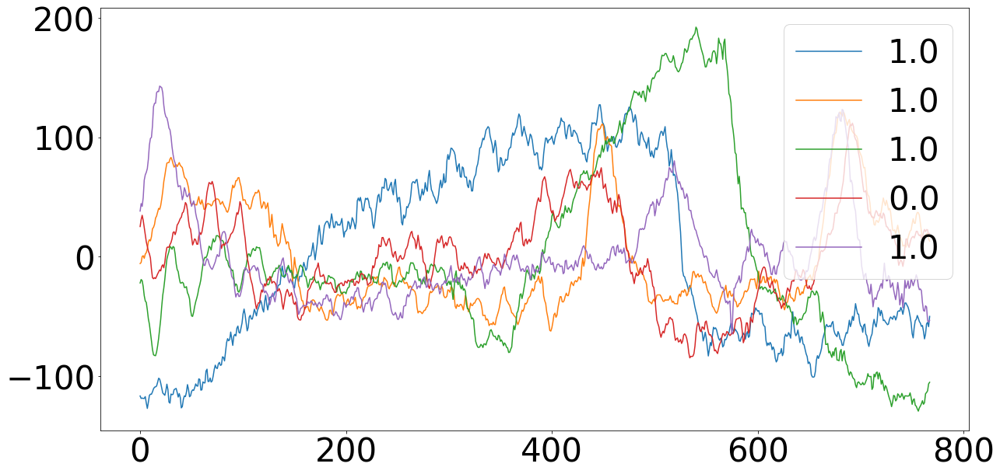

In [63]:
for i in range(0,5):
    plt.plot(train_data[i,:,1])

plt.legend(train_labels[0:5])

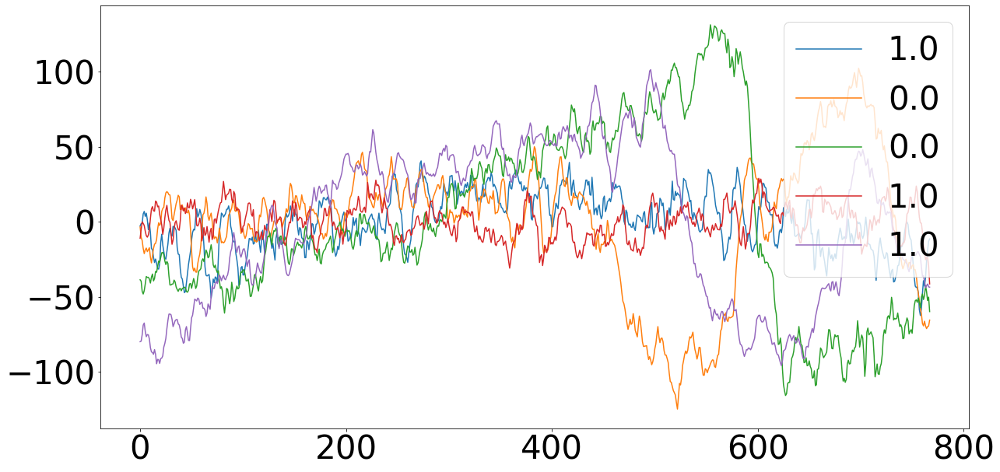

In [64]:
for i in range(0,5):
    plt.plot(test_data[i,:,1])

plt.legend(test_labels[0:5])

In [65]:

train_scaler = StandardScaler()
train_scaler.fit(train_data.reshape(train_data.shape[0],train_data.shape[1]*train_data.shape[2]))
scaled_train_data = train_scaler.transform(train_data.reshape(train_data.shape[0],train_data.shape[1]*train_data.shape[2])).reshape(train_data.shape[0],train_data.shape[1],train_data.shape[2])
print(scaled_train_data.shape)

(152, 768, 64)


In [66]:
scaled_test_data = train_scaler.transform(test_data.reshape(test_data.shape[0],test_data.shape[1]*test_data.shape[2])).reshape(test_data.shape[0],test_data.shape[1],test_data.shape[2])
print(scaled_test_data.shape)

(76, 768, 64)


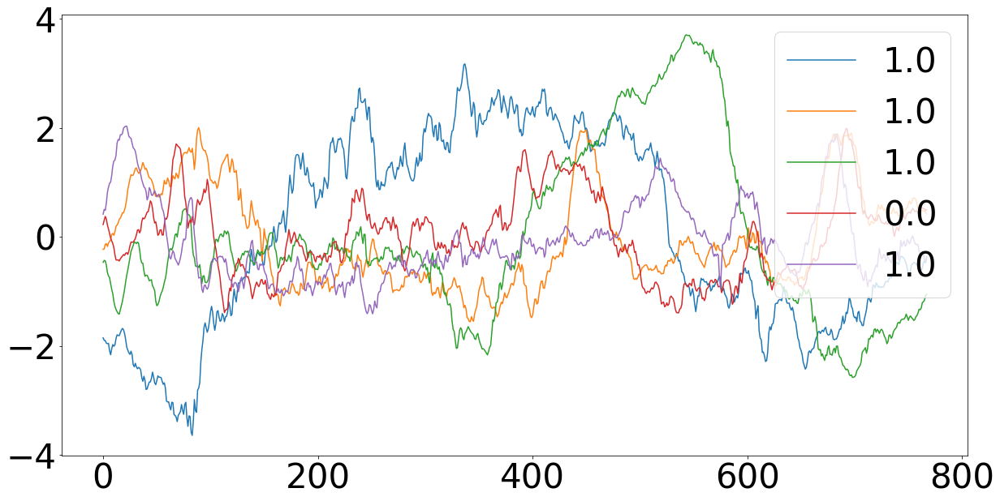

In [67]:
for i in range(0,5):
    plt.plot(scaled_train_data[i,:,1])

plt.legend(train_labels[0:5])


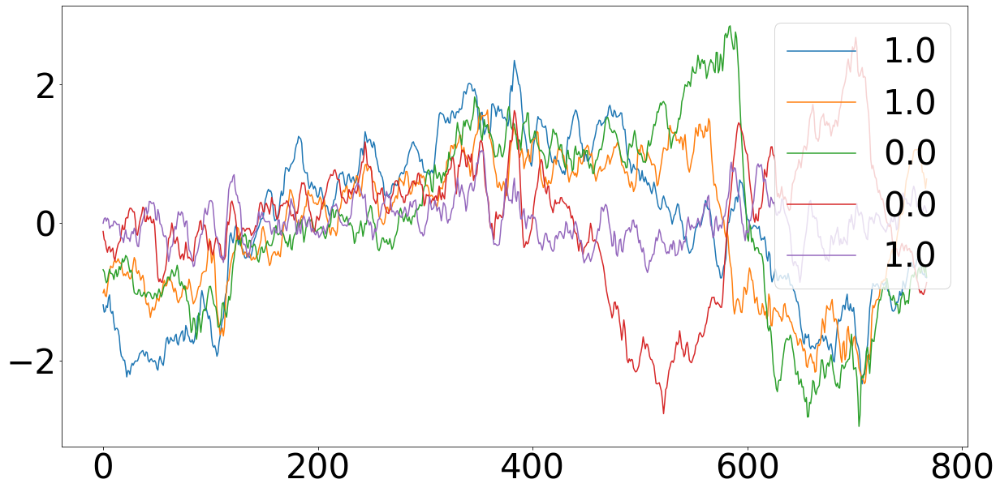

In [15]:
for i in range(0,5):
    plt.plot(scaled_test_data[i,:,1])

plt.legend(test_labels[0:5])


In [16]:
from scipy import signal
f_s = 256
train_fourier = np.zeros((scaled_train_data.shape[0],385,scaled_train_data.shape[2]))
for i in range(scaled_train_data.shape[0]):
    #print(i)
    for j in range(scaled_train_data.shape[2]):
        f, pxx = signal.periodogram(scaled_train_data[i,:,j], f_s)
        train_fourier[i,:,j] = pxx
        
        
test_fourier = np.zeros((scaled_test_data.shape[0],385,scaled_test_data.shape[2]))
for i in range(scaled_test_data.shape[0]):
    #print(i)
    for j in range(scaled_test_data.shape[2]):
        f, pxx = signal.periodogram(scaled_test_data[i,:,j], f_s)
        test_fourier[i,:,j] = pxx

In [17]:
def mean_median(index, data, labels):
    dist_0 = np.zeros(len(labels))
    dist_1 = np.zeros(len(labels))
    for l in range(len(labels)):
        d = LA.norm(data[index,:]-data[l,:])

        if labels[l] == 0:
            dist_0[l] = d
        else:
            dist_1[l] = d

    dist_0 = dist_0[dist_0 !=0]
    dist_1 =dist_1[dist_1 !=0]
    median_0 = np.median(dist_0)
    median_1 = np.median(dist_1)
    mean_0 = np.mean(dist_0)
    mean_1 = np.mean(dist_1)
    return median_0, median_1, mean_0, mean_1


# Plot and distance of mock up, well separated, data

(600, 2)
[[ 0.33213048 -0.31369588]
 [ 1.85994136  0.2902957 ]
 [-0.81114064 -0.65431225]
 ...
 [ 1.8611961   0.91836546]
 [ 0.50716472  0.85910907]
 [ 1.48945399  1.5983643 ]]
mean unp to unp 1.0430497976450372
mean unp to p 1.6324563328537964
mean p to p 1.0086262436824782
HEUREKA-----------------------
median unp to unp 0.7931658792995655
median unp to p 1.4389657041345
median p to p 0.7731500216128431
HEUREKA-----------------------


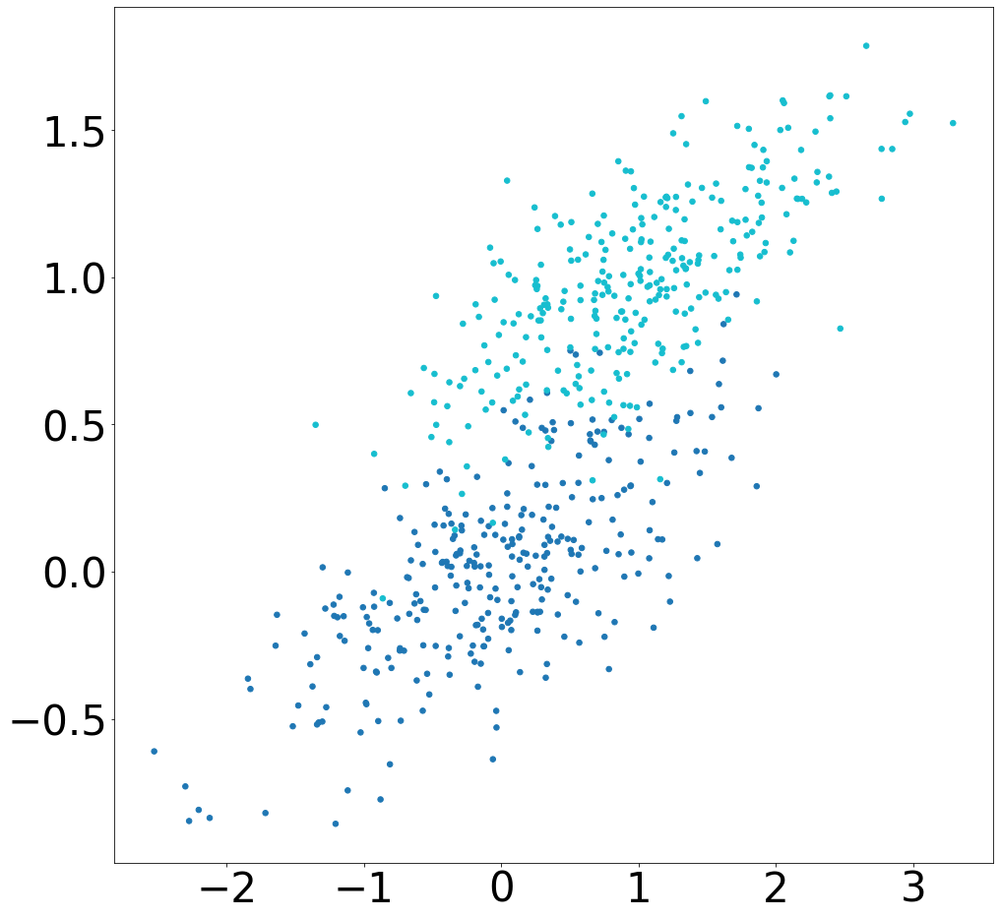

In [93]:
n, dim = 300, 2
np.random.seed(0)
C = np.array([[0., -0.23], [0.83, .23]])
X = np.r_[np.dot(np.random.randn(n, dim), C),
          np.dot(np.random.randn(n, dim), C) + np.array([1, 1])]

print(X.shape)
print(X)
y = np.hstack((np.zeros(n), np.ones(n)))

fig, ax = plt.subplots(figsize=(16, 16))
sc = ax.scatter(
    X[:, 0],
    X[:, 1],
    c=y.astype(int),
    cmap="tab10",
    s=30,
    alpha=1,
    rasterized=True,
)

median_0s = np.zeros(len(y))
median_1s = np.zeros(len(y))

mean_0s = np.zeros(len(y))
mean_1s = np.zeros(len(y))

for index in range(len(y)):
    median_0, median_1, mean_0, mean_1 = mean_median(index,X,y)
    median_0s[index] = median_0
    median_1s[index] = median_1
    
    mean_0s[index] = mean_0
    mean_1s[index] = mean_1

mean_0_0s = np.zeros(len(y))
mean_0_1s = np.zeros(len(y))
mean_1_1s = np.zeros(len(y))

median_0_0s = np.zeros(len(y))
median_0_1s = np.zeros(len(y))
median_1_1s = np.zeros(len(y))

for index in range(len(mean_0s)):
    
    if y[index] == 0:
        mean_0_0s[index] = mean_0s[index]
        median_0_0s[index] = median_0s[index]
    else:
        mean_0_1s[index] = mean_0s[index]
        mean_1_1s[index] = mean_1s[index]
        
        median_0_1s[index] = median_0s[index]
        median_1_1s[index] = median_1s[index]

mean_0_0s = mean_0_0s[mean_0_0s != 0]
mean_0_1s = mean_0_1s[mean_0_1s != 0]
mean_1_1s = mean_1_1s[mean_1_1s != 0]
      
median_0_0s = median_0_0s[median_0_0s != 0]
median_0_1s = median_0_1s[median_0_1s != 0]
median_1_1s = median_1_1s[median_1_1s != 0]

mean_between_unpleasant_unpleasant = np.mean(mean_0_0s)
mean_between_pleasant_unpleasant = np.mean(mean_0_1s)
mean_between_pleasant_pleasant = np.mean(mean_1_1s)

median_between_unpleasant_unpleasant = np.median(median_0_0s)
median_between_pleasant_unpleasant = np.median(median_0_1s)
median_between_pleasant_pleasant = np.median(median_1_1s)

print("mean unp to unp", mean_between_unpleasant_unpleasant)
print("mean unp to p", mean_between_pleasant_unpleasant)
print("mean p to p", mean_between_pleasant_pleasant)
if (mean_between_unpleasant_unpleasant/mean_between_pleasant_unpleasant) < 0.9 and (mean_between_pleasant_pleasant/mean_between_pleasant_unpleasant) < 0.9:
    print("HEUREKA-----------------------")
print("median unp to unp", median_between_unpleasant_unpleasant)
print("median unp to p", median_between_pleasant_unpleasant)
print("median p to p", median_between_pleasant_pleasant)
if (median_between_unpleasant_unpleasant/median_between_pleasant_unpleasant) < 0.9 and (median_between_pleasant_pleasant/median_between_pleasant_unpleasant) < 0.9:
    print("HEUREKA-----------------------")

# Plot and distance of actual data for one electrode

(127, 2)
mean unp to unp 20.87464062752287
mean unp to p 22.41547034856169
mean p to p 23.841188873829132
median unp to unp 13.407858566850273
median unp to p 14.669234292442614
median p to p 18.117263049986313


(-0.5, 0.5)

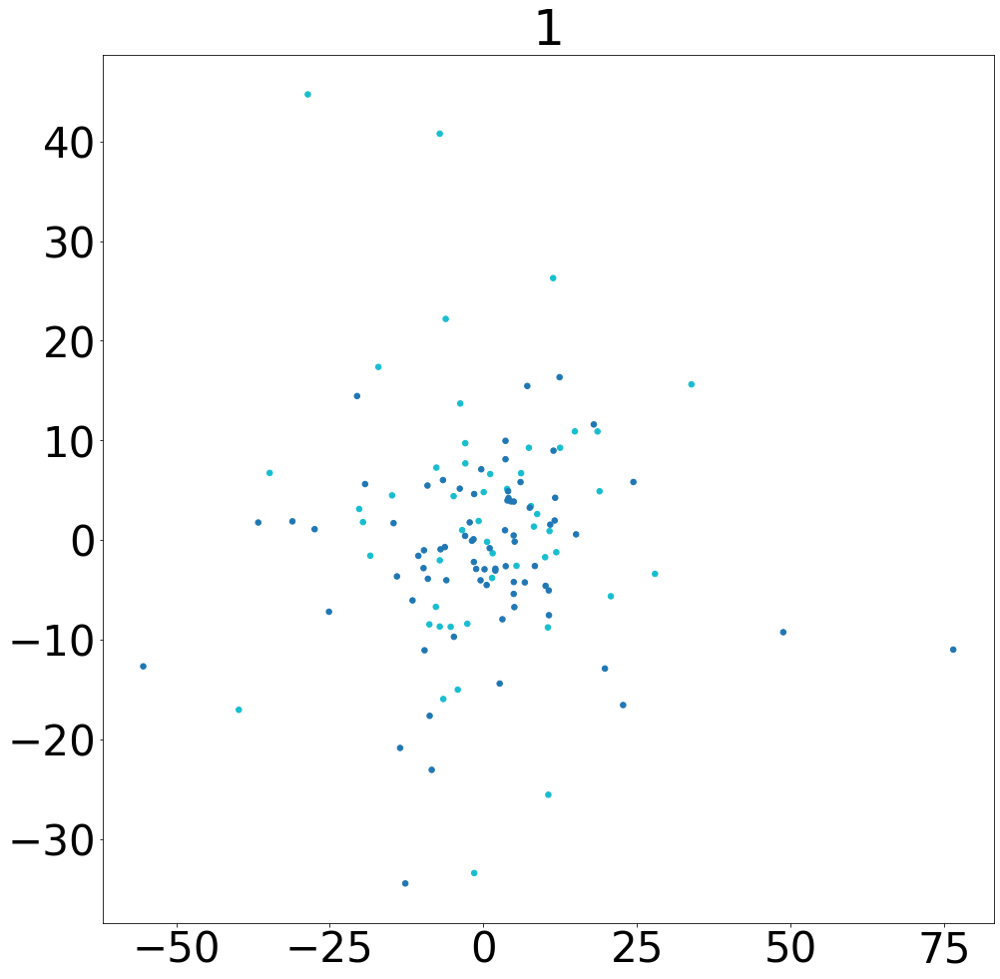

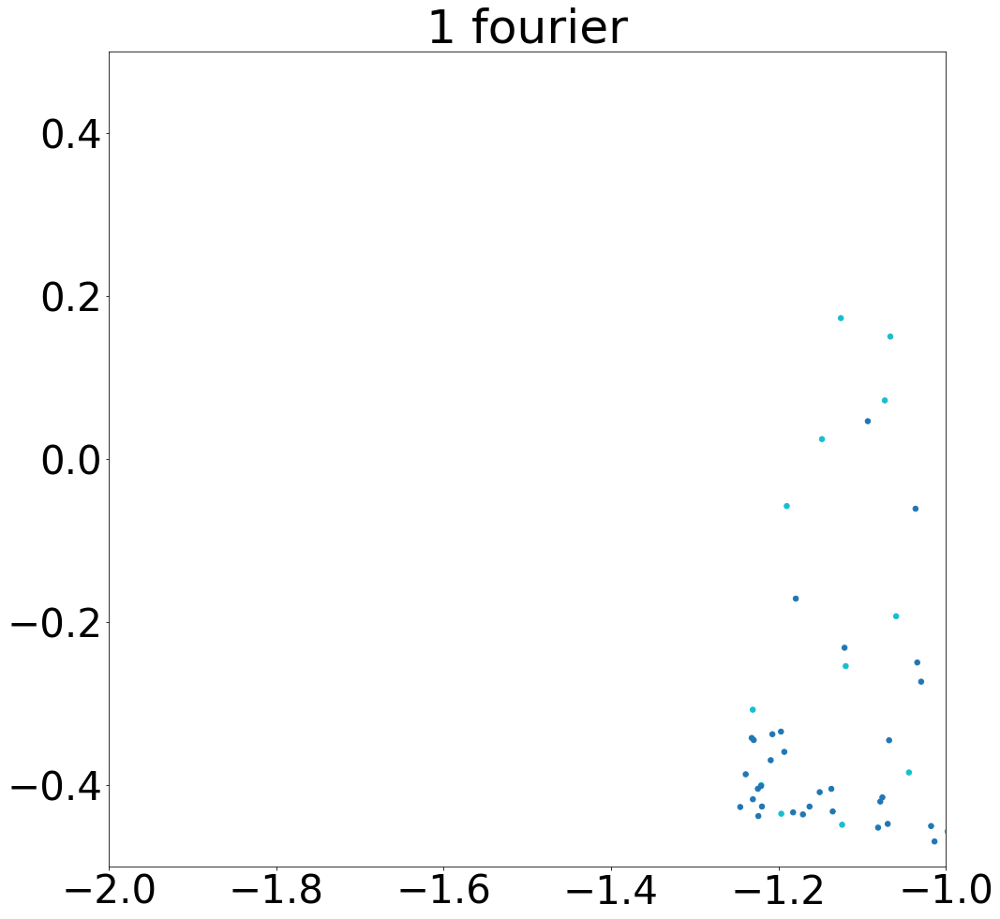

In [15]:
from sklearn.decomposition import PCA
pca = PCA(n_components=2)
PCA_DR = pca.fit_transform(scaled_train_data[:,:,41])
print(PCA_DR.shape)
#scatter_plot(PCA_DR)
fig, ax = plt.subplots(figsize=(16, 16))
sc = ax.scatter(
    PCA_DR[:, 0],
    PCA_DR[:, 1],
    c=train_labels.astype(int),
    cmap="tab10",
    s=30,
    alpha=1,
    rasterized=True,
)
plt.title("1")
median_0s = np.zeros(len(train_labels))
median_1s = np.zeros(len(train_labels))

mean_0s = np.zeros(len(train_labels))
mean_1s = np.zeros(len(train_labels))

for index in range(len(train_labels)):
    median_0, median_1, mean_0, mean_1 = mean_median(index,PCA_DR,train_labels)
    median_0s[index] = median_0
    median_1s[index] = median_1
    
    mean_0s[index] = mean_0
    mean_1s[index] = mean_1

mean_0_0s = np.zeros(len(train_labels))
mean_0_1s = np.zeros(len(train_labels))
mean_1_1s = np.zeros(len(train_labels))

median_0_0s = np.zeros(len(train_labels))
median_0_1s = np.zeros(len(train_labels))
median_1_1s = np.zeros(len(train_labels))

for index in range(len(mean_0s)):
    
    if train_labels[index] == 0:
        mean_0_0s[index] = mean_0s[index]
        median_0_0s[index] = median_0s[index]
    else:
        mean_0_1s[index] = mean_0s[index]
        mean_1_1s[index] = mean_1s[index]
        
        median_0_1s[index] = median_0s[index]
        median_1_1s[index] = median_1s[index]

mean_0_0s = mean_0_0s[mean_0_0s != 0]
mean_0_1s = mean_0_1s[mean_0_1s != 0]
mean_1_1s = mean_1_1s[mean_1_1s != 0]
      
median_0_0s = median_0_0s[median_0_0s != 0]
median_0_1s = median_0_1s[median_0_1s != 0]
median_1_1s = median_1_1s[median_1_1s != 0]

mean_between_unpleasant_unpleasant = np.mean(mean_0_0s)
mean_between_pleasant_unpleasant = np.mean(mean_0_1s)
mean_between_pleasant_pleasant = np.mean(mean_1_1s)

median_between_unpleasant_unpleasant = np.median(median_0_0s)
median_between_pleasant_unpleasant = np.median(median_0_1s)
median_between_pleasant_pleasant = np.median(median_1_1s)

print("mean unp to unp", mean_between_unpleasant_unpleasant)
print("mean unp to p", mean_between_pleasant_unpleasant)
print("mean p to p", mean_between_pleasant_pleasant)

print("median unp to unp", median_between_unpleasant_unpleasant)
print("median unp to p", median_between_pleasant_unpleasant)
print("median p to p", median_between_pleasant_pleasant)
pca = PCA(n_components=2)
PCA_DR = pca.fit_transform(train_fourier[:,:,41])

#scatter_plot(PCA_DR)
fig, ax = plt.subplots(figsize=(16, 16))
sc = ax.scatter(
    PCA_DR[:, 0],
    PCA_DR[:, 1],
    c=train_labels.astype(int),
    cmap="tab10",
    s=30,
    alpha=1,
    rasterized=True,
)
plt.title("1 fourier")
plt.xlim(-2,-1)
plt.ylim(-0.5,0.5)

# Plot and distance for all electrodes for actual data

0: Fp1
mean unp to unp 17.592162897942593
mean unp to p 25.468408581882823
mean p to p 31.630061894745534
median unp to unp 10.057387874390692
median unp to p 22.194538147491418
median p to p 27.481875857691826
1: AF7
mean unp to unp 18.995195282250492
mean unp to p 24.83580609616531
mean p to p 29.967533524545473
median unp to unp 10.21244367815694
median unp to p 19.52504706462299
median p to p 23.496091650341207
2: AF3
mean unp to unp 18.139378081246072
mean unp to p 24.549095447563555
mean p to p 29.95201549980449
median unp to unp 10.768671447698395
median unp to p 19.436364231867273
median p to p 24.1683513914489
3: F1
mean unp to unp 19.2928980393712
mean unp to p 23.892213360706148
mean p to p 27.824835007740308
median unp to unp 11.837191856264498
median unp to p 19.53539243754658
median p to p 22.18462213476573
4: F3
mean unp to unp 18.908936600187026
mean unp to p 23.755189632134403
mean p to p 27.991732851309823
median unp to unp 11.921282333975569
median unp to p 20.934172

/opt/anaconda3/envs/behavenet/lib/python3.7/site-packages/ipykernel_launcher.py:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


20: P3
mean unp to unp 19.595393530453233
mean unp to p 19.157674696278004
mean p to p 19.00943318069279
median unp to unp 14.97734061915144
median unp to p 16.853745482616993
median p to p 16.271564014540576
--------------SUCCEESS----------------------
21: P5
mean unp to unp 18.074033997512213
mean unp to p 19.134335782520868
mean p to p 20.326199179245986
median unp to unp 13.656320789944633
median unp to p 16.1418000365924
median p to p 17.810639271014047
22: P7
mean unp to unp 18.433450698331143
mean unp to p 18.734095659099367
mean p to p 19.191120602513674
median unp to unp 15.31644361321156
median unp to p 15.814834679557897
median p to p 16.772914058369043
23: P9
mean unp to unp 19.285821292910825
mean unp to p 19.287545421725827
mean p to p 19.253571482579382
median unp to unp 13.868425102262817
median unp to p 16.218947804445087
median p to p 18.365572210838835
--------------SUCCEESS----------------------
24: PO7
mean unp to unp 17.963127565970495
mean unp to p 17.93442096054

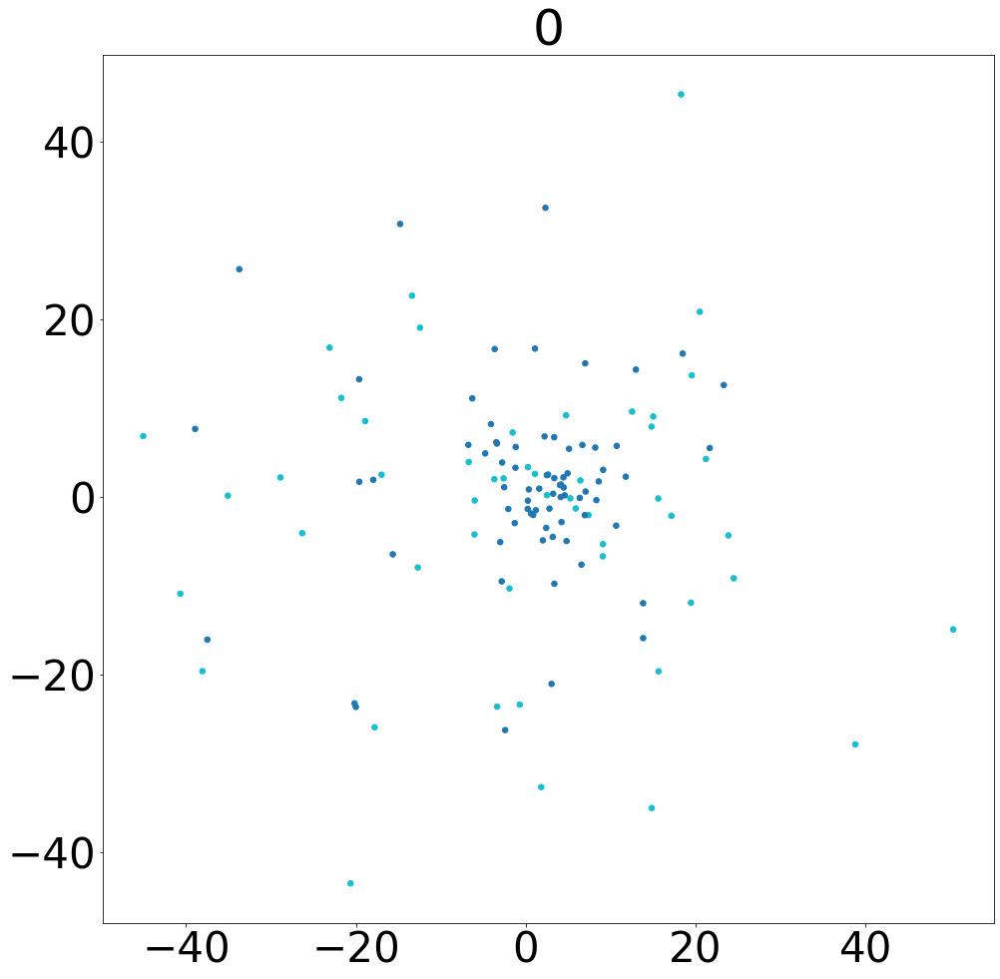

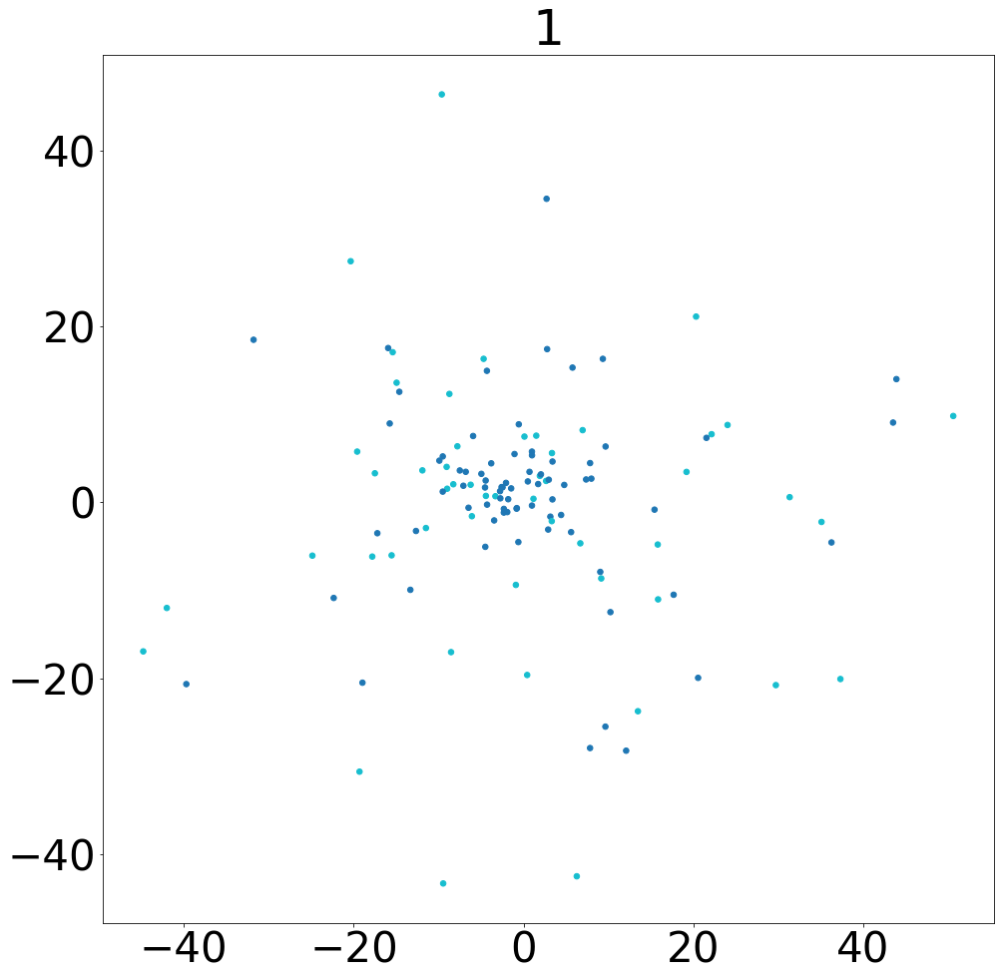

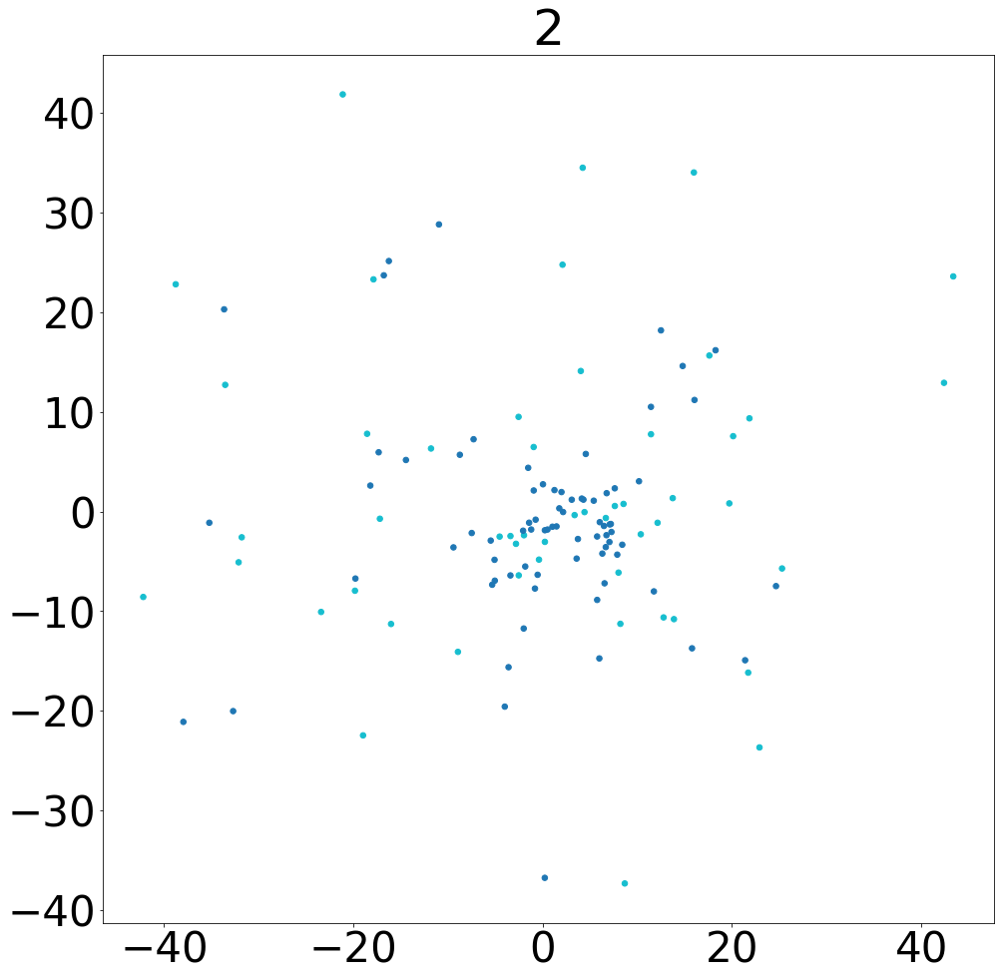

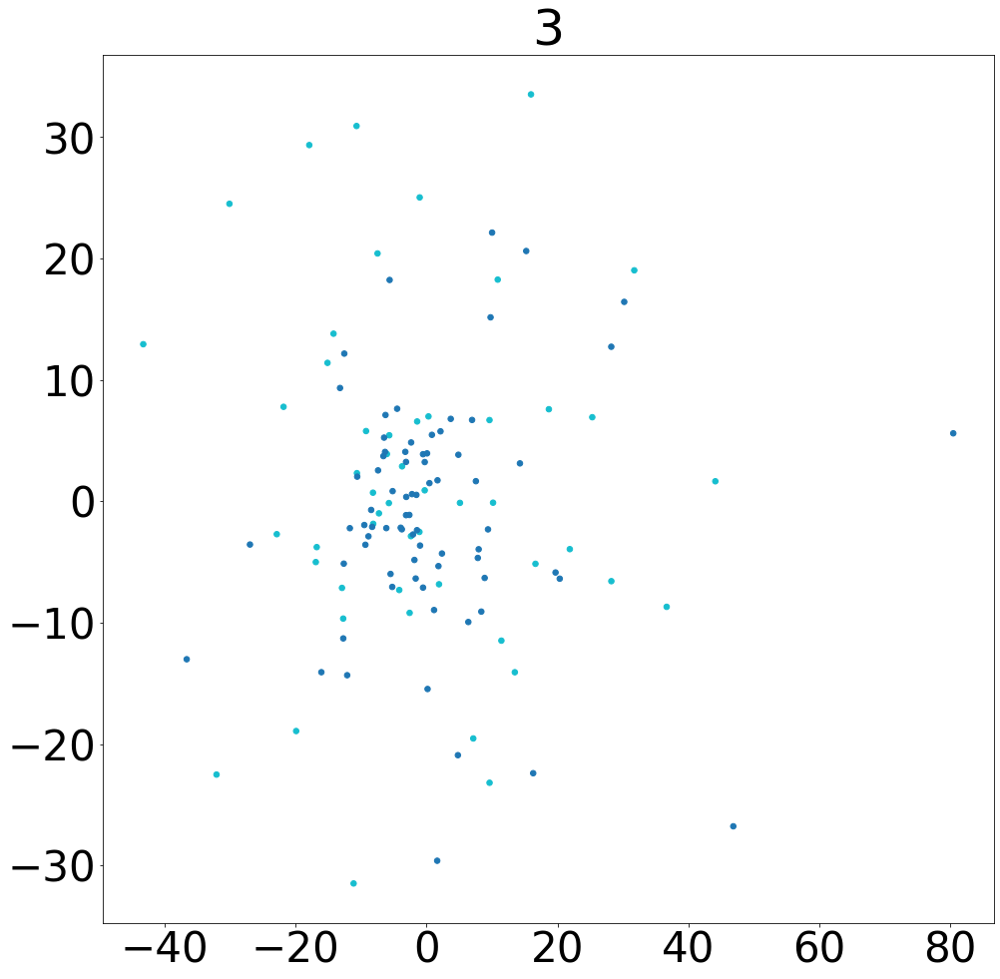

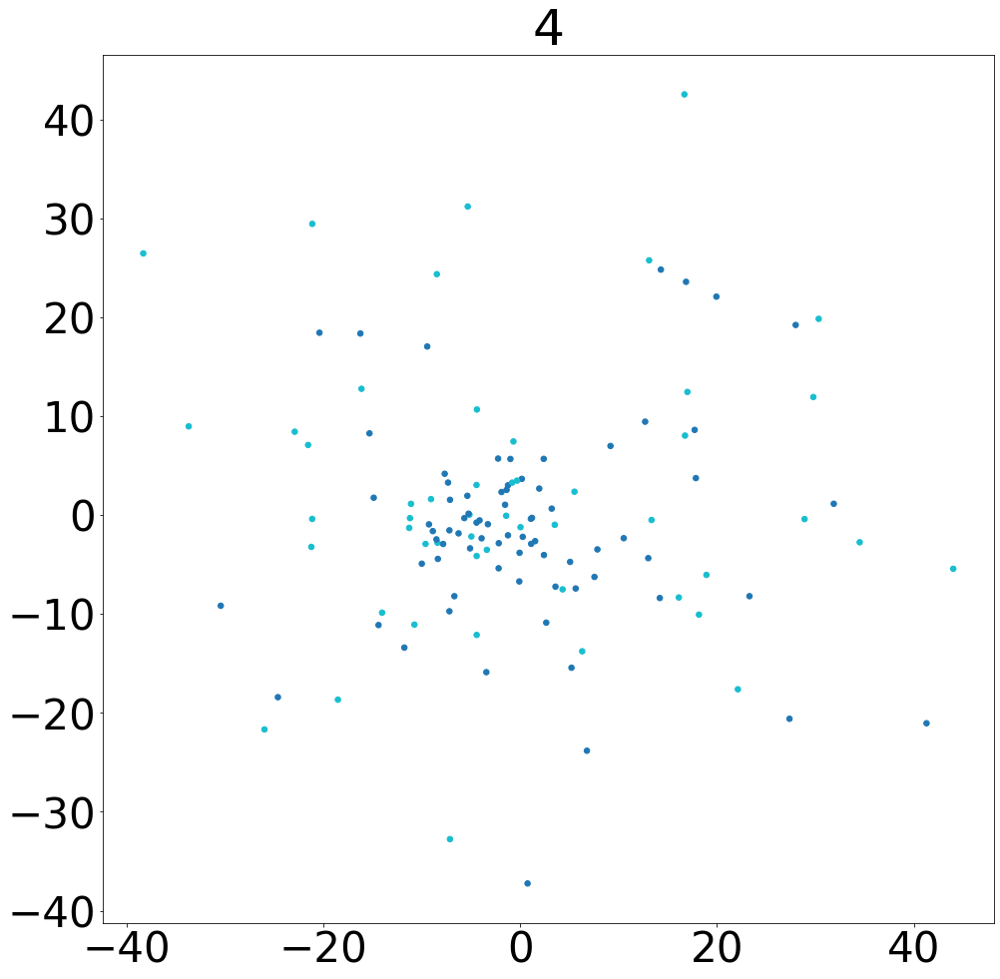

...

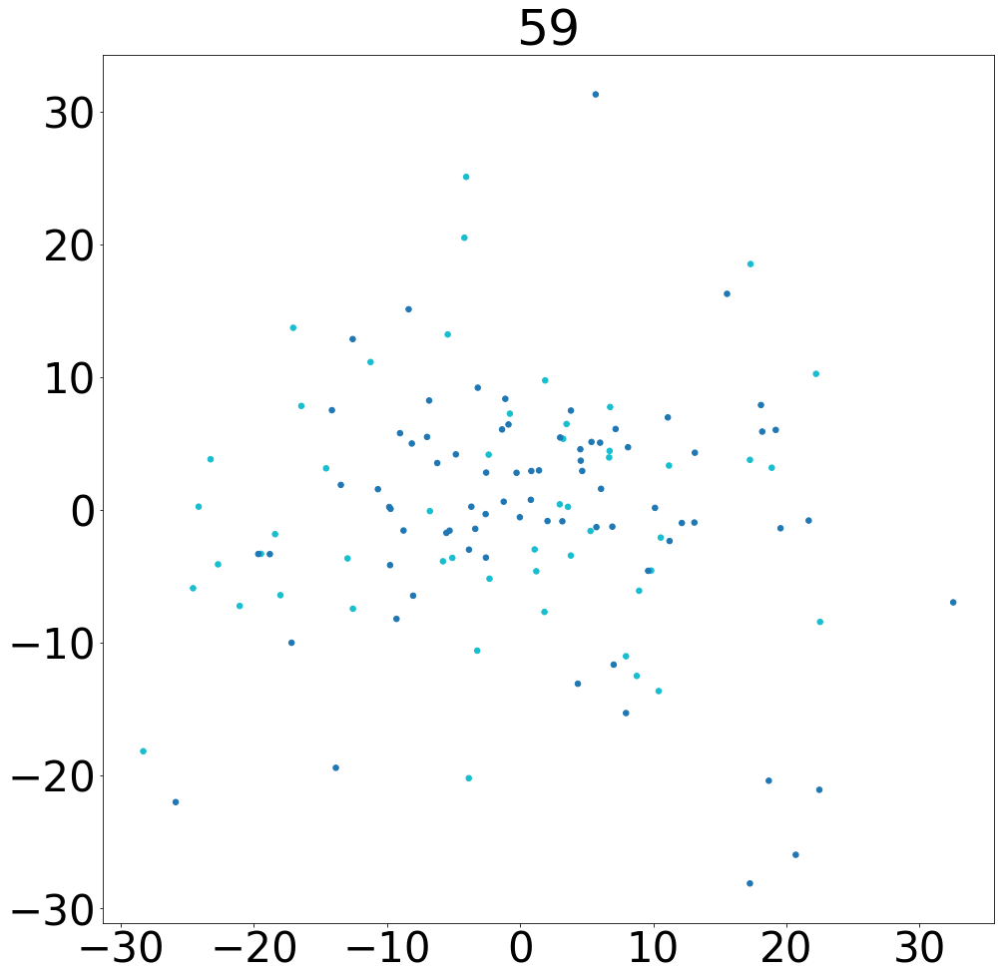

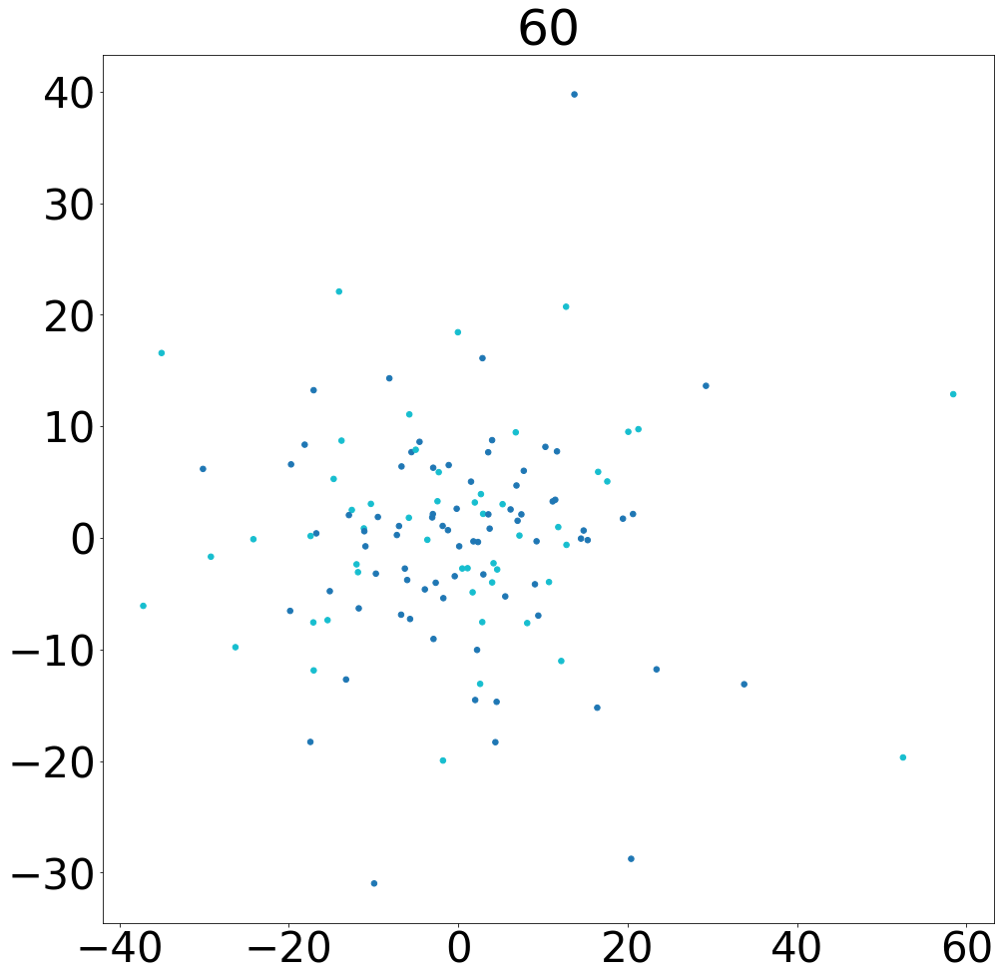

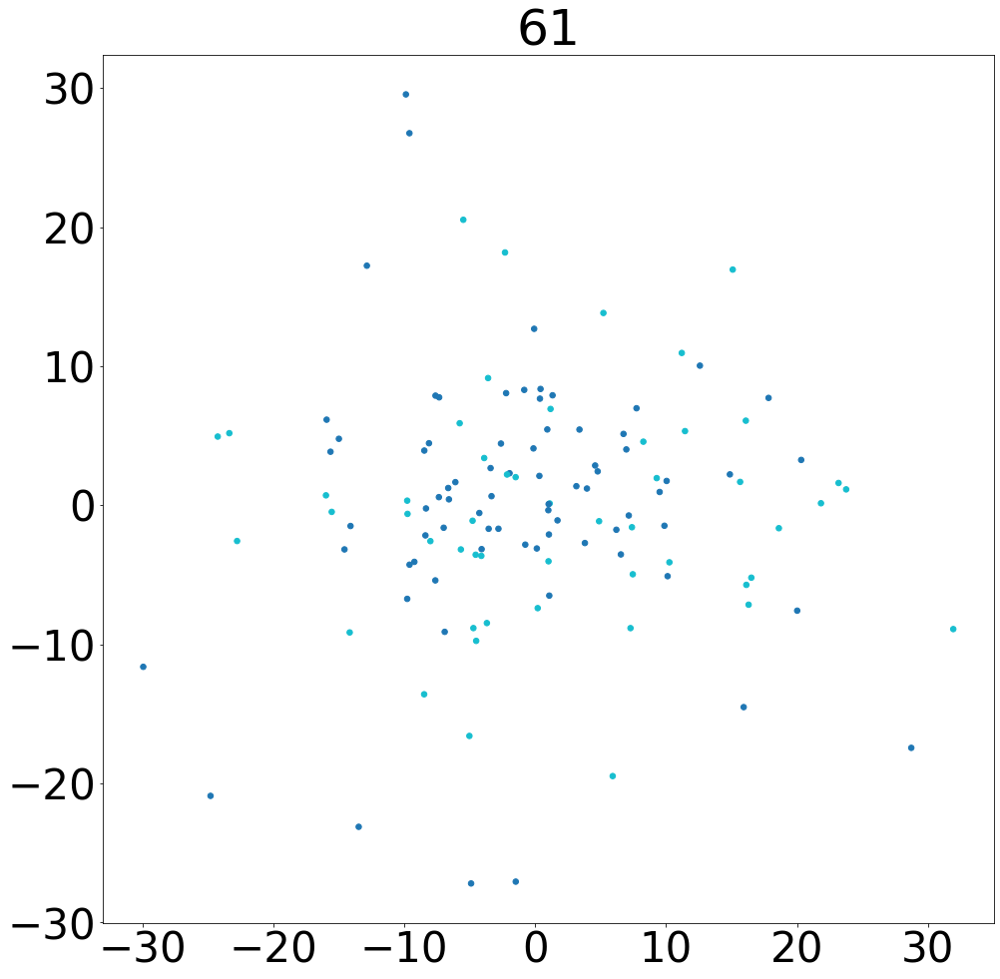

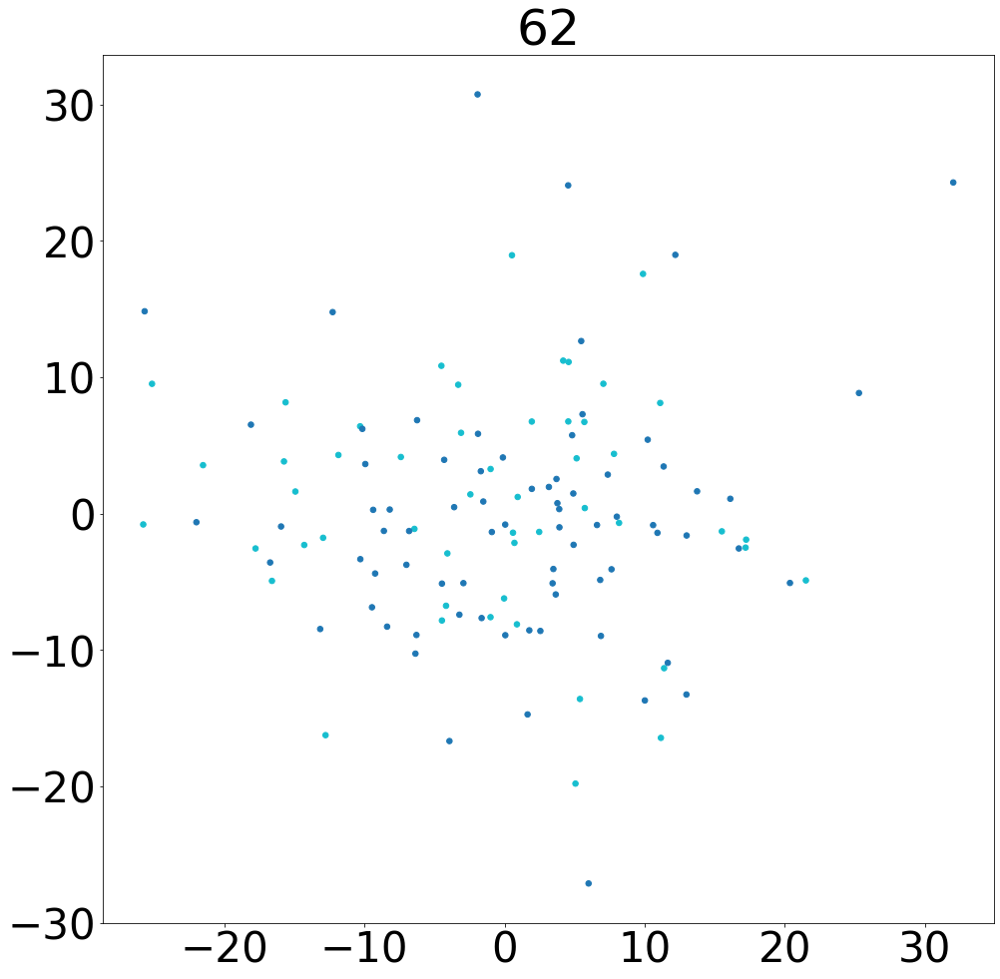

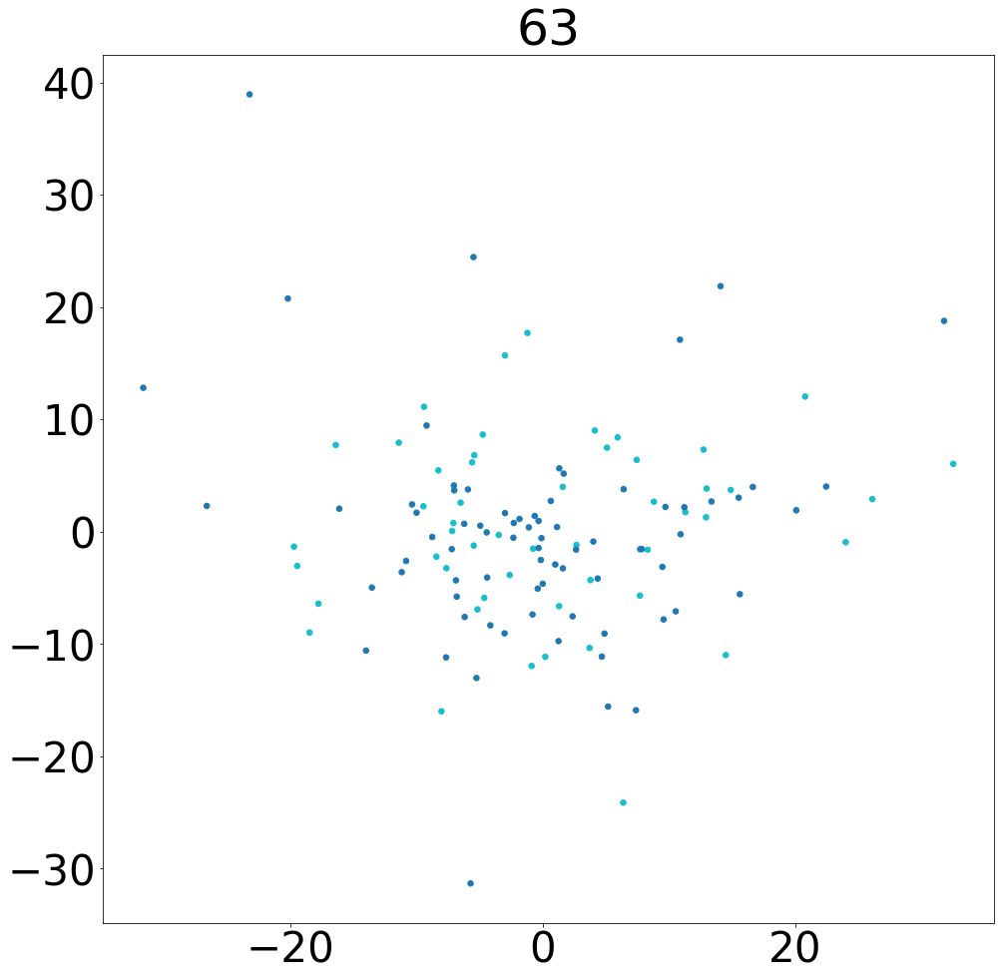

In [67]:
for i in range(scaled_train_data.shape[2]):
    pca = PCA(n_components=2)
    PCA_DR = pca.fit_transform(scaled_train_data[:,:,i])

    #scatter_plot(PCA_DR)
    fig, ax = plt.subplots(figsize=(16, 16))
    sc = ax.scatter(
        PCA_DR[:, 0],
        PCA_DR[:, 1],
        c=train_labels.astype(int),
        cmap="tab10",
        s=30,
        alpha=1,
        rasterized=True,
    )
    plt.title(i)
    
    median_0s = np.zeros(len(train_labels))
    median_1s = np.zeros(len(train_labels))

    mean_0s = np.zeros(len(train_labels))
    mean_1s = np.zeros(len(train_labels))

    for index in range(len(train_labels)):
        median_0, median_1, mean_0, mean_1 = mean_median(index, PCA_DR, train_labels)
        median_0s[index] = median_0
        median_1s[index] = median_1

        mean_0s[index] = mean_0
        mean_1s[index] = mean_1

    mean_0_0s = np.zeros(len(train_labels))
    mean_0_1s = np.zeros(len(train_labels))
    mean_1_1s = np.zeros(len(train_labels))

    median_0_0s = np.zeros(len(train_labels))
    median_0_1s = np.zeros(len(train_labels))
    median_1_1s = np.zeros(len(train_labels))

    for index in range(len(mean_0s)):

        if train_labels[index] == 0:
            mean_0_0s[index] = mean_0s[index]
            median_0_0s[index] = median_0s[index]
        else:
            mean_0_1s[index] = mean_0s[index]
            mean_1_1s[index] = mean_1s[index]

            median_0_1s[index] = median_0s[index]
            median_1_1s[index] = median_1s[index]

    mean_0_0s = mean_0_0s[mean_0_0s != 0]
    mean_0_1s = mean_0_1s[mean_0_1s != 0]
    mean_1_1s = mean_1_1s[mean_1_1s != 0]

    median_0_0s = median_0_0s[median_0_0s != 0]
    median_0_1s = median_0_1s[median_0_1s != 0]
    median_1_1s = median_1_1s[median_1_1s != 0]

    mean_between_unpleasant_unpleasant = np.mean(mean_0_0s)
    mean_between_pleasant_unpleasant = np.mean(mean_0_1s)
    mean_between_pleasant_pleasant = np.mean(mean_1_1s)

    median_between_unpleasant_unpleasant = np.median(median_0_0s)
    median_between_pleasant_unpleasant = np.median(median_0_1s)
    median_between_pleasant_pleasant = np.median(median_1_1s)
    print(str(i) + ": " + electrode_names[i])
    print("mean unp to unp", mean_between_unpleasant_unpleasant)
    print("mean unp to p", mean_between_pleasant_unpleasant)
    print("mean p to p", mean_between_pleasant_pleasant)
    if (mean_between_unpleasant_unpleasant/mean_between_pleasant_unpleasant) < 0.9 and (mean_between_pleasant_pleasant/mean_between_pleasant_unpleasant) < 0.9:
        print("HEUREKA-----------------------")
    print("median unp to unp", median_between_unpleasant_unpleasant)
    print("median unp to p", median_between_pleasant_unpleasant)
    print("median p to p", median_between_pleasant_pleasant)
    if (median_between_unpleasant_unpleasant/median_between_pleasant_unpleasant) < 0.9 and (median_between_pleasant_pleasant/median_between_pleasant_unpleasant) < 0.9:
        print("HEUREKA-----------------------")
    
    if mean_between_unpleasant_unpleasant < mean_between_pleasant_unpleasant and mean_between_pleasant_pleasant < mean_between_pleasant_unpleasant:
        print("--------------SUCCEESS----------------------")
        
    if median_between_unpleasant_unpleasant < median_between_pleasant_unpleasant and median_between_pleasant_pleasant < median_between_pleasant_unpleasant:
        print("--------------SUCCEESS----------------------")

# Plot PCA of fourier spectrum for all data

/opt/anaconda3/envs/behavenet/lib/python3.7/site-packages/ipykernel_launcher.py:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


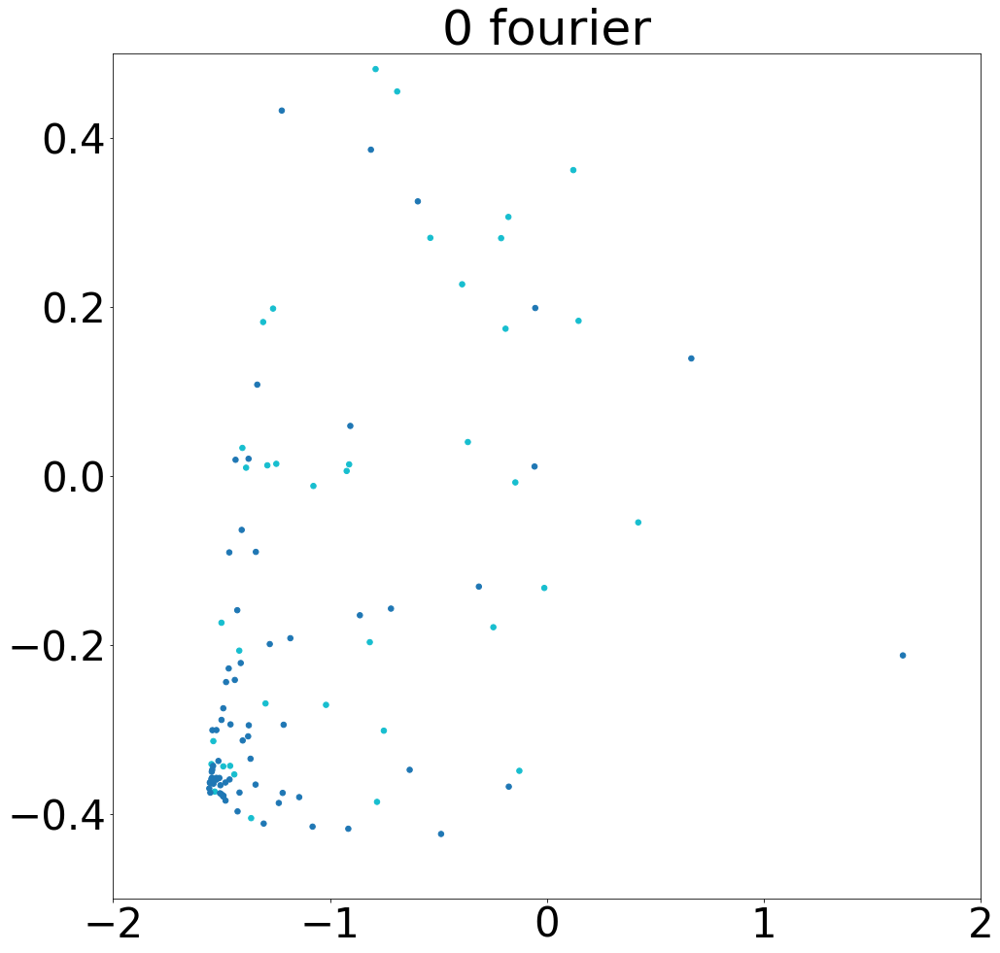

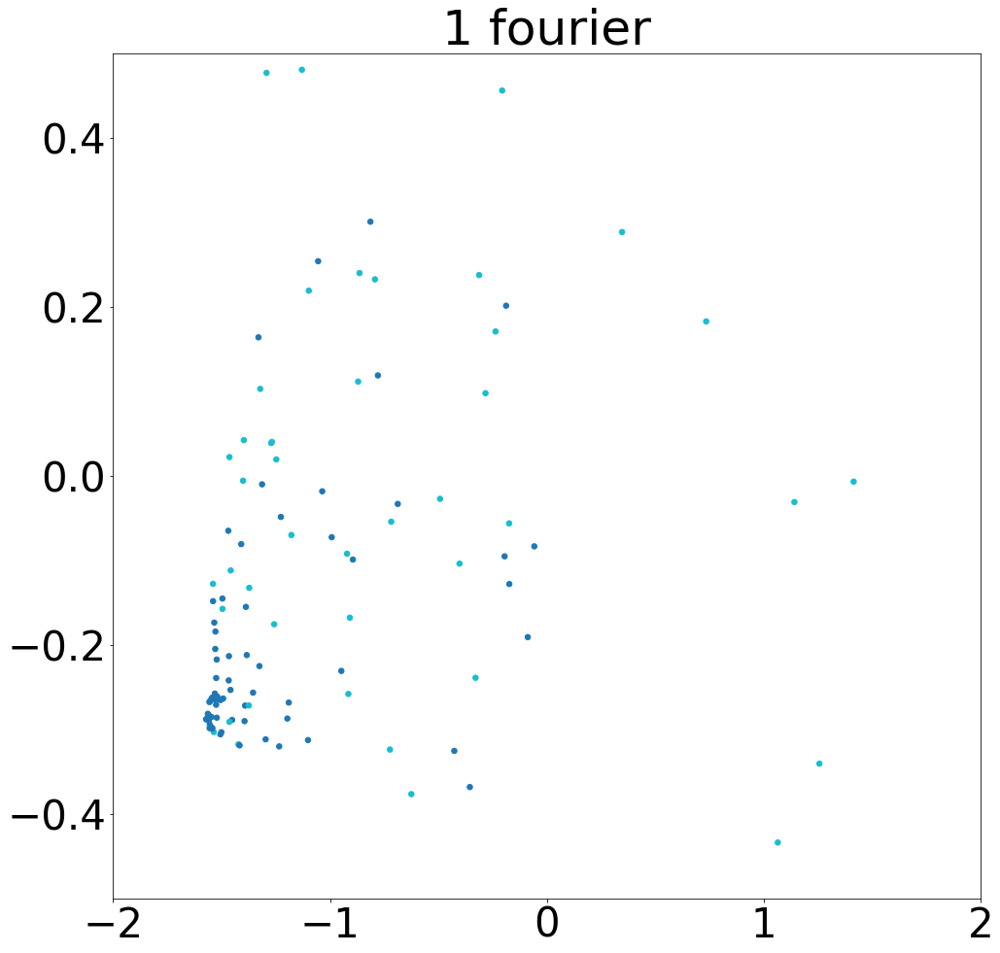

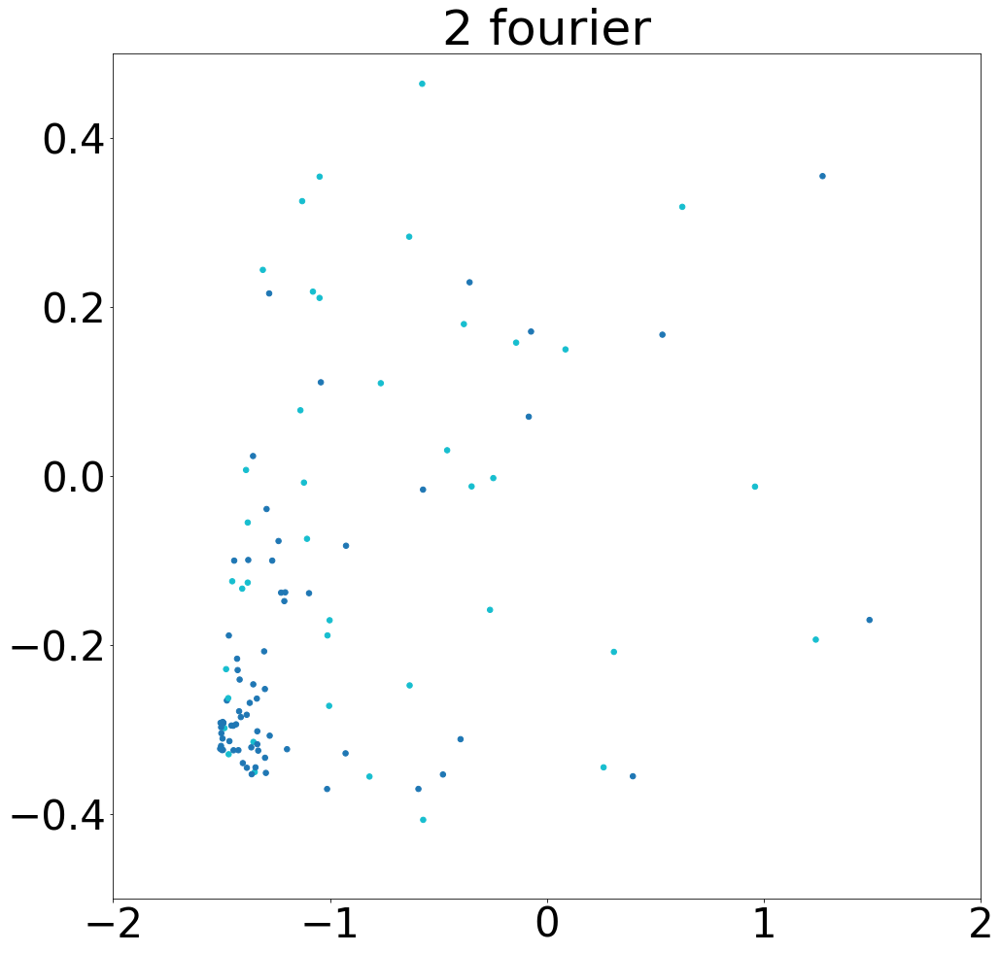

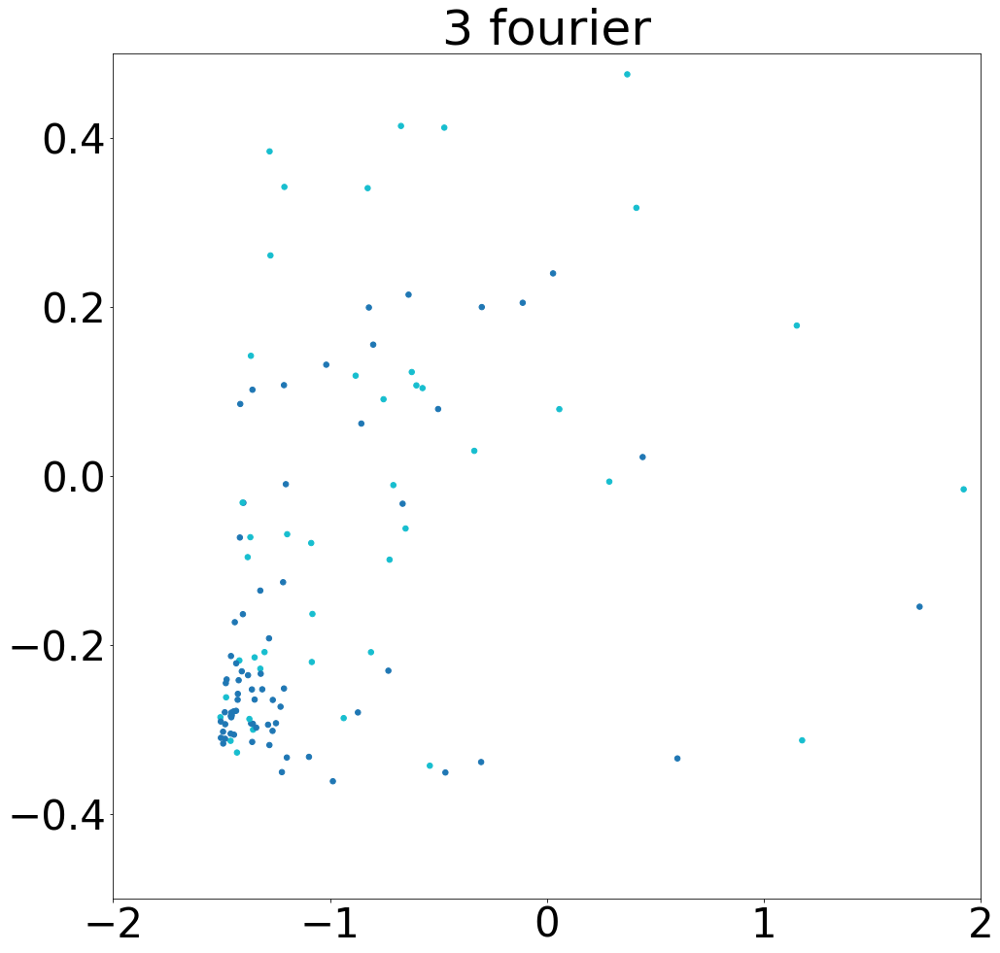

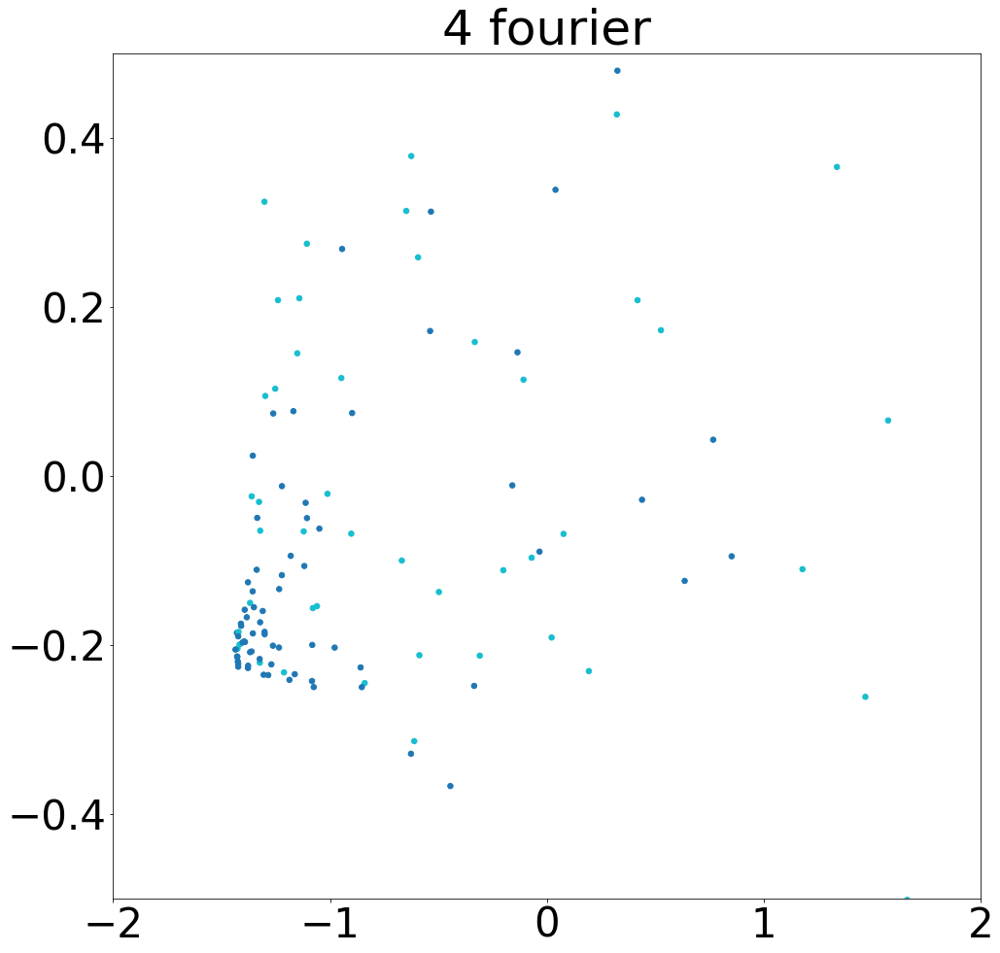

...

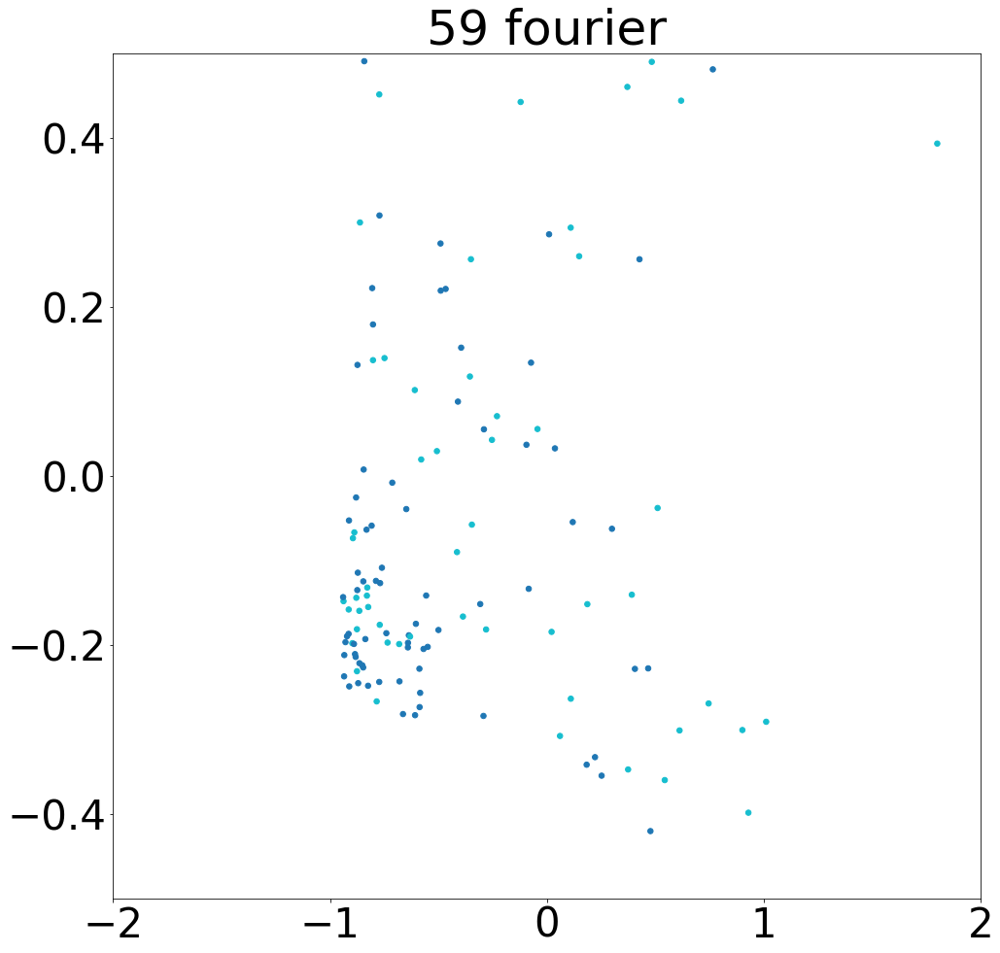

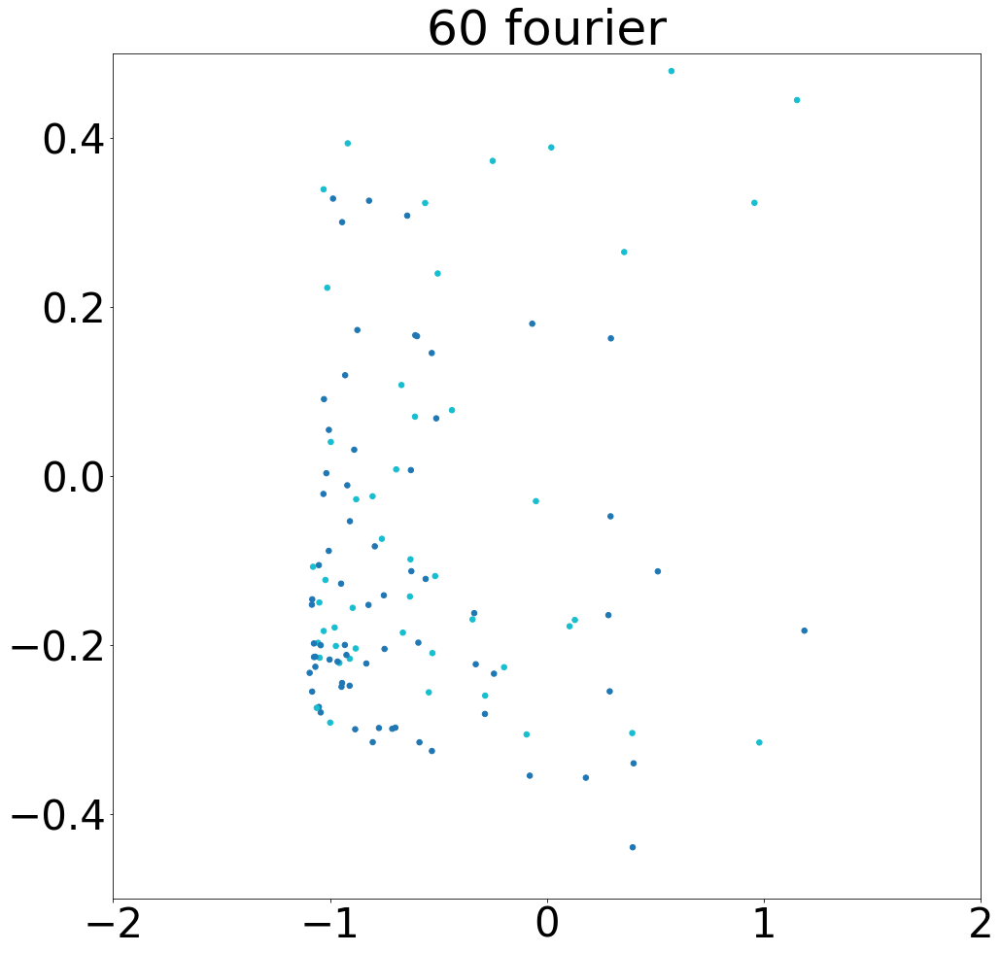

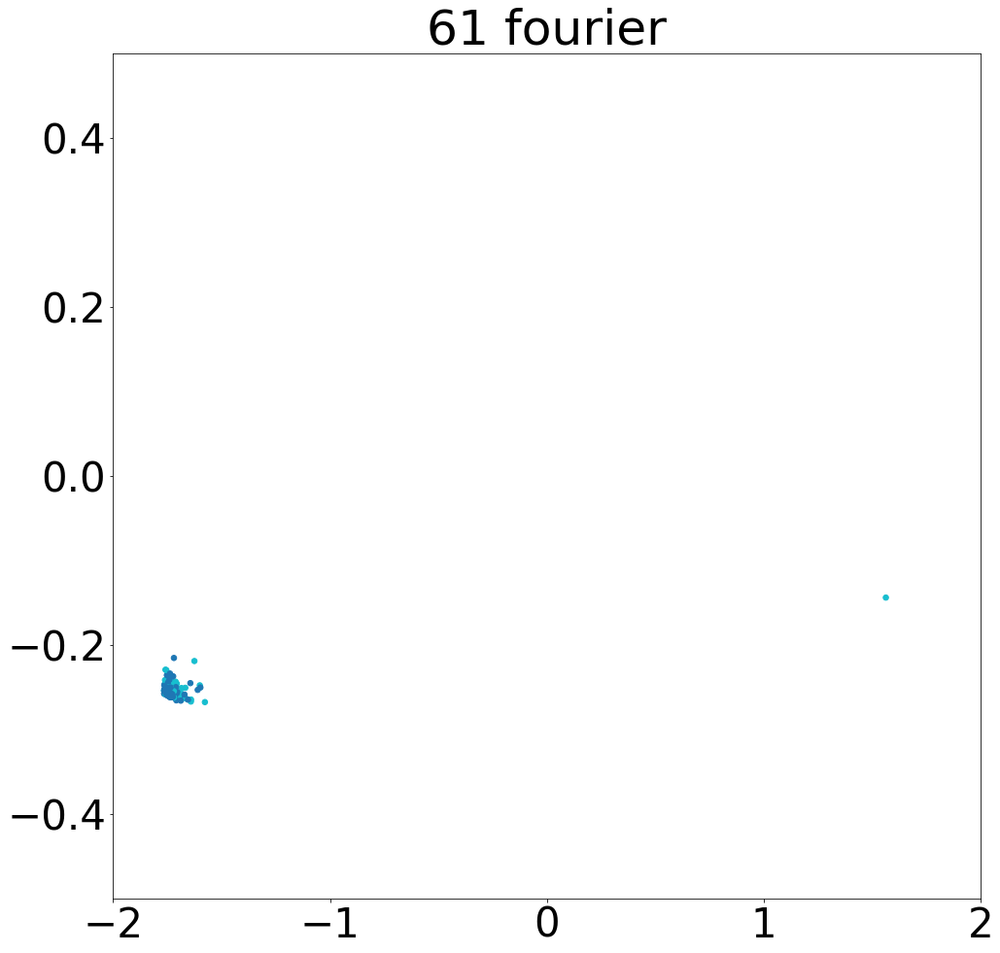

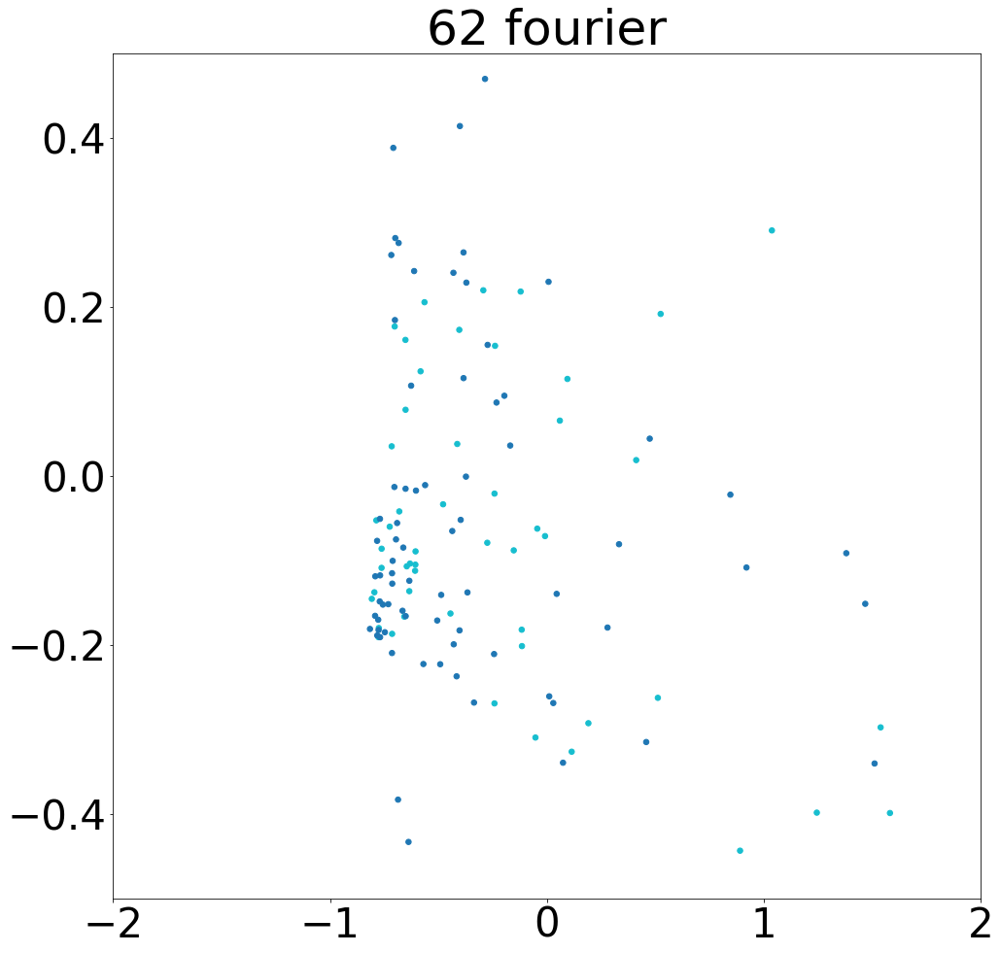

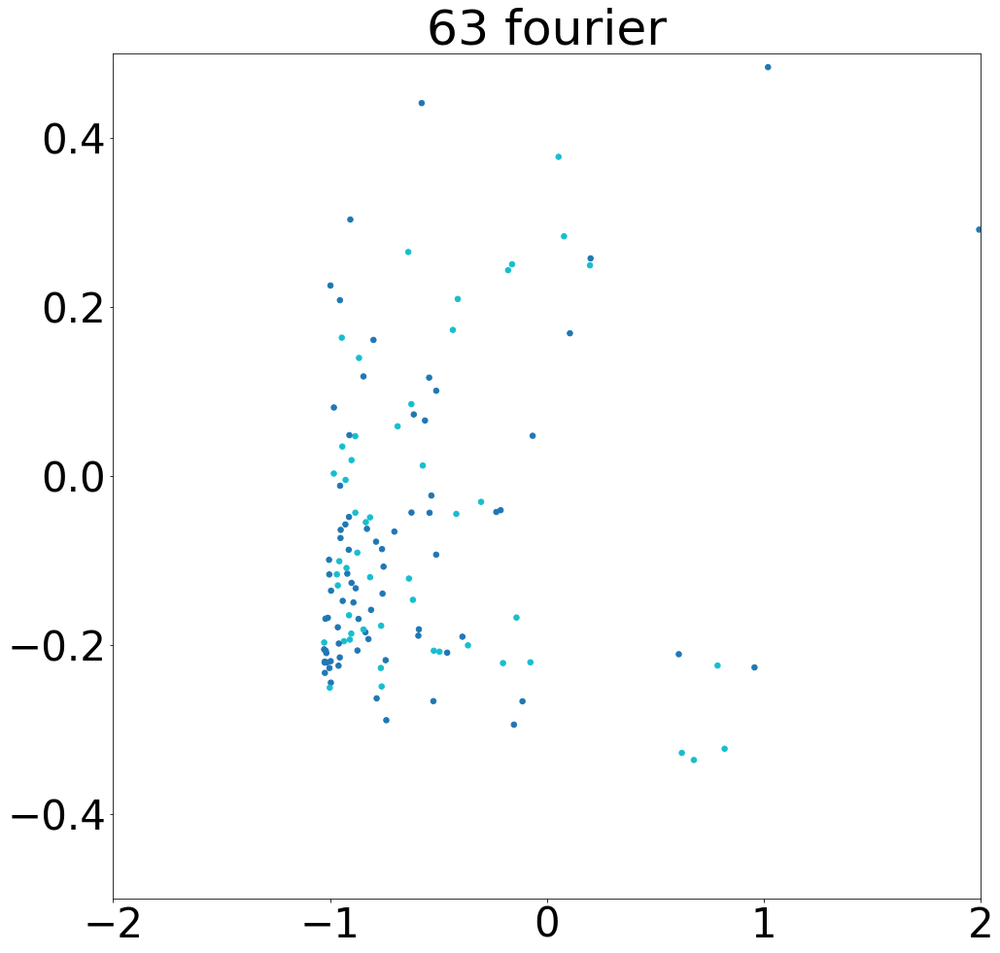

In [113]:

for i in range(scaled_train_data.shape[2]):
    pca = PCA(n_components=2)
    PCA_DR = pca.fit_transform(train_fourier[:,:,i])

    #scatter_plot(PCA_DR)
    fig, ax = plt.subplots(figsize=(16, 16))
    sc = ax.scatter(
        PCA_DR[:, 0],
        PCA_DR[:, 1],
        c=train_labels.astype(int),
        cmap="tab10",
        s=30,
        alpha=1,
        rasterized=True,
    )
    plt.title(str(i) + " fourier")
    plt.xlim(-2,2)
    plt.ylim(-0.5,0.5)

# Find the distance between classes for all electrodes in fourier domain

In [256]:

h_num = 9
k_class_scores = np.zeros(64)
f_s = 256
#Beta 8-13 Hz
heurekas = np.zeros((h_num,train_labels.shape[0],2))
heurekas_n = np.zeros(h_num)
heurekas_test = np.zeros((h_num,test_labels.shape[0],2))
heureka_i = 0
arr_mean_p_p = []
arr_mean_u_u = []
arr_med_p_p = np.zeros(64)
arr_med_u_u = np.zeros(64)
for i in range(scaled_train_data.shape[2]):
    sig = scaled_train_data[:,:,i]
    sos = signal.butter(10, [8,25], 'band', fs=f_s, output='sos')
    filtered = signal.sosfilt(sos, sig)
    
    filtered_fourier = np.zeros((scaled_train_data.shape[0],385))
    for j in range(scaled_train_data.shape[0]):
        f, pxx = signal.periodogram(filtered[j], f_s)
        #print(pxx.shape)
        filtered_fourier[j,:] = pxx
    pca = PCA(n_components=2)
    PCA_DR = pca.fit_transform(filtered_fourier)
    X = PCA_DR
    y = train_labels
    X = StandardScaler().fit_transform(X)
    X_train, X_test, y_train, y_test = \
    train_test_split(X, y, test_size=.4, random_state=42)
    clf = KNeighborsClassifier(3)
    clf.fit(X_train, y_train)
    score = clf.score(X_test, y_test)

    k_class_scores[i] = score
    
    median_0s = np.zeros(len(train_labels))
    median_1s = np.zeros(len(train_labels))

    mean_0s = np.zeros(len(train_labels))
    mean_1s = np.zeros(len(train_labels))

    for index in range(len(train_labels)):
        median_0, median_1, mean_0, mean_1 = mean_median(index, PCA_DR, train_labels)
        median_0s[index] = median_0
        median_1s[index] = median_1

        mean_0s[index] = mean_0
        mean_1s[index] = mean_1

    mean_0_0s = np.zeros(len(train_labels))
    mean_0_1s = np.zeros(len(train_labels))
    mean_1_1s = np.zeros(len(train_labels))

    median_0_0s = np.zeros(len(train_labels))
    median_0_1s = np.zeros(len(train_labels))
    median_1_1s = np.zeros(len(train_labels))

    for index in range(len(mean_0s)):

        if train_labels[index] == 0:
            mean_0_0s[index] = mean_0s[index]
            median_0_0s[index] = median_0s[index]
        else:
            mean_0_1s[index] = mean_0s[index]
            mean_1_1s[index] = mean_1s[index]

            median_0_1s[index] = median_0s[index]
            median_1_1s[index] = median_1s[index]

    mean_0_0s = mean_0_0s[mean_0_0s != 0]
    mean_0_1s = mean_0_1s[mean_0_1s != 0]
    mean_1_1s = mean_1_1s[mean_1_1s != 0]

    median_0_0s = median_0_0s[median_0_0s != 0]
    median_0_1s = median_0_1s[median_0_1s != 0]
    median_1_1s = median_1_1s[median_1_1s != 0]

    mean_between_unpleasant_unpleasant = np.mean(mean_0_0s)
    mean_between_pleasant_unpleasant = np.mean(mean_0_1s)
    mean_between_pleasant_pleasant = np.mean(mean_1_1s)

    median_between_unpleasant_unpleasant = np.median(median_0_0s)
    median_between_pleasant_unpleasant = np.median(median_0_1s)
    median_between_pleasant_pleasant = np.median(median_1_1s)
    
    print(i)
    print(electrode_names[i])
    #print("mean unp to unp", mean_between_unpleasant_unpleasant)
    #print("mean unp to p", mean_between_pleasant_unpleasant)
    #print("mean p to p", mean_between_pleasant_pleasant)
    print("mean ratio u", (mean_between_unpleasant_unpleasant/mean_between_pleasant_unpleasant))
    print("mean ratio p", (mean_between_pleasant_pleasant/mean_between_pleasant_unpleasant))
    if (mean_between_unpleasant_unpleasant/mean_between_pleasant_unpleasant) < 0.9 and (mean_between_pleasant_pleasant/mean_between_pleasant_unpleasant) < 0.9:
        print("MEAN HEUREKA-----------------------")
    #print("median unp to unp", median_between_unpleasant_unpleasant)
    #print("median unp to p", median_between_pleasant_unpleasant)
    #print("median p to p", median_between_pleasant_pleasant)
    print("median ratio u", (median_between_unpleasant_unpleasant/median_between_pleasant_unpleasant))
    print("median ratio p",(median_between_pleasant_pleasant/median_between_pleasant_unpleasant))
    if (median_between_unpleasant_unpleasant/median_between_pleasant_unpleasant) < 0.9 and (median_between_pleasant_pleasant/median_between_pleasant_unpleasant) < 0.9:
        print("MEDIAN HEUREKA----------------------- " + str((median_between_unpleasant_unpleasant/median_between_pleasant_unpleasant)) +", " + str((median_between_pleasant_pleasant/median_between_pleasant_unpleasant)))
    print("K-neighbours classifier score: " + str(score))
    if ((mean_between_unpleasant_unpleasant/mean_between_pleasant_unpleasant) < 0.9 and (mean_between_pleasant_pleasant/mean_between_pleasant_unpleasant) < 0.9) or ((median_between_unpleasant_unpleasant/median_between_pleasant_unpleasant) < 0.9 and (median_between_pleasant_pleasant/median_between_pleasant_unpleasant) < 0.9): 
        heurekas[heureka_i] = PCA_DR
        sig = scaled_test_data[:,:,i]
        sos = signal.butter(10, [8,13], 'band', fs=f_s, output='sos')
        filtered = signal.sosfilt(sos, sig)
        filtered_fourier = np.zeros((scaled_test_data.shape[0],385))
        for j in range(scaled_test_data.shape[0]):
            f, pxx = signal.periodogram(filtered[j], f_s)
            #print(pxx.shape)
            filtered_fourier[j,:] = pxx
        #pca = PCA(n_components=2)
        PCA_DR_test = pca.fit_transform(filtered_fourier)
        heurekas_test[heureka_i] = PCA_DR_test
        
        heurekas_n[heureka_i] = i
        #print("heureka " + str(i))
        heureka_i +=1
        print("num of heurekas ",heureka_i)


     
    if mean_between_unpleasant_unpleasant < mean_between_pleasant_unpleasant and mean_between_pleasant_pleasant < mean_between_pleasant_unpleasant:
        print("--------------SUCCEESS----------------------")
        
    if median_between_unpleasant_unpleasant < median_between_pleasant_unpleasant and median_between_pleasant_pleasant < median_between_pleasant_unpleasant:
        print("--------------SUCCEESS----------------------")
        
    arr_mean_p_p.append(mean_between_unpleasant_unpleasant/mean_between_pleasant_unpleasant)
    arr_mean_u_u.append(mean_between_pleasant_pleasant/mean_between_pleasant_unpleasant)
    arr_med_u_u[i] = (median_between_unpleasant_unpleasant/median_between_pleasant_unpleasant)
    arr_med_p_p[i] = (median_between_pleasant_pleasant/median_between_pleasant_unpleasant)
    #scatter_plot(PCA_DR)
    

    


0
Fp1
mean ratio u 1.1349890059334597
mean ratio p 0.6949177828885876
median ratio u 1.076905556453289
median ratio p 0.48273489268494085
K-neighbours classifier score: 0.9508196721311475
1
AF7
mean ratio u 0.9728773079829053
mean ratio p 0.5243102065402303
median ratio u 0.913894317388312
median ratio p 0.24531697223691287
K-neighbours classifier score: 0.8852459016393442
--------------SUCCEESS----------------------
--------------SUCCEESS----------------------
2
AF3
mean ratio u 1.1313920850319727
mean ratio p 0.5802950436003816
median ratio u 0.9187992507278352
median ratio p 0.35002437978123435
K-neighbours classifier score: 0.9508196721311475
--------------SUCCEESS----------------------
3
F1
mean ratio u 1.1882908864234463
mean ratio p 0.626848952098605
median ratio u 1.147031444219318
median ratio p 0.3355162255469487
K-neighbours classifier score: 0.9508196721311475
4
F3
mean ratio u 1.08616549217227
mean ratio p 0.5744570578157525
median ratio u 0.887621926387131
median ratio p 

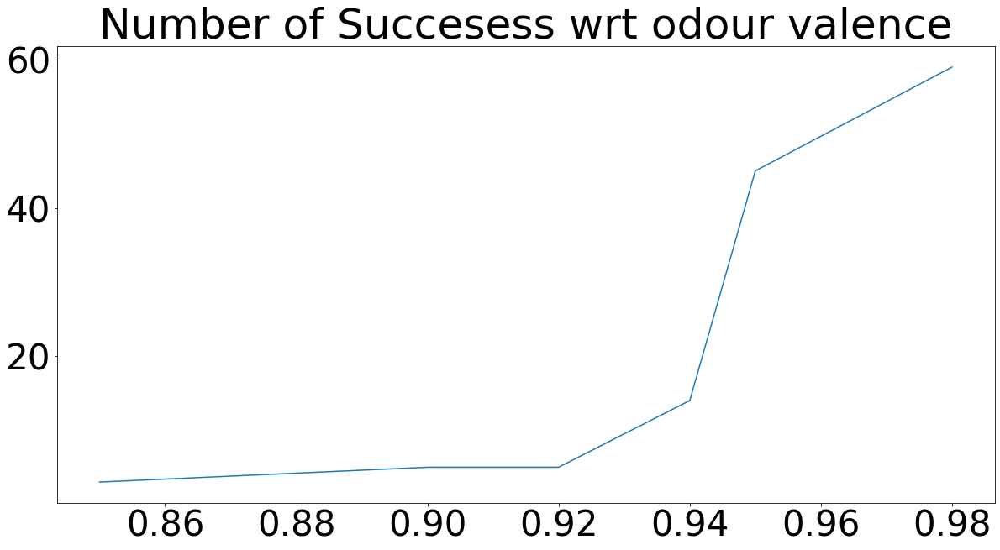

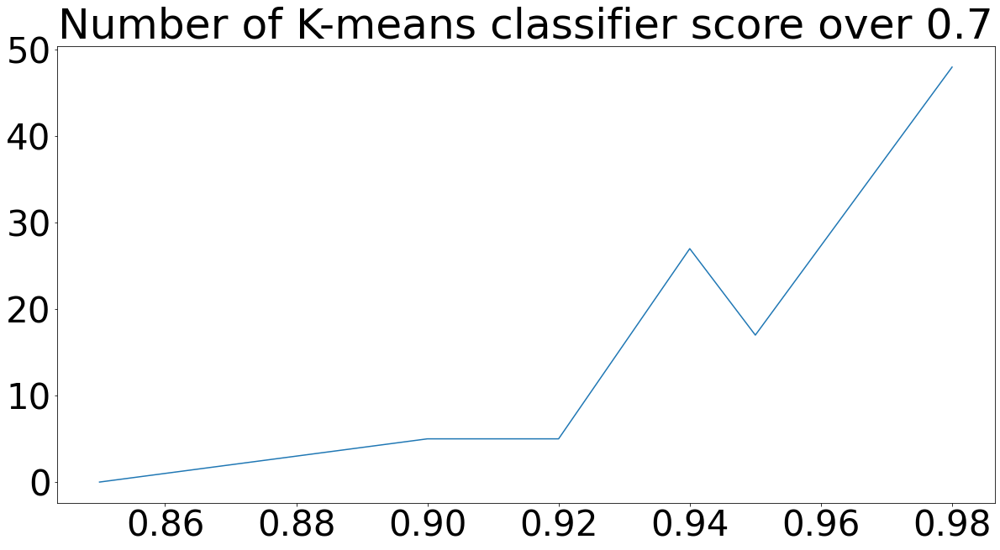

In [34]:
plt.figure(1)
plt.title("Number of Succesess wrt odour valence")
plt.plot([0.85,0.9,0.92,0.94,0.95,0.98],[3,5,5,14,45,59])

plt.figure(2)
plt.title("Number of K-means classifier score over 0.7")
plt.plot([0.85,0.9,0.92,0.94,0.95,0.98],[0,5,5,27,17,48])

CP3
1.055559502514262


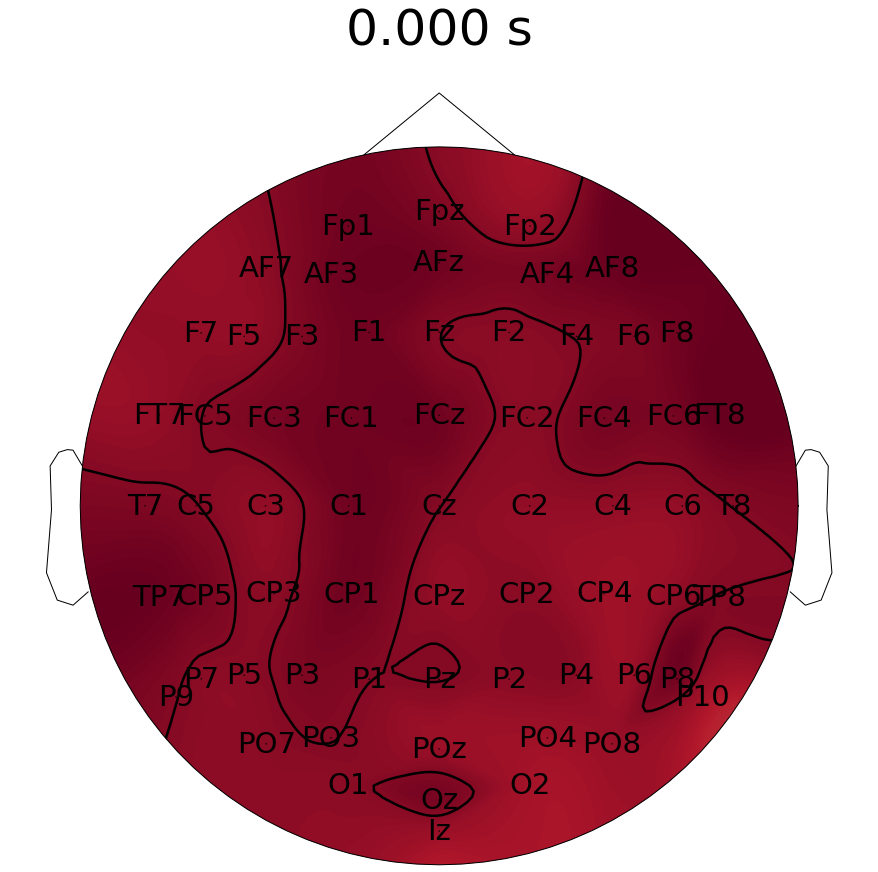

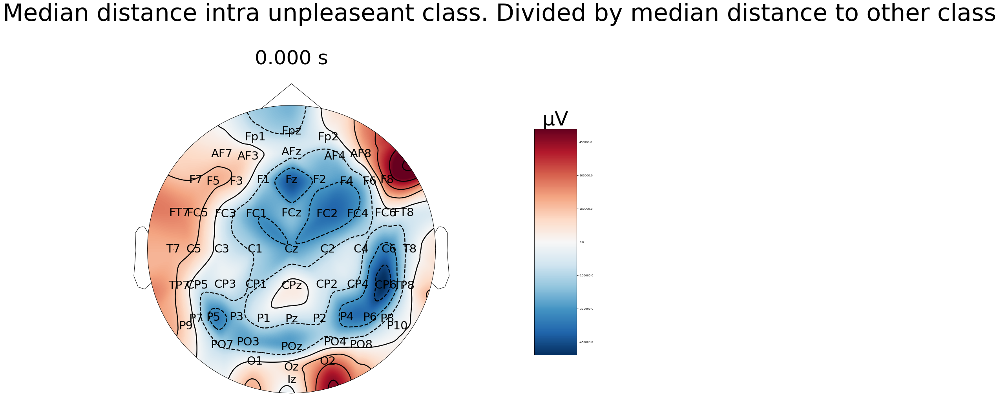

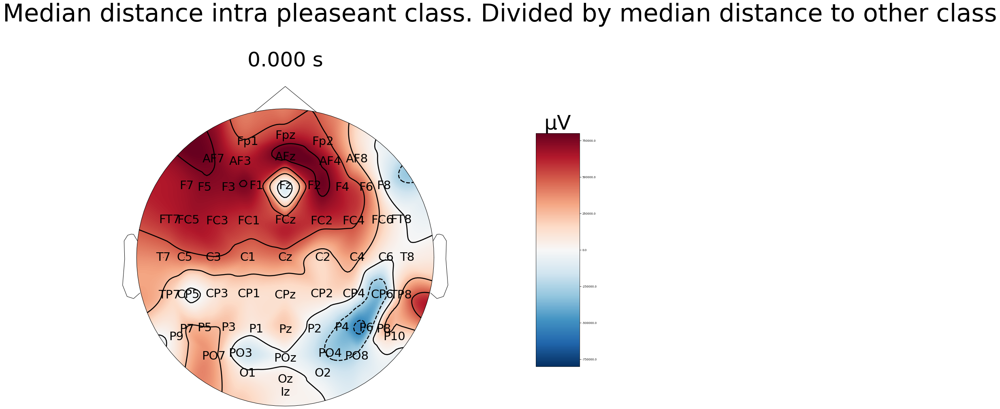

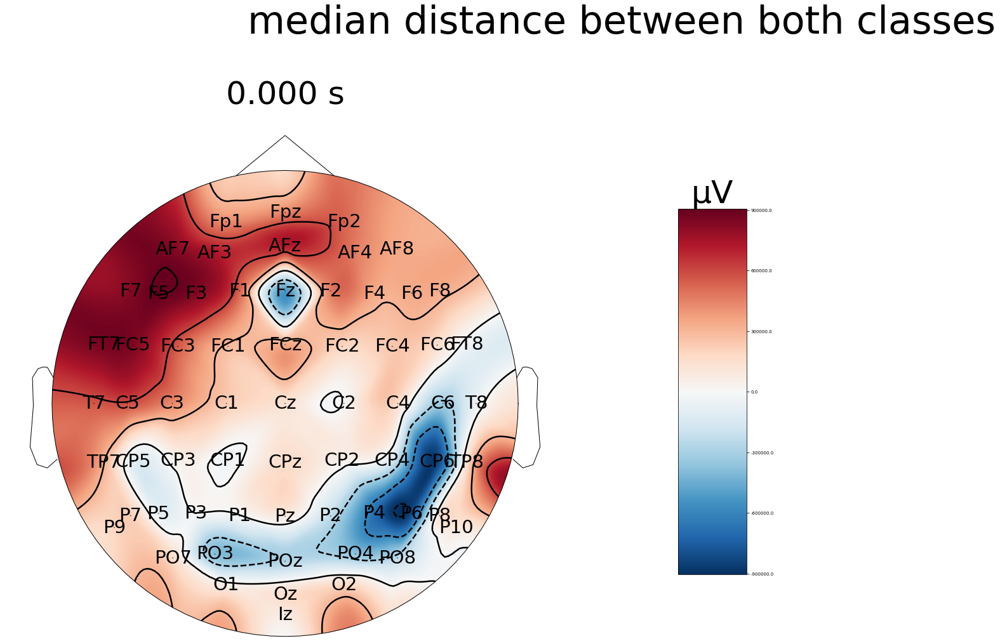

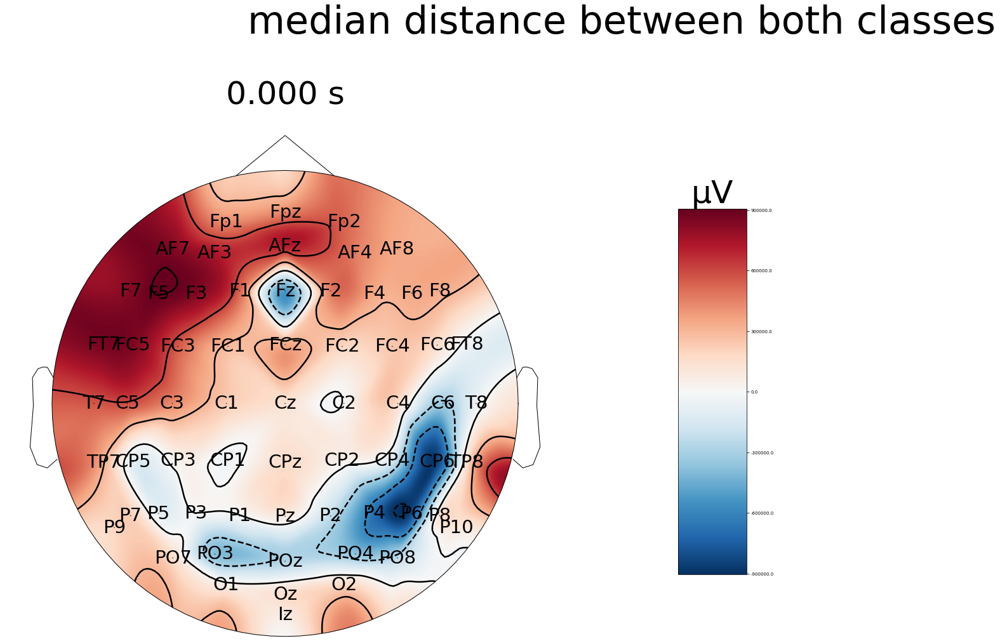

In [261]:
print(electrode_names[17])
print(arr_med_u_u[17])

k_class = k_class_scores.reshape((64,1))
evoked_array = mne.EvokedArray(k_class, info, tmin=0,
                               nave=k_class.shape[0], comment='simulated')

#mne.viz.plot_topomap(heurekas_topo,heurekas_topo.shape)

evoked_array.plot_topomap(0, ch_type='eeg', time_unit='s',colorbar=False,
                    size=10, res=128, show_names=True)


heurekas_topo = np.array(arr_med_u_u).reshape((64,1))


evoked_array = mne.EvokedArray(1-heurekas_topo, info, tmin=0,
                               nave=heurekas_topo.shape[0], comment='simulated')

#mne.viz.plot_topomap(heurekas_topo,heurekas_topo.shape)

evoked_array.plot_topomap(0, ch_type='eeg', time_unit='s',colorbar=True,
                    size=10, res=128, show_names=True,title="Median distance intra unpleaseant class. Divided by median distance to other class")


heurekas_topo = np.array(arr_med_p_p).reshape((64,1))


evoked_array = mne.EvokedArray(1-heurekas_topo, info, tmin=0,
                               nave=heurekas_topo.shape[0], comment='simulated')

#mne.viz.plot_topomap(heurekas_topo,heurekas_topo.shape)

evoked_array.plot_topomap(0, ch_type='eeg', time_unit='s',colorbar=True,
                    size=10, res=128, show_names=True,title="Median distance intra pleaseant class. Divided by median distance to other class")

arr_med = arr_med_p_p + arr_med_u_u

heurekas_topo = np.array(arr_med).reshape((64,1))


evoked_array = mne.EvokedArray(2-heurekas_topo, info, tmin=0,
                               nave=heurekas_topo.shape[0], comment='simulated')

#mne.viz.plot_topomap(heurekas_topo,heurekas_topo.shape)

evoked_array.plot_topomap(0, ch_type='eeg', time_unit='s',colorbar=True,
                    size=10, res=128, show_names=True, title="median distance between both classes")

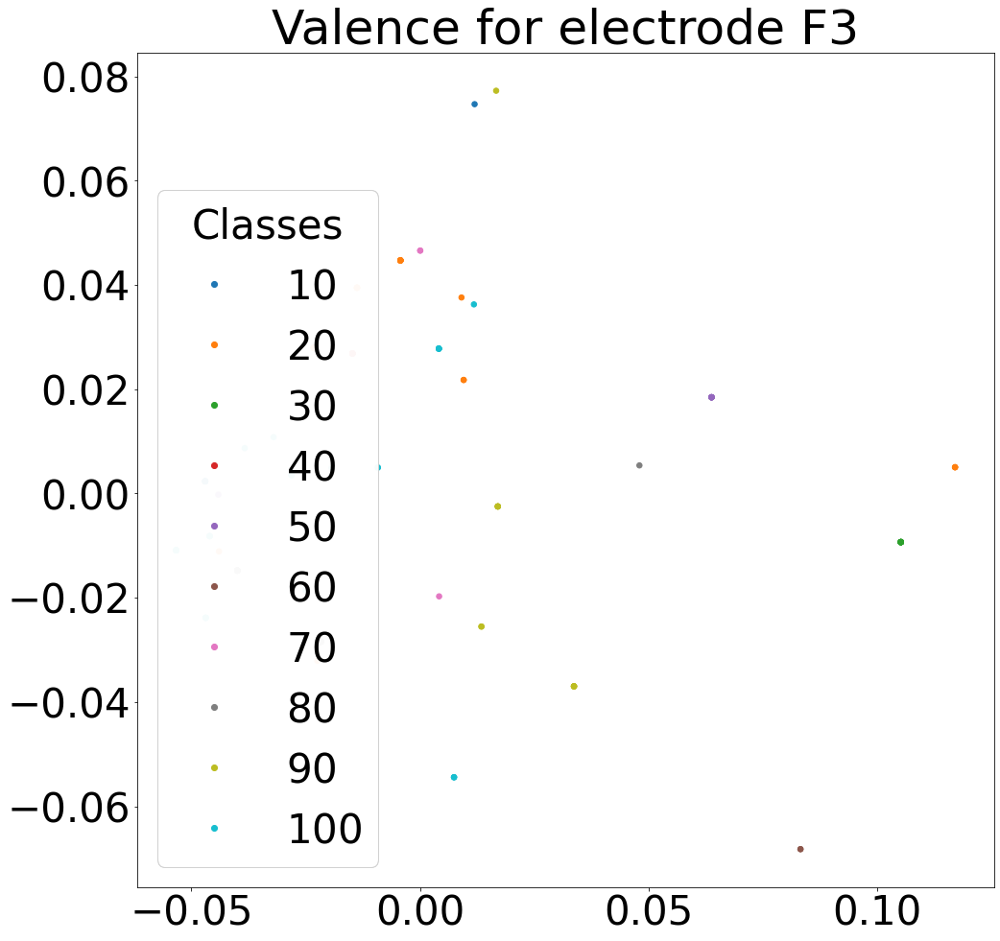

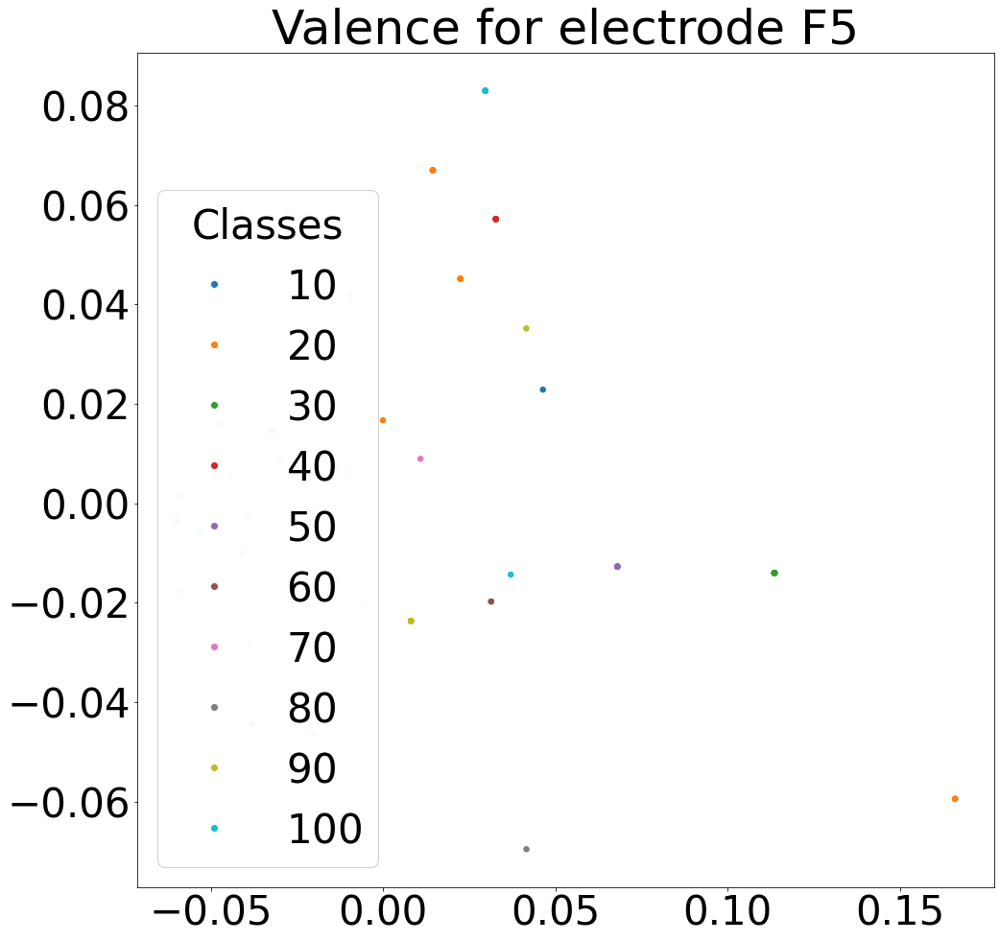

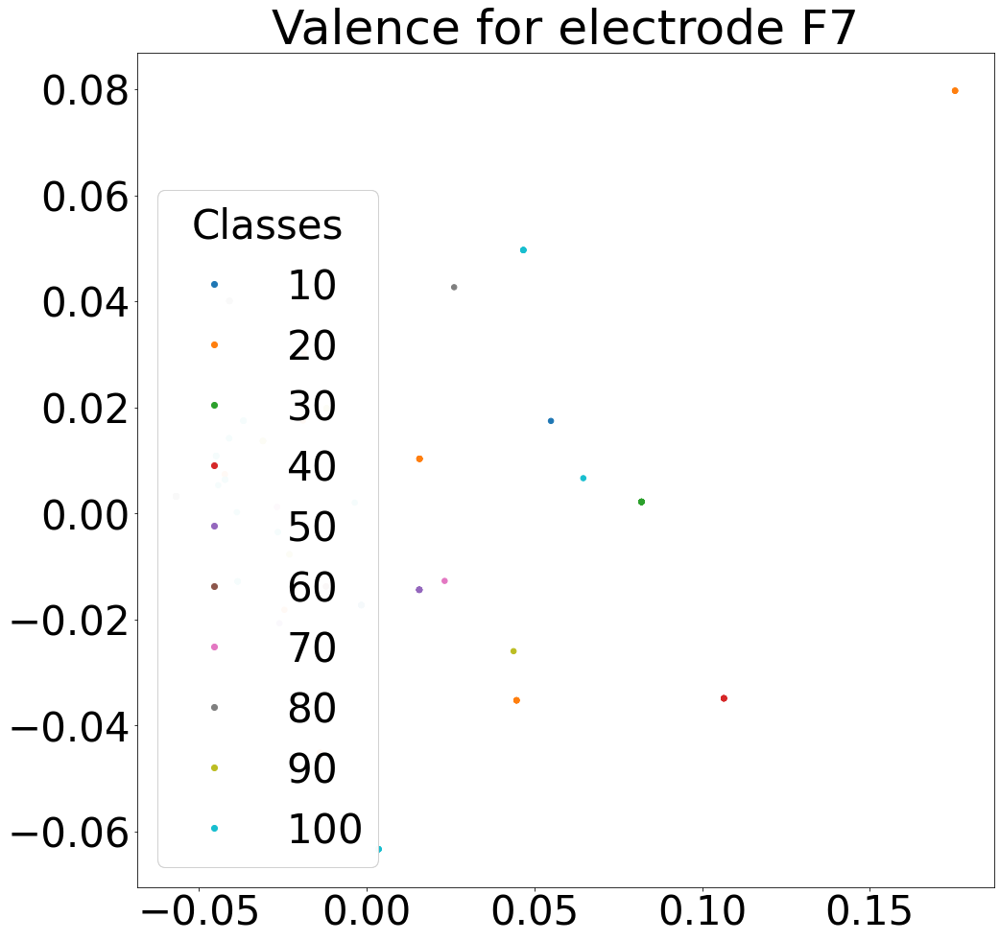

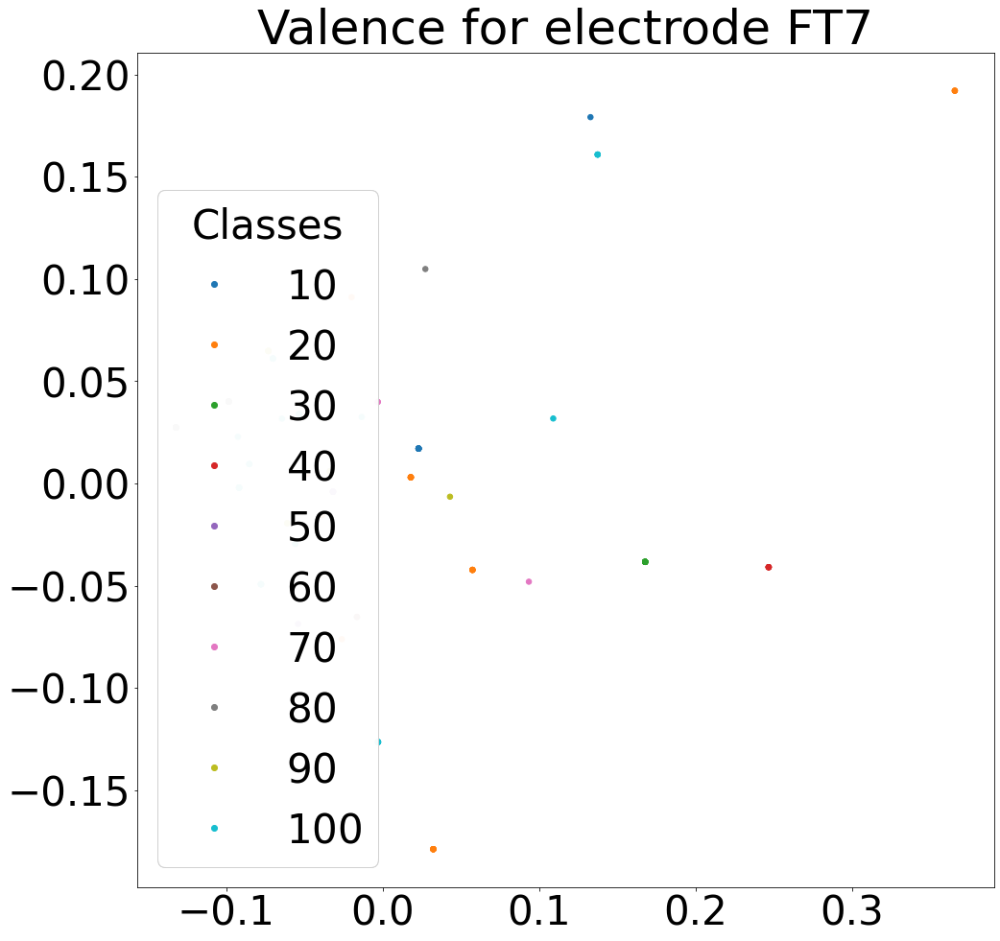

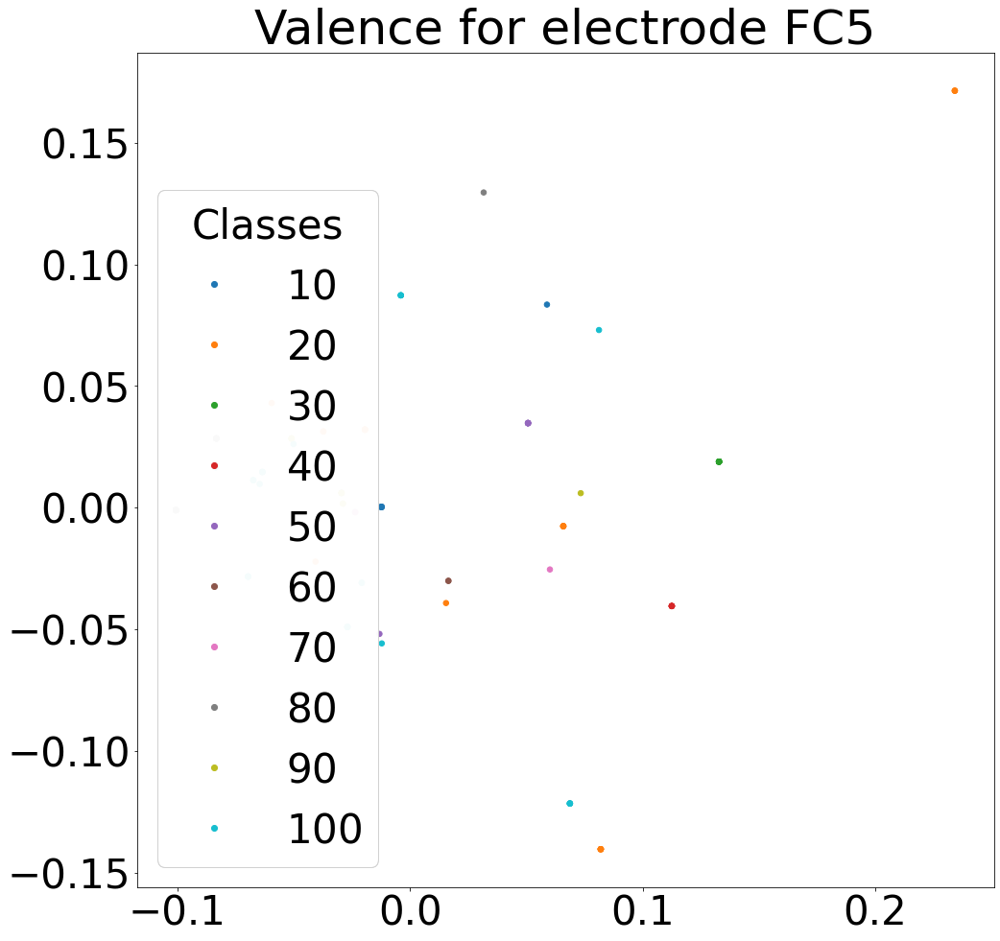

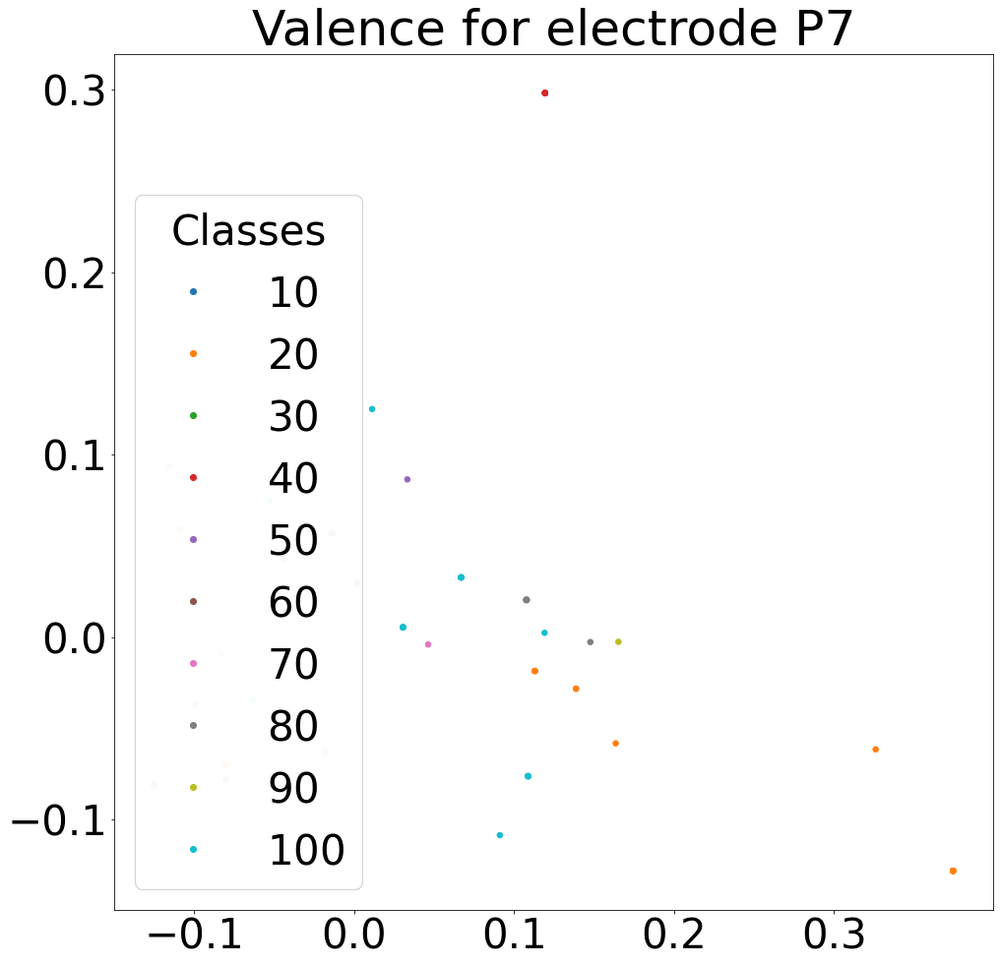

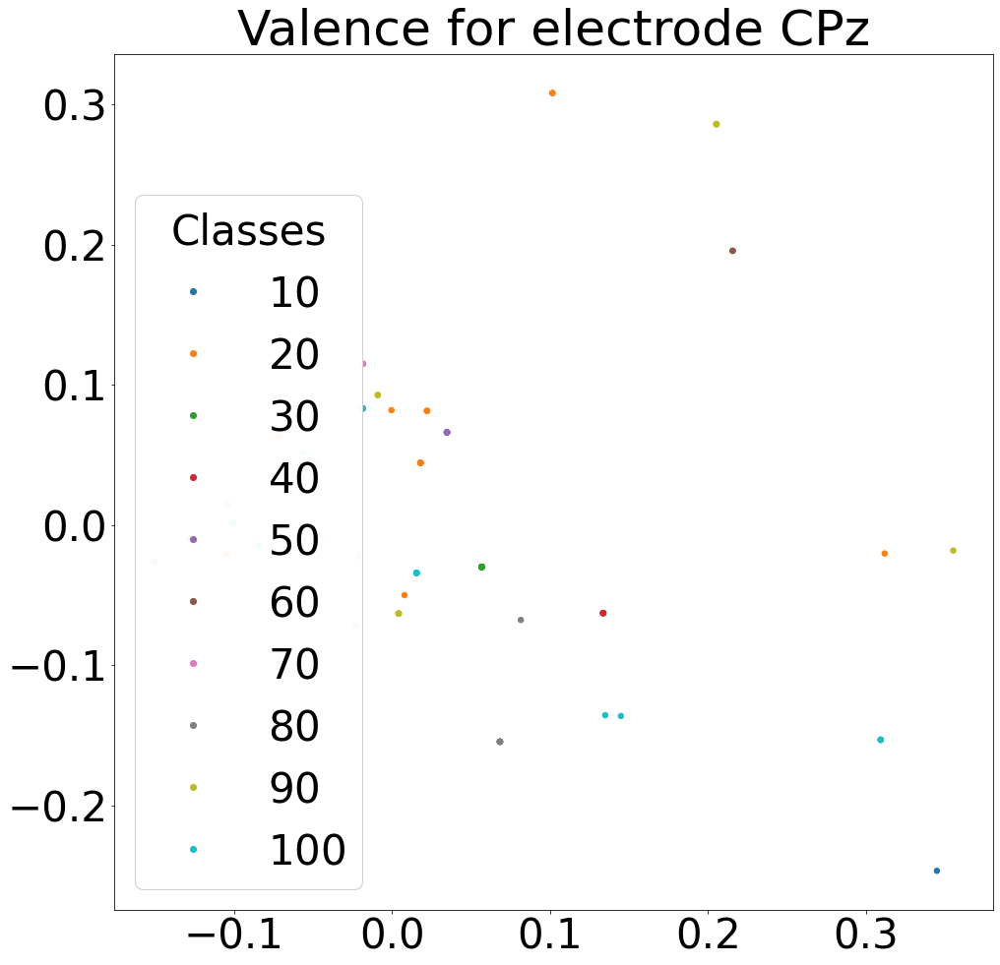

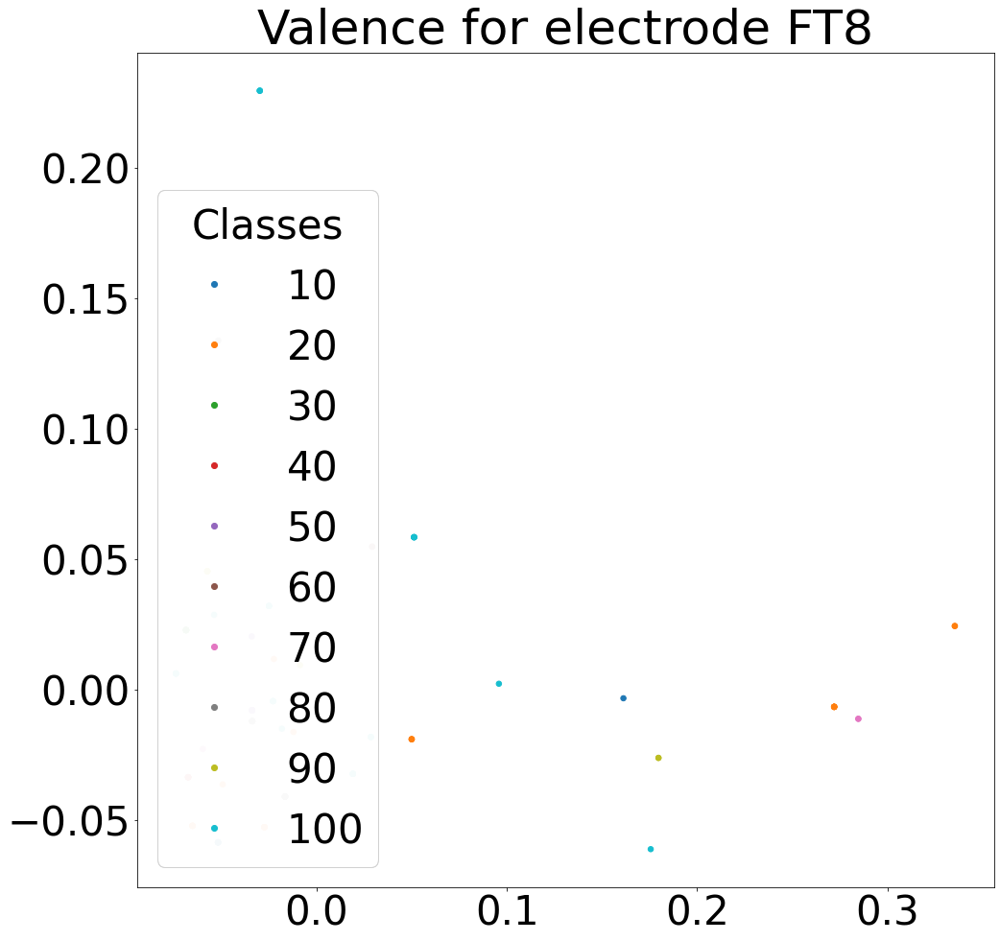

In [91]:


for i,heureka in enumerate(heurekas):
    PCA_DR = heureka
    #print(PCA_DR.shape)
    fig, ax = plt.subplots(figsize=(16, 16))
    sc = ax.scatter(
        PCA_DR[:, 0],
        PCA_DR[:, 1],
        c=train_valence.astype(int),
        cmap="tab10",
        s=30,
        alpha=1,
        rasterized=True,
    )
    plt.title("Valence for electrode " +  str(electrode_names[int(heurekas_n[i])]))
    legend1 = ax.legend(*sc.legend_elements(),
                    loc="lower left", title="Classes")
    ax.add_artist(legend1)
    #plt.xlim(-0.1,0.1)
    #plt.ylim(-0.2,0.2)

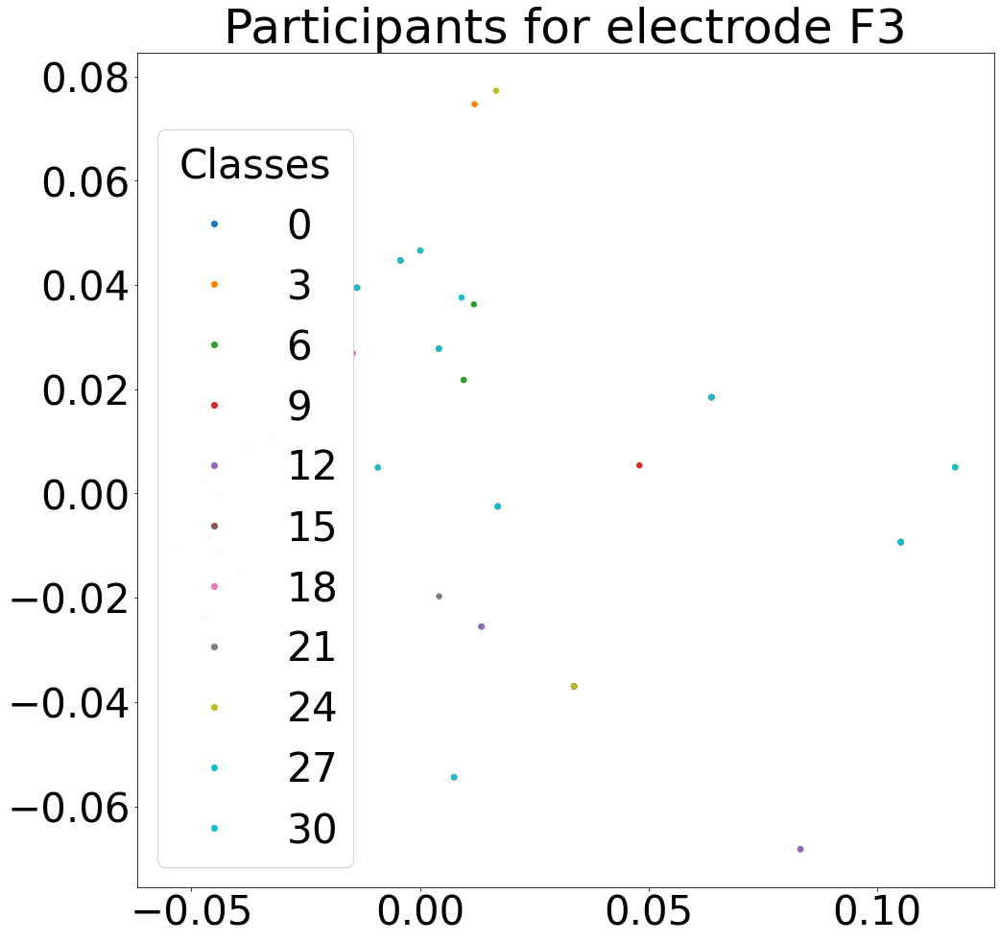

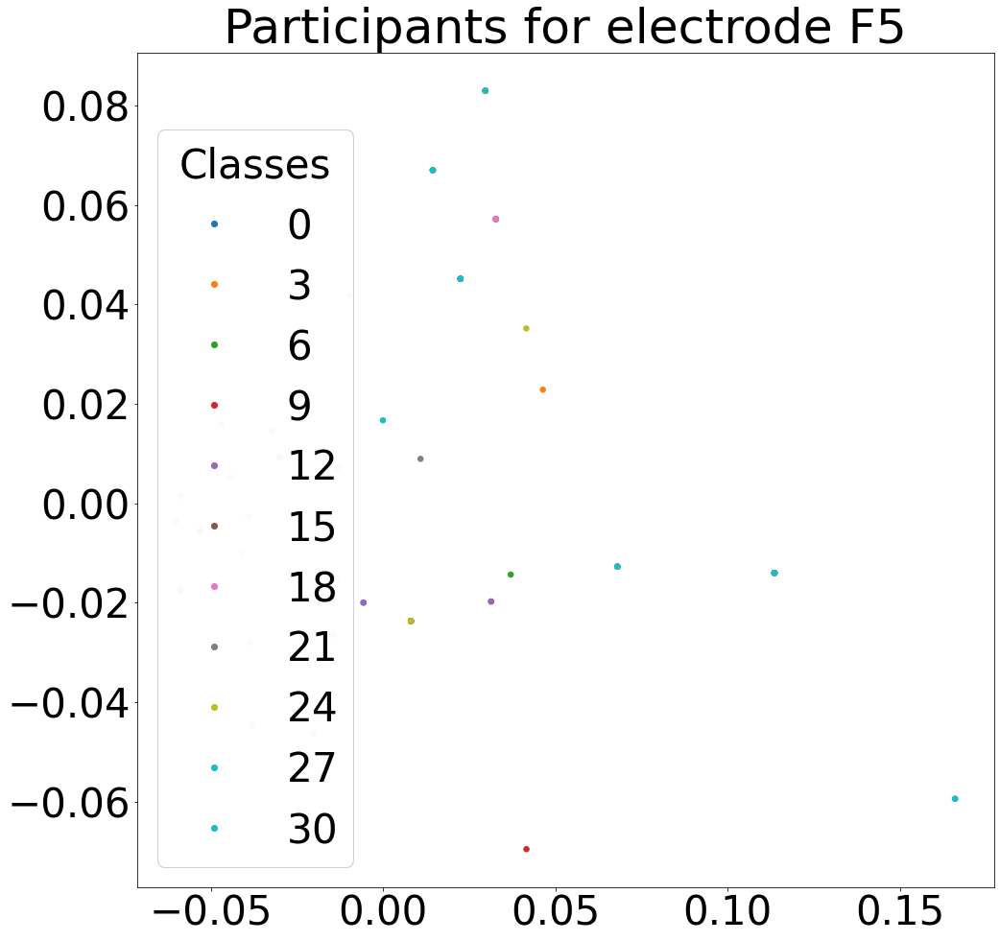

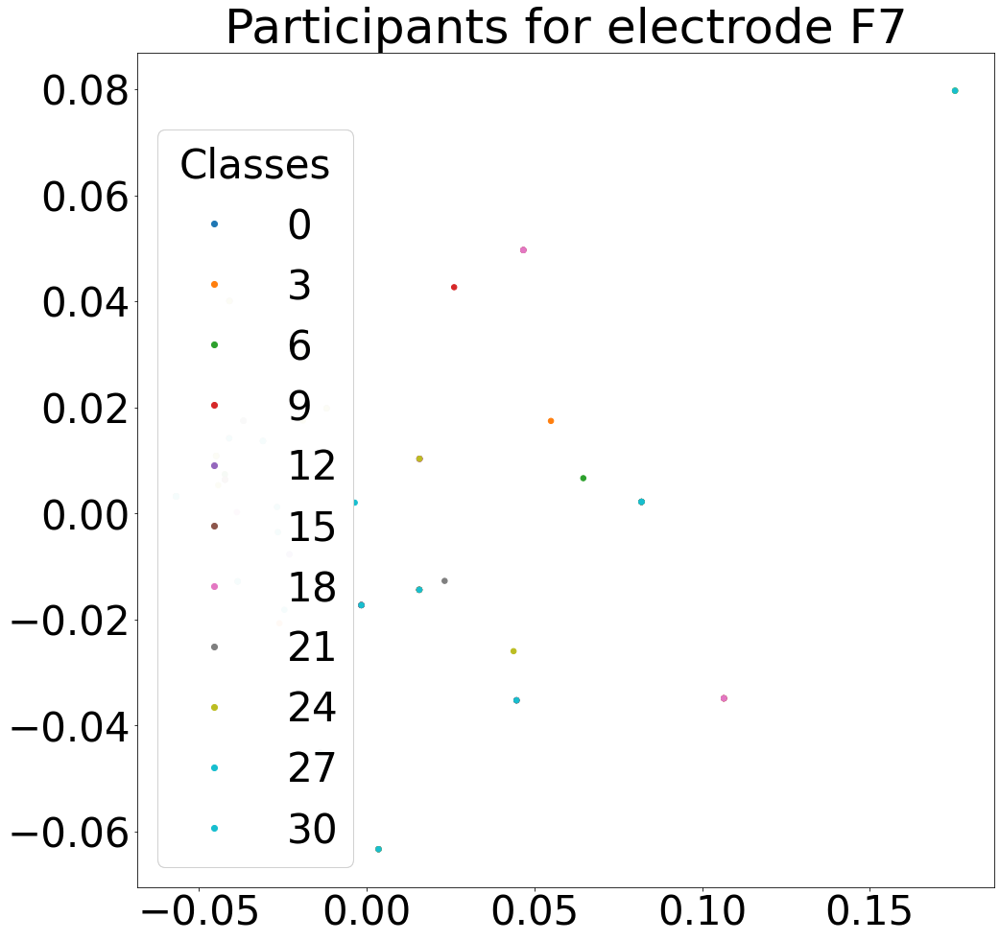

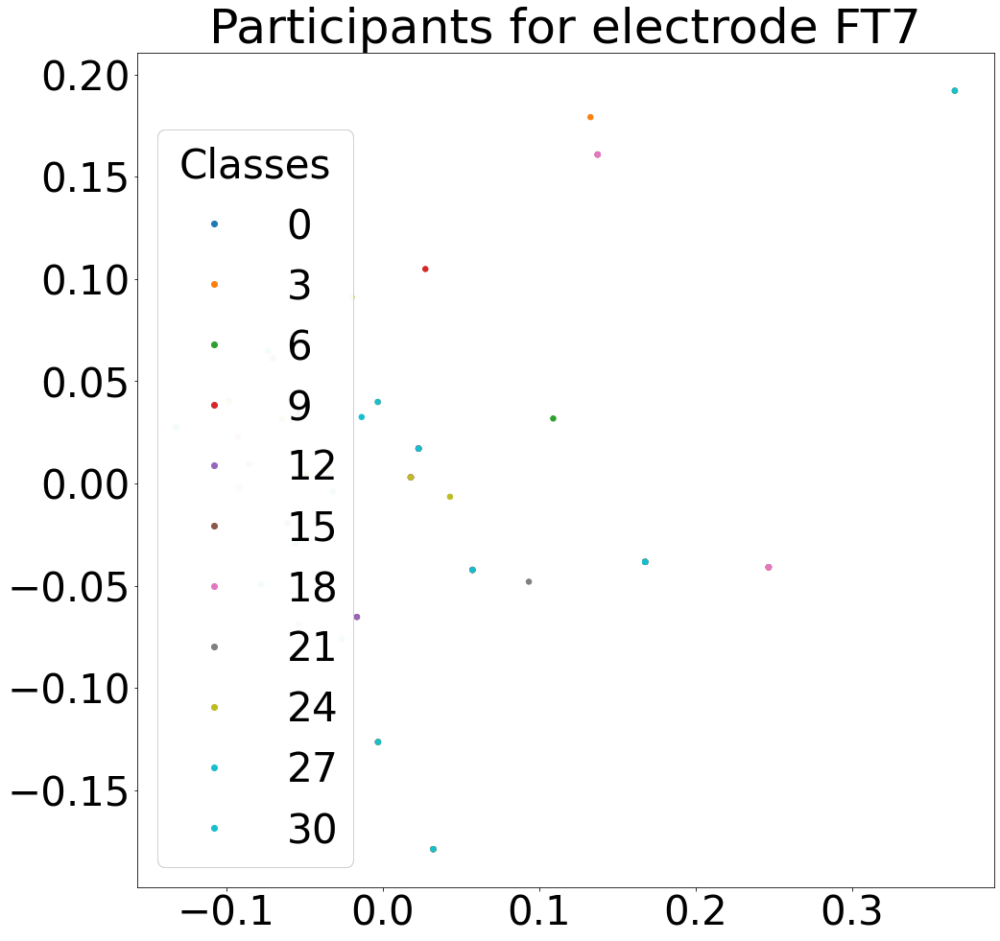

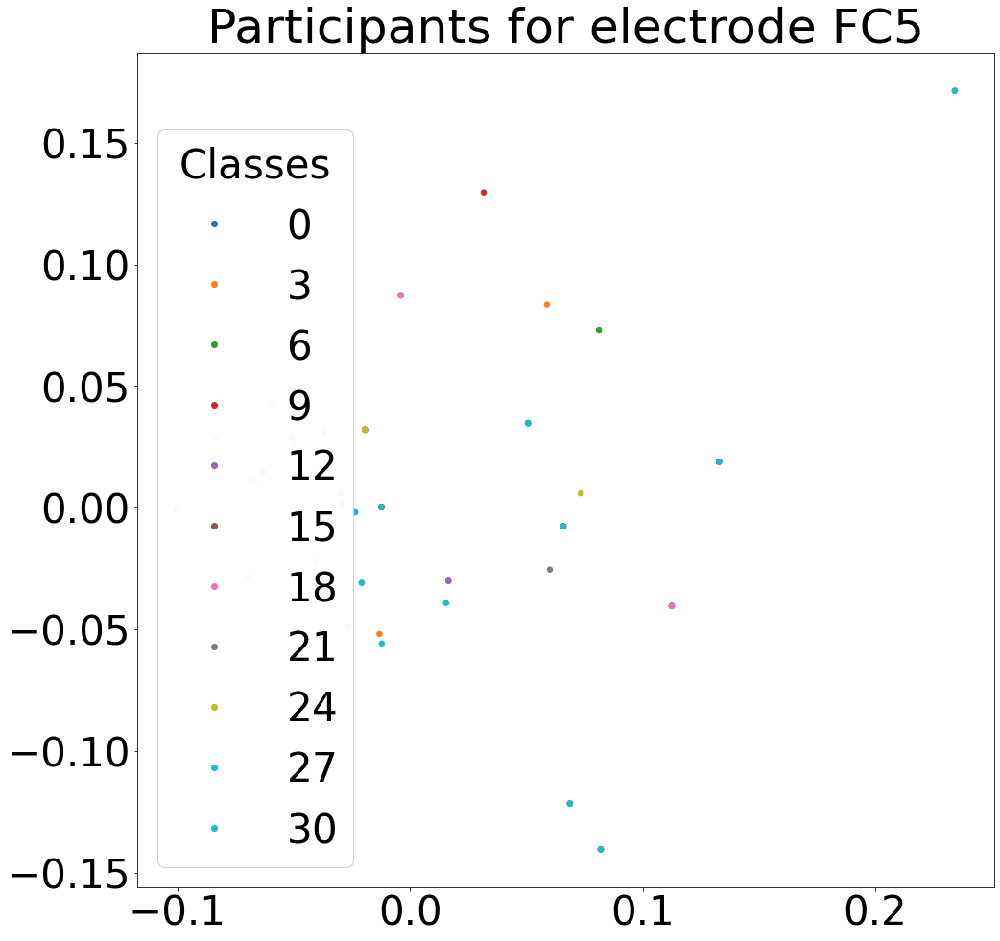

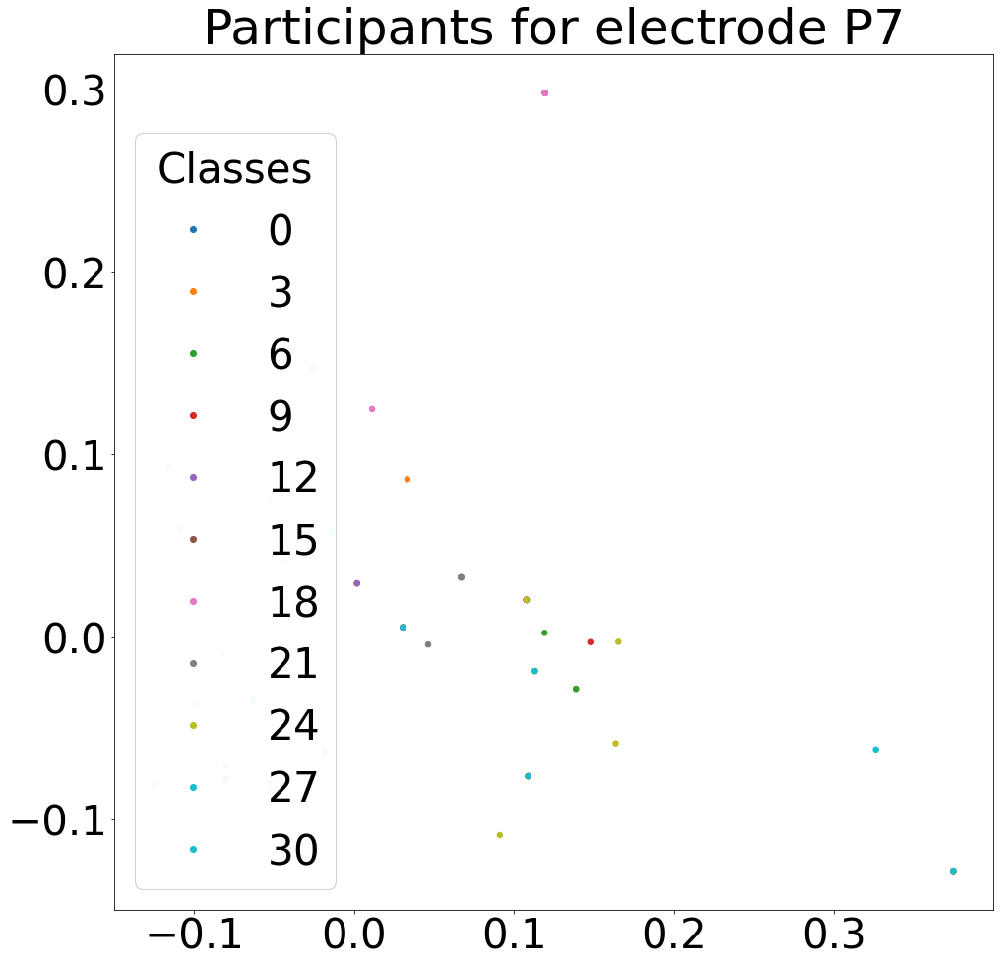

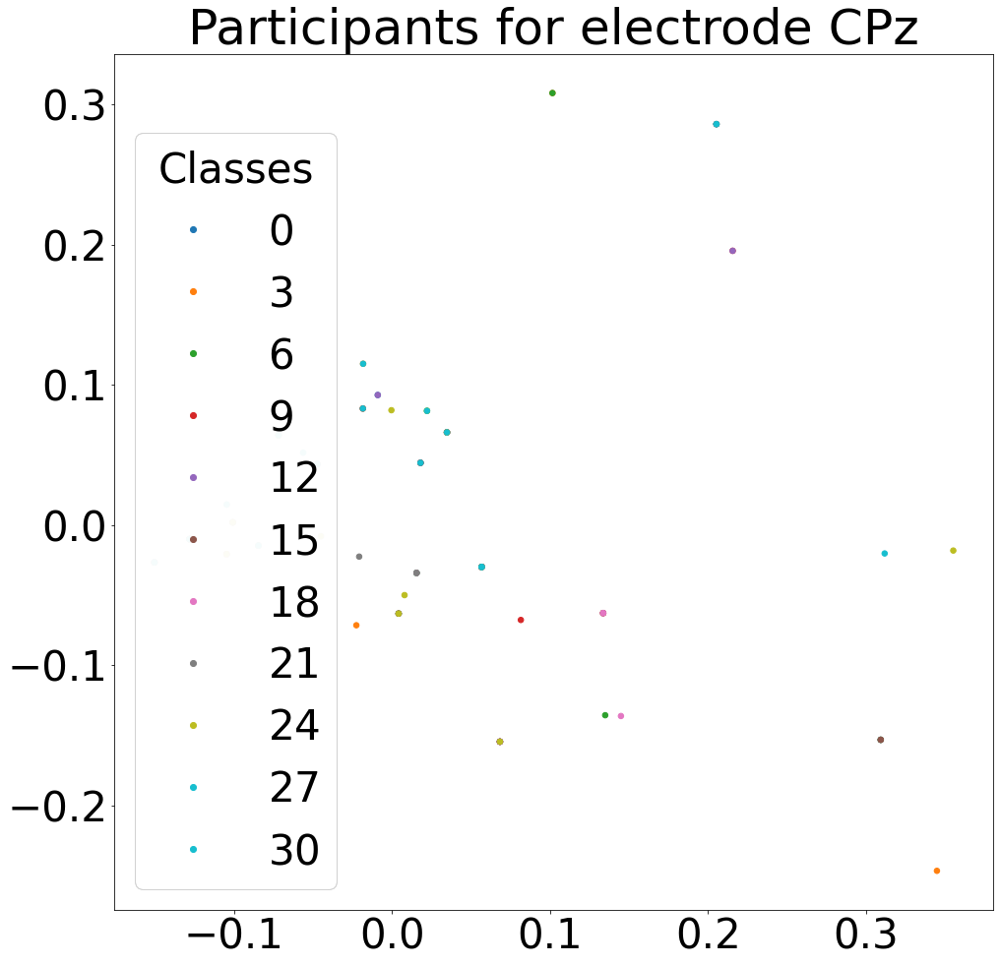

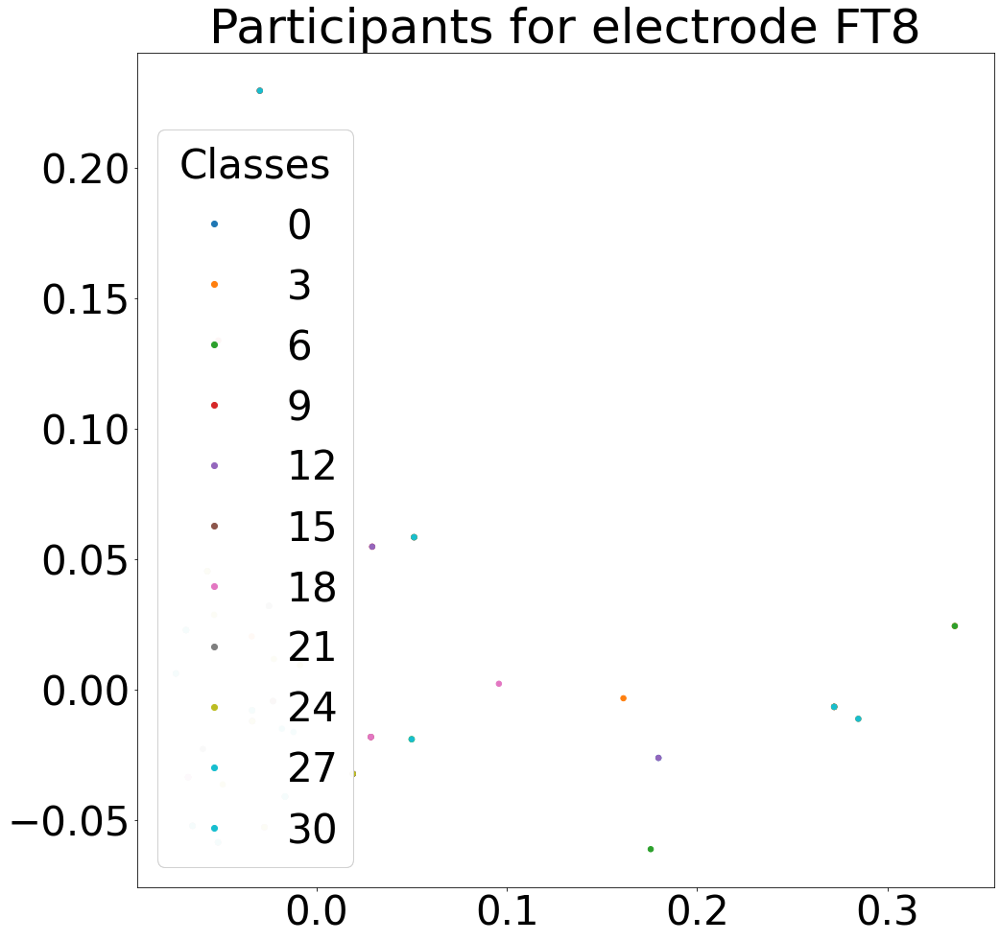

In [92]:
participant = np.ones(len(train_data))
for i in range(0,len(train_data),5):
    
    participant[i:i+5] = int((i+1)/5)
for i,heureka in enumerate(heurekas):
    PCA_DR = heureka
    #print(PCA_DR.shape)
    fig, ax = plt.subplots(figsize=(16, 16))
    sc = ax.scatter(
        PCA_DR[:, 0],
        PCA_DR[:, 1],
        c=participant.astype(int),
        cmap="tab10",
        s=30,
        alpha=1,
        rasterized=True,
    )
    plt.title("Participants for electrode " + str(electrode_names[int(heurekas_n[i])]))
    #plt.xlim(-0.1,0.1)
    #plt.ylim(-0.2,0.2)
    
    legend1 = ax.legend(*sc.legend_elements(),
                    loc="lower left", title="Classes")
    ax.add_artist(legend1)

# Alpha freq one electrode analysis

In [30]:
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.discriminant_analysis import QuadraticDiscriminantAnalysis

import matplotlib.pyplot as plt
import matplotlib as mpl
from matplotlib import colors
from scipy import linalg

cmap = colors.LinearSegmentedColormap(
    'red_blue_classes',
    {'red': [(0, 1, 1), (1, 0.7, 0.7)],
     'green': [(0, 0.7, 0.7), (1, 0.7, 0.7)],
     'blue': [(0, 0.7, 0.7), (1, 1, 1)]})
plt.cm.register_cmap(cmap=cmap)

X = PCA_DR_2
y = l_2

/opt/anaconda3/envs/behavenet/lib/python3.7/site-packages/ipykernel_launcher.py:38: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
/opt/anaconda3/envs/behavenet/lib/python3.7/site-packages/ipykernel_launcher.py:38: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.


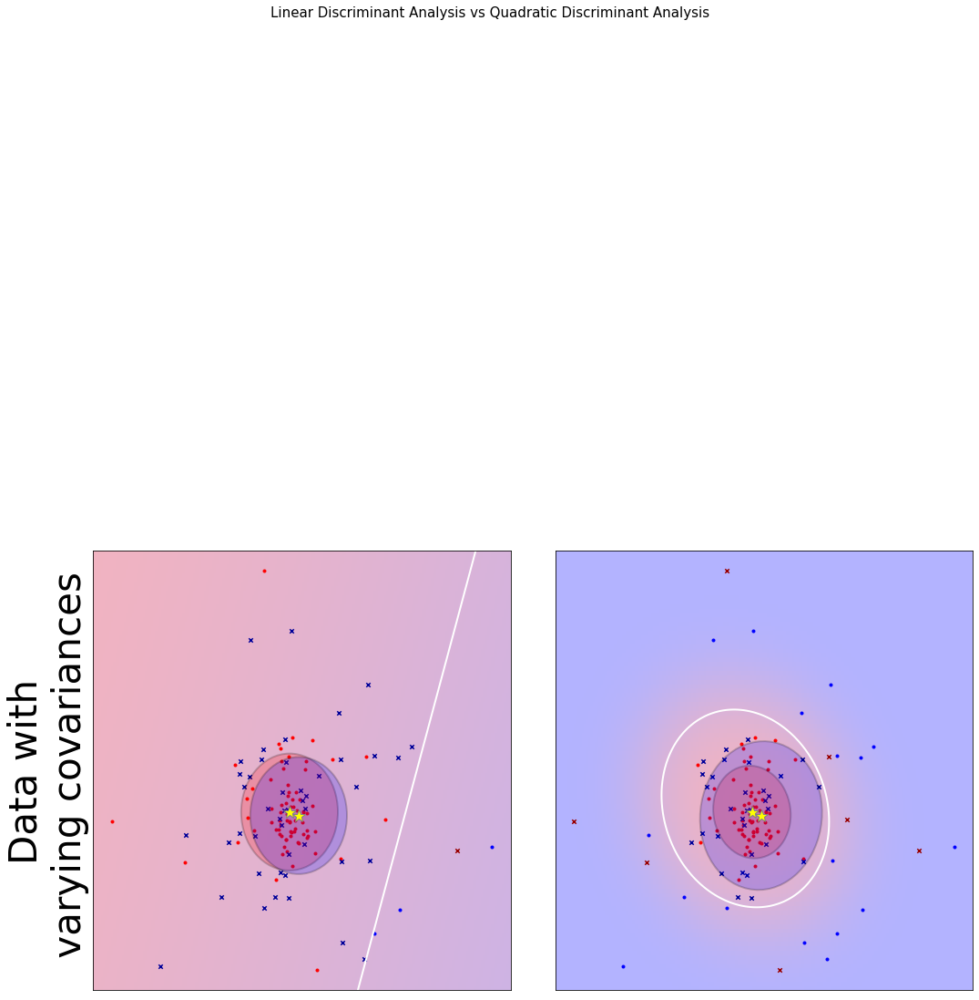

In [31]:
# #############################################################################
# Plot functions
def plot_data(lda, X, y, y_pred, fig_index):
    splot = plt.subplot(2, 2, fig_index)
    if fig_index == 1:
        plt.title('Linear Discriminant Analysis')
        plt.ylabel('Data with\n fixed covariance')
    elif fig_index == 2:
        plt.title('Quadratic Discriminant Analysis')
    elif fig_index == 3:
        plt.ylabel('Data with\n varying covariances')

    tp = (y == y_pred)  # True Positive
    tp0, tp1 = tp[y == 0], tp[y == 1]
    X0, X1 = X[y == 0], X[y == 1]
    X0_tp, X0_fp = X0[tp0], X0[~tp0]
    X1_tp, X1_fp = X1[tp1], X1[~tp1]

    # class 0: dots
    plt.scatter(X0_tp[:, 0], X0_tp[:, 1], marker='.', color='red')
    plt.scatter(X0_fp[:, 0], X0_fp[:, 1], marker='x',
                s=20, color='#990000')  # dark red

    # class 1: dots
    plt.scatter(X1_tp[:, 0], X1_tp[:, 1], marker='.', color='blue')
    plt.scatter(X1_fp[:, 0], X1_fp[:, 1], marker='x',
                s=20, color='#000099')  # dark blue

    # class 0 and 1 : areas
    nx, ny = 200, 100
    x_min, x_max = plt.xlim()
    y_min, y_max = plt.ylim()
    xx, yy = np.meshgrid(np.linspace(x_min, x_max, nx),
                         np.linspace(y_min, y_max, ny))
    Z = lda.predict_proba(np.c_[xx.ravel(), yy.ravel()])
    Z = Z[:, 1].reshape(xx.shape)
    plt.pcolormesh(xx, yy, Z, cmap='red_blue_classes',
                   norm=colors.Normalize(0., 1.), zorder=0)
    plt.contour(xx, yy, Z, [0.5], linewidths=2., colors='white')

    # means
    plt.plot(lda.means_[0][0], lda.means_[0][1],
             '*', color='yellow', markersize=15, markeredgecolor='grey')
    plt.plot(lda.means_[1][0], lda.means_[1][1],
             '*', color='yellow', markersize=15, markeredgecolor='grey')

    return splot

def plot_ellipse(splot, mean, cov, color):
    v, w = linalg.eigh(cov)
    u = w[0] / linalg.norm(w[0])
    angle = np.arctan(u[1] / u[0])
    angle = 180 * angle / np.pi  # convert to degrees
    # filled Gaussian at 2 standard deviation
    ell = mpl.patches.Ellipse(mean, 2 * v[0] ** 0.5, 2 * v[1] ** 0.5,
                              180 + angle, facecolor=color,
                              edgecolor='black', linewidth=2)
    ell.set_clip_box(splot.bbox)
    ell.set_alpha(0.2)
    splot.add_artist(ell)
    splot.set_xticks(())
    splot.set_yticks(())

def plot_lda_cov(lda, splot):
    plot_ellipse(splot, lda.means_[0], lda.covariance_, 'red')
    plot_ellipse(splot, lda.means_[1], lda.covariance_, 'blue')

def plot_qda_cov(qda, splot):
    plot_ellipse(splot, qda.means_[0], qda.covariance_[0], 'red')
    plot_ellipse(splot, qda.means_[1], qda.covariance_[1], 'blue')
    
plt.figure(figsize=(16, 16), facecolor='white')
plt.suptitle('Linear Discriminant Analysis vs Quadratic Discriminant Analysis',
             y=0.98, fontsize=15)
# Linear Discriminant Analysis
lda = LinearDiscriminantAnalysis(solver="svd", store_covariance=True)
y_pred = lda.fit(X, y).predict(X)
splot = plot_data(lda, X, y, y_pred, fig_index=2 +1)
plot_lda_cov(lda, splot)
plt.axis('tight')

# Quadratic Discriminant Analysis
qda = QuadraticDiscriminantAnalysis(store_covariance=True)
y_pred = qda.fit(X, y).predict(X)
splot = plot_data(qda, X, y, y_pred, fig_index=2 + 2)
plot_qda_cov(qda, splot)
plt.axis('tight')
plt.tight_layout()
plt.subplots_adjust(top=0.92)
plt.show()

# Classify with test samples from training set

In [192]:
print(heurekas.shape)
print(heurekas_test.shape)
#print(heurekas_test)
test_labels_heu = test_labels
heu_test = heurekas_test
for i in range(heurekas.shape[0]):
    print("NEW")
    print(np.max(heurekas[i]))
    print(np.max(heu_test[i]))
    
    
    if np.max(heurekas[i]) < np.max(heu_test[i]):
        ind = np.argmax(heu_test[i],axis=0)
        print(ind)
        print(heu_test[i,ind[0],:])
        print(heu_test[i,ind[1],:])
        #heu_test = np.delete(heu_test,ind[1],axis=1)
        #print(heu_test[i,ind[0],:])
        #print(heu_test[i,ind[1],:])
        #test_labels_heu = np.delete(test_labels_heu,ind[1])

(8, 152, 2)
(8, 76, 2)
NEW
0.11710203480481725
0.19217520496306628
[ 9 44]
[ 0.16431183 -0.00062392]
[-0.04011088  0.1921752 ]
NEW
0.16605004611548155
0.16424288064757545
NEW
0.17544841503529454
0.13688478202941112
NEW
0.3655568397648181
0.15295984631212795
NEW
0.23418866586804263
0.1617106720910645
NEW
0.37437528366382544
0.27915621135038665
NEW
0.35536715622599263
0.7307364260567272
[ 7 29]
[0.52901923 0.02228045]
[-0.23079952  0.73073643]
NEW
0.33543881755084975
0.3968441626089287
[ 1 21]
[0.22716134 0.04248977]
[0.18157687 0.39684416]


In [181]:
heu_test = heurekas_test

#print(heu_test[6,7,])
#print(heu_test[6,29,:])
#print(np.max(heurekas))
print(np.max(heu_test))
#print(np.argmax(heu_test_2[6],axis=0))
#print(np.argmax(heu_test[6],axis=0))

heu_test_2 = np.delete(heu_test,i,axis=1)
#print(heu_test_2)
#print(heu_test_2[6,7,])
#print(heu_test_2[6,29,:])
print(np.max(heu_test_2))
#print(np.argmax(heu_test_2[6],axis=0))

0.7307364260567272
0.7307364260567272


In [210]:
print(np.where(heurekas_test>0.35536715622599263))
print(np.where(heurekas_test>0.33543881755084975))
print(np.where(heurekas_test>0.11710203480481725))
heu_test_lab = test_labels

ind = np.where(heurekas_test>0.35536715622599263)[1]
print("ind",ind)
heu_test_2 = np.delete(heurekas_test,ind,axis=1)
heu_test_lab = np.delete(heu_test_lab,ind)

ind = np.where(heu_test_2>0.33543881755084975)[1]
print("ind",ind)
heu_test_2 = np.delete(heu_test_2,ind,axis=1)
heu_test_lab = np.delete(heu_test_lab,ind)


ind = np.where(heu_test_2==0.19217520496306628)[1]
print("ind",ind)
heu_test_2 = np.delete(heu_test_2,ind,axis=1)
heu_test_lab = np.delete(heu_test_lab,ind)

ind = np.where(heu_test_2==0.19217520496306625)[1]
print("ind",ind)
heu_test_2 = np.delete(heu_test_2,ind,axis=1)
heu_test_lab = np.delete(heu_test_lab,ind)

164311827477787
ind = np.where(heu_test_2==0.164311827477787)[1]
print("ind",ind)
heu_test_2 = np.delete(heu_test_2,ind,axis=1)
heu_test_lab = np.delete(heu_test_lab,ind)

print(np.where(heu_test_2==0.7307364260567272))
print(np.where(heu_test_2==0.3968441626089287))
print(np.where(heu_test_2==0.19217520496306628))


(array([6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6,
       6, 6, 6, 7, 7]), array([ 1,  3,  7, 11, 15, 19, 23, 27, 29, 31, 35, 36, 39, 40, 43, 47, 51,
       55, 59, 63, 64, 67, 68, 71, 75, 21, 49]), array([1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0,
       0, 0, 0, 1, 1]))
(array([6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6,
       6, 6, 6, 7, 7]), array([ 1,  3,  7, 11, 15, 19, 23, 27, 29, 31, 35, 36, 39, 40, 43, 47, 51,
       55, 59, 63, 64, 67, 68, 71, 75, 21, 49]), array([1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0,
       0, 0, 0, 1, 1]))
(array([0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2,
       3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3,
       3, 3, 3, 3, 3, 3, 3, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 5, 5, 5, 5, 5,
       5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5,
       5, 5, 5, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6,

In [211]:
print(heurekas.shape)
print(heurekas_test.shape)
#print(heurekas_test)
test_labels_heu = test_labels
heu_test = heurekas_test
for i in range(heurekas.shape[0]):
    print("NEW")
    print(np.max(heurekas[i]))
    print(np.max(heu_test_2[i]))
    
    
    if np.max(heurekas[i]) < np.max(heu_test_2[i]):
        ind = np.argmax(heu_test_2[i],axis=0)
        print(ind)
        print(heu_test_2[i,ind[0],:])
        print(heu_test_2[i,ind[1],:])
        #heu_test = np.delete(heu_test,ind[1],axis=1)
        #print(heu_test[i,ind[0],:])
        #print(heu_test[i,ind[1],:])
        #test_labels_heu = np.delete(test_labels_heu,ind[1])

(8, 152, 2)
(8, 76, 2)
NEW
0.11710203480481725
0.1040337552640153
NEW
0.16605004611548155
0.10470004903838614
NEW
0.17544841503529454
0.13688478202941112
NEW
0.3655568397648181
0.15295984631212795
NEW
0.23418866586804263
0.1617106720910645
NEW
0.37437528366382544
0.04237857771140404
NEW
0.35536715622599263
0.027606339858402554
NEW
0.33543881755084975
0.12395236967639559


In [ ]:
print(np.where(heurekas_test==0.7307364260567272))
print(np.where(heurekas_test==0.3968441626089287))
print(np.where(heurekas_test==0.19217520496306628))
heu_test_lab = test_labels

ind = np.where(heurekas_test==0.7307364260567272)[1]
heu_test_2 = np.delete(heurekas_test,ind,axis=1)
heu_test_lab = np.delete(heu_test_lab,ind)

ind = np.where(heu_test_2==0.3968441626089287)[1]
heu_test_2 = np.delete(heu_test_2,ind,axis=1)
heu_test_lab = np.delete(heu_test_lab,ind)


ind = np.where(heu_test_2==0.19217520496306628)[1]
heu_test_lab = np.delete(heu_test_lab,ind)

heu_test_2 = np.delete(heu_test_2,ind,axis=1)
print(np.where(heu_test_2==0.7307364260567272))
print(np.where(heu_test_2==0.3968441626089287))
print(np.where(heu_test_2==0.19217520496306628))



Classifier comparison

A comparison of a several classifiers in scikit-learn on synthetic datasets.
The point of this example is to illustrate the nature of decision boundaries
of different classifiers.
This should be taken with a grain of salt, as the intuition conveyed by
these examples does not necessarily carry over to real datasets.

Particularly in high-dimensional spaces, data can more easily be separated
linearly and the simplicity of classifiers such as naive Bayes and linear SVMs
might lead to better generalization than is achieved by other classifiers.

The plots show training points in solid colors and testing points
semi-transparent. The lower right shows the classification accuracy on the test
set.

4: F3
index:  0
Nearest Neighbors: 0.87 accuracy with a standard deviation of 0.11
----------------------------------------NEW HIGH SCORE 0.87
Linear SVM: 0.78 accuracy with a standard deviation of 0.04
RBF SVM: 0.88 accuracy with a standard deviation of 0.09
----------------

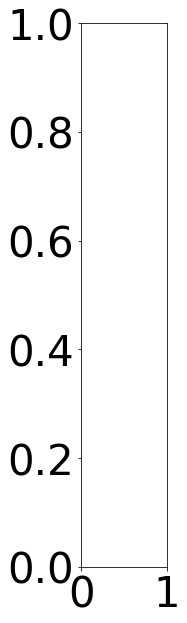

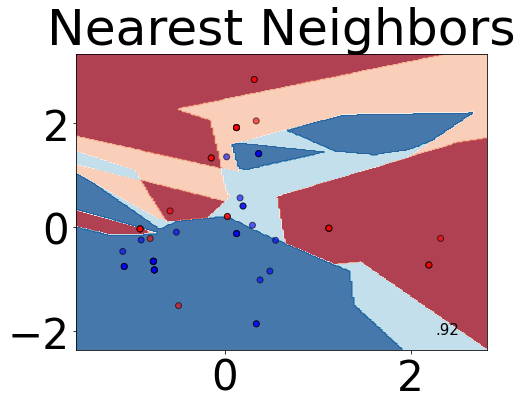

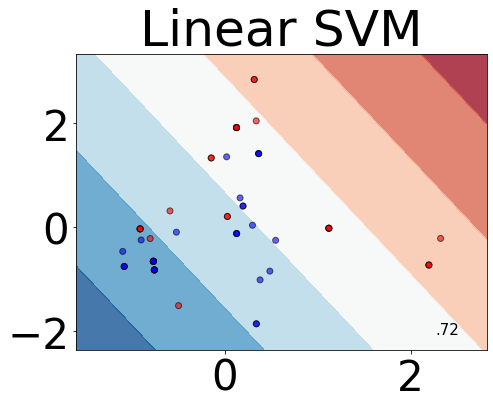

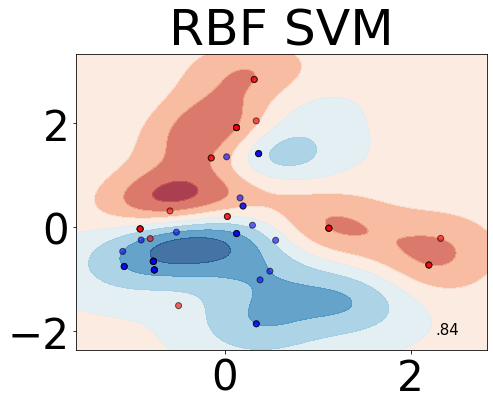

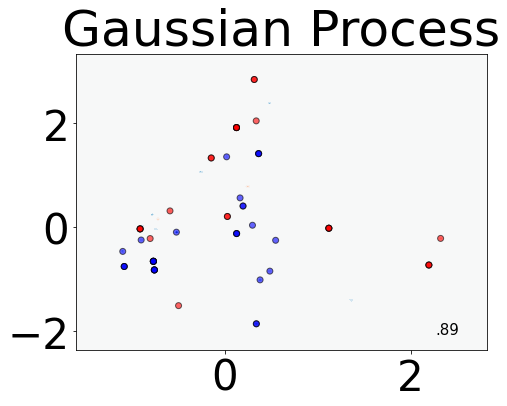

...

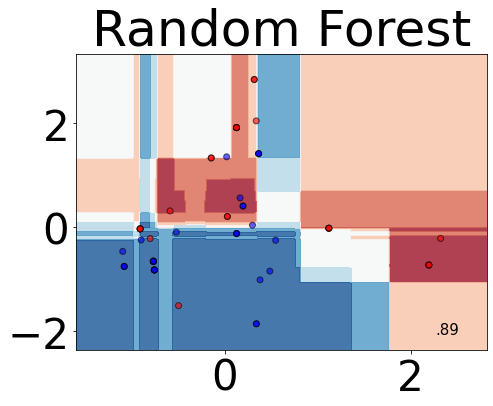

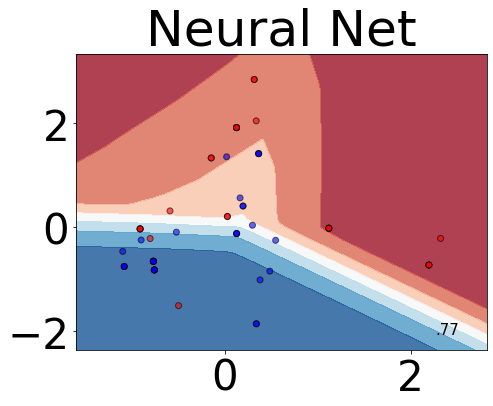

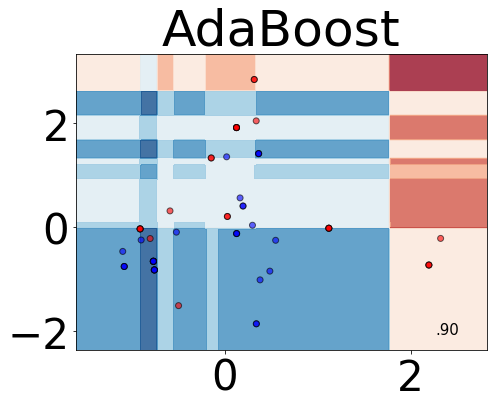

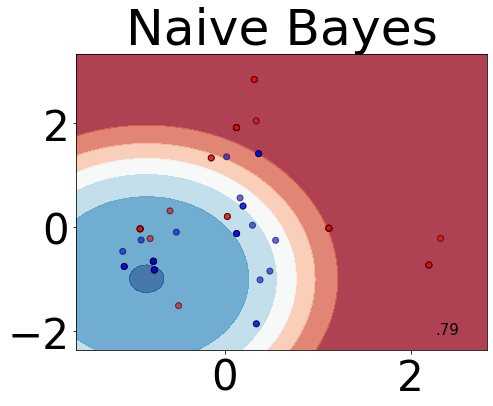

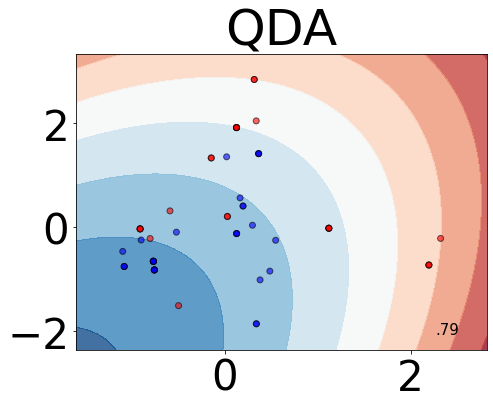

5: F5
index:  1
Nearest Neighbors: 0.91 accuracy with a standard deviation of 0.06
Linear SVM: 0.79 accuracy with a standard deviation of 0.07
RBF SVM: 0.84 accuracy with a standard deviation of 0.08
Gaussian Process: 0.90 accuracy with a standard deviation of 0.07
Decision Tree: 0.91 accuracy with a standard deviation of 0.06
Random Forest: 0.92 accuracy with a standard deviation of 0.06
Neural Net: 0.80 accuracy with a standard deviation of 0.07
AdaBoost: 0.92 accuracy with a standard deviation of 0.06
Naive Bayes: 0.79 accuracy with a standard deviation of 0.07
QDA: 0.80 accuracy with a standard deviation of 0.07


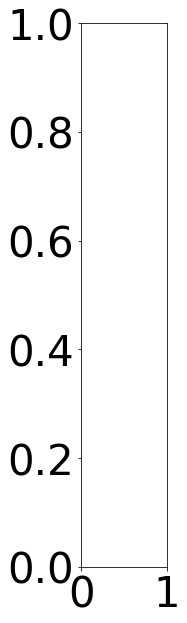

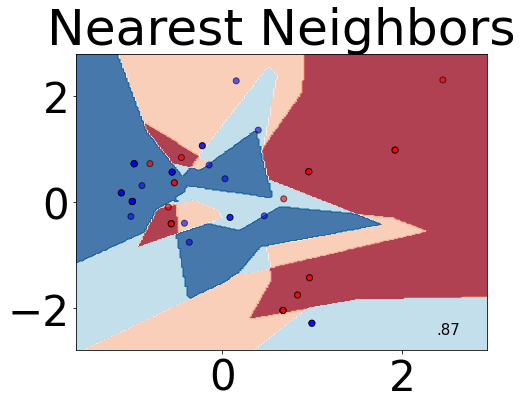

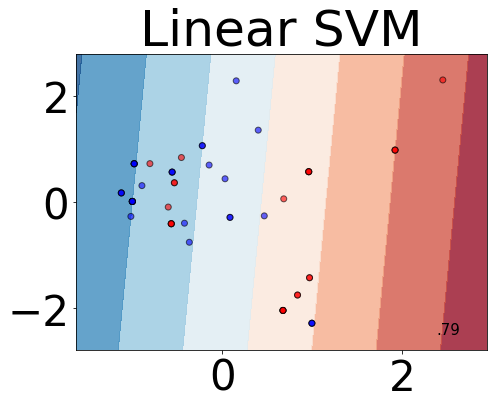

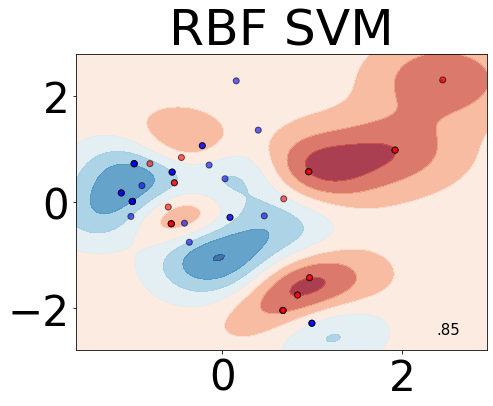

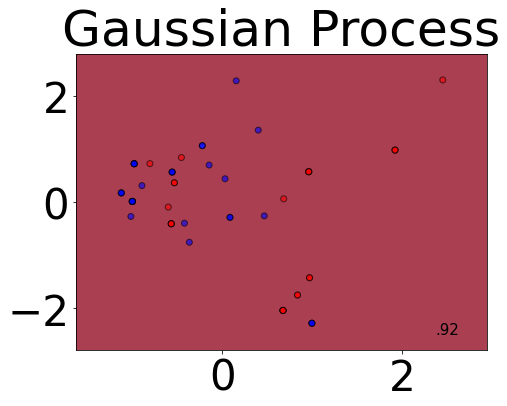

...

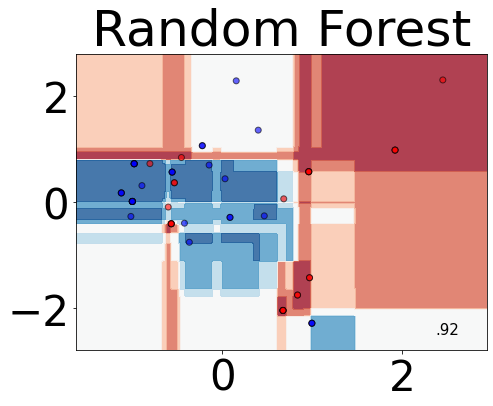

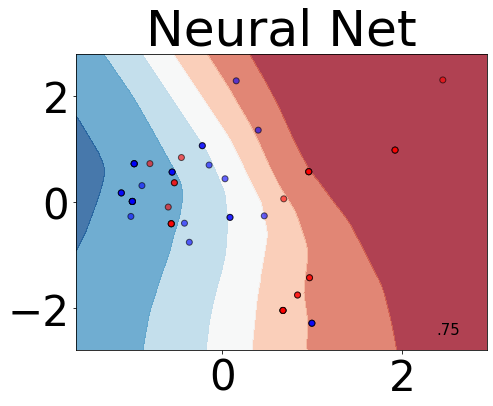

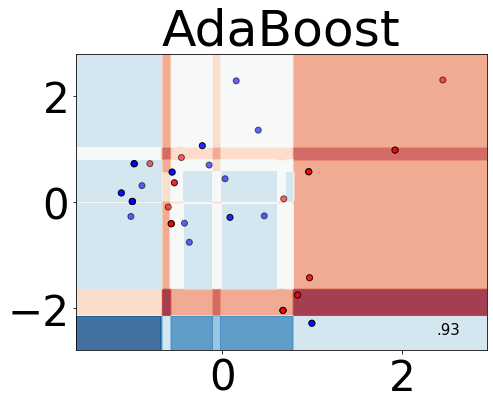

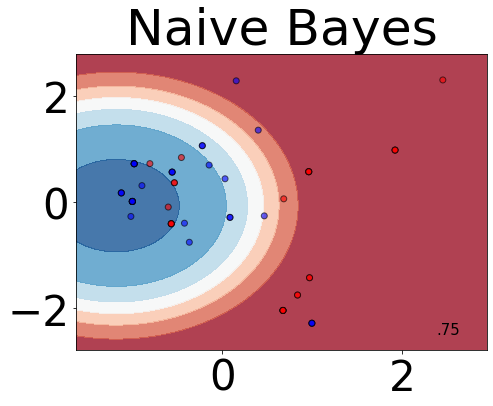

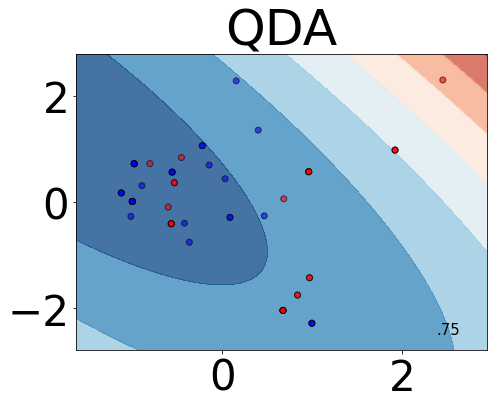

6: F7
index:  2
Nearest Neighbors: 0.87 accuracy with a standard deviation of 0.05
Linear SVM: 0.77 accuracy with a standard deviation of 0.08
RBF SVM: 0.91 accuracy with a standard deviation of 0.08
Gaussian Process: 0.93 accuracy with a standard deviation of 0.05
Decision Tree: 0.92 accuracy with a standard deviation of 0.08
Random Forest: 0.92 accuracy with a standard deviation of 0.06
Neural Net: 0.90 accuracy with a standard deviation of 0.07
AdaBoost: 0.91 accuracy with a standard deviation of 0.06
Naive Bayes: 0.76 accuracy with a standard deviation of 0.08
QDA: 0.77 accuracy with a standard deviation of 0.10


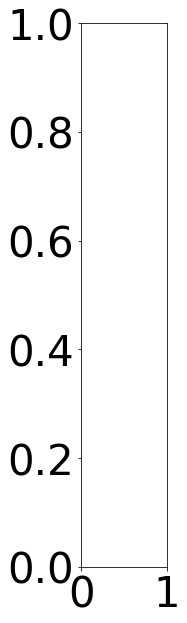

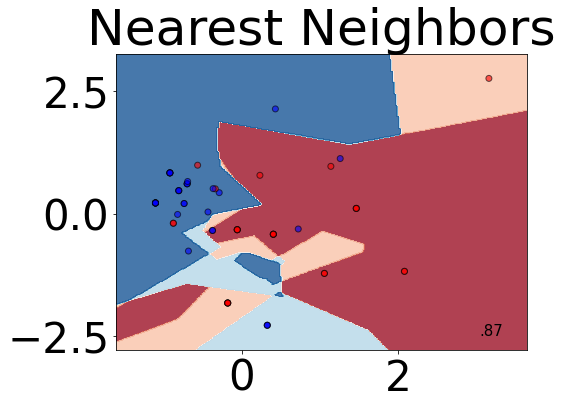

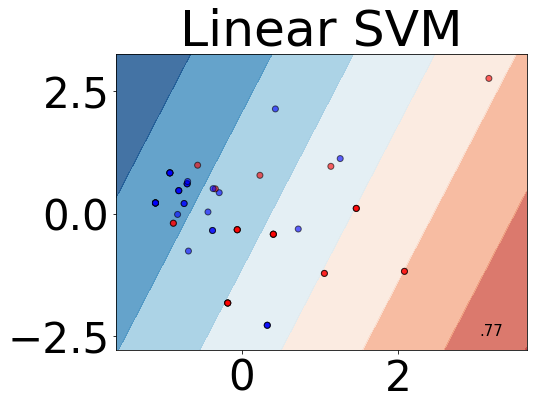

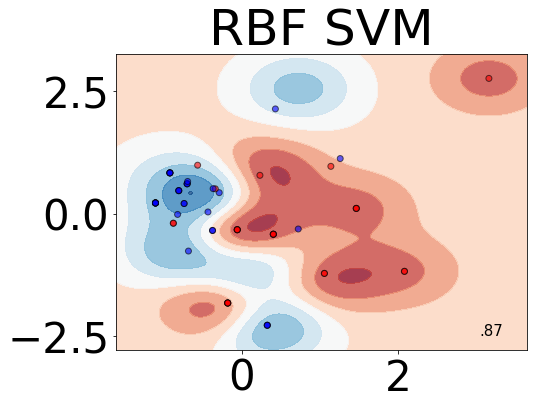

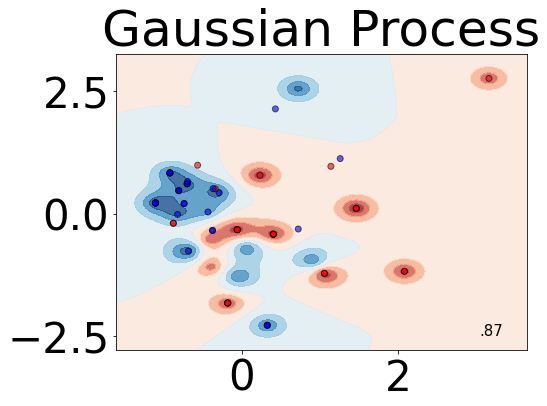

...

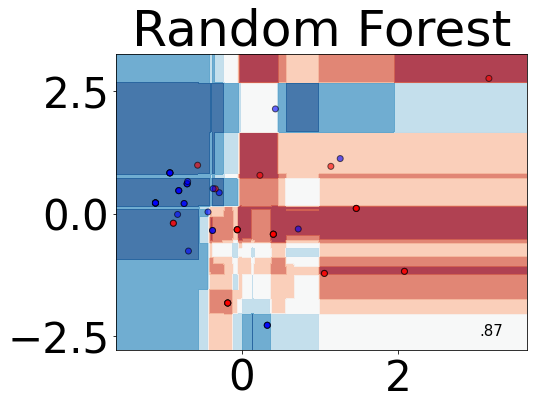

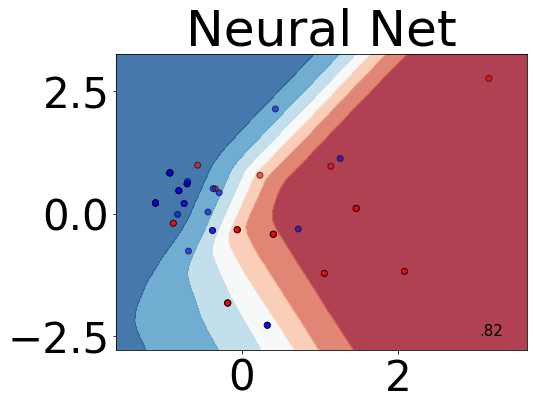

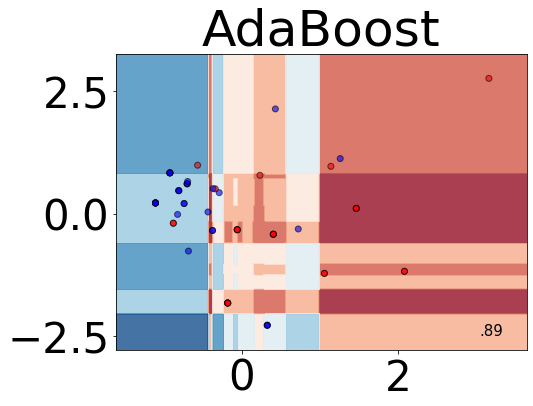

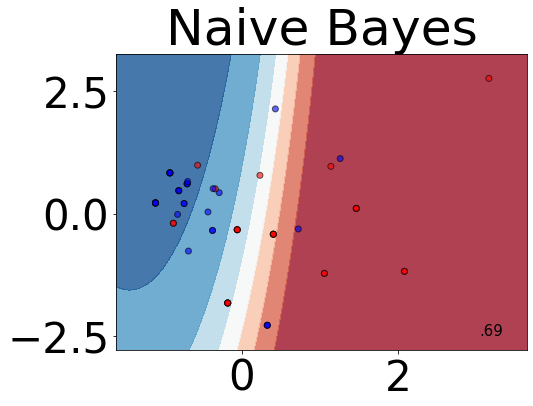

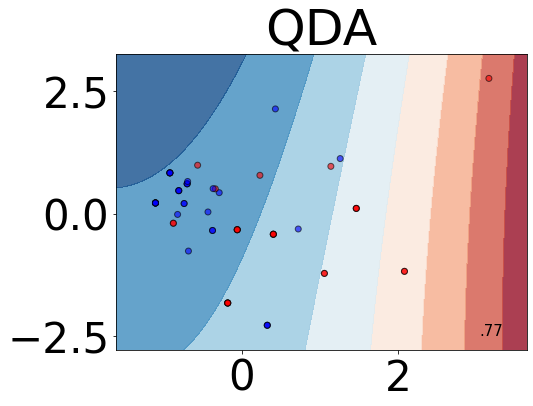

7: FT7
index:  3
Nearest Neighbors: 0.84 accuracy with a standard deviation of 0.05
Linear SVM: 0.78 accuracy with a standard deviation of 0.10
RBF SVM: 0.86 accuracy with a standard deviation of 0.11
Gaussian Process: 0.93 accuracy with a standard deviation of 0.06
Decision Tree: 0.93 accuracy with a standard deviation of 0.04
Random Forest: 0.91 accuracy with a standard deviation of 0.03
Neural Net: 0.89 accuracy with a standard deviation of 0.10
AdaBoost: 0.95 accuracy with a standard deviation of 0.04
Naive Bayes: 0.74 accuracy with a standard deviation of 0.12
QDA: 0.72 accuracy with a standard deviation of 0.11


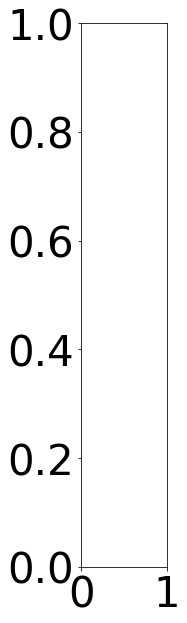

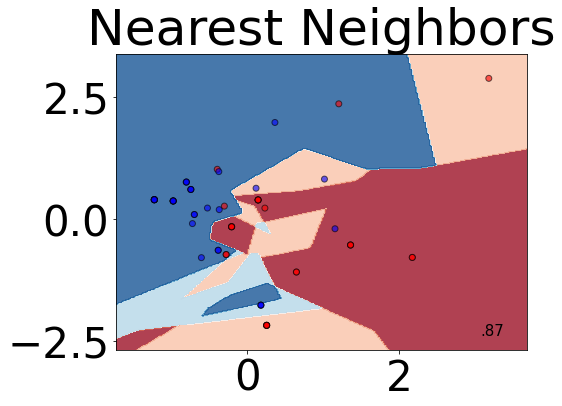

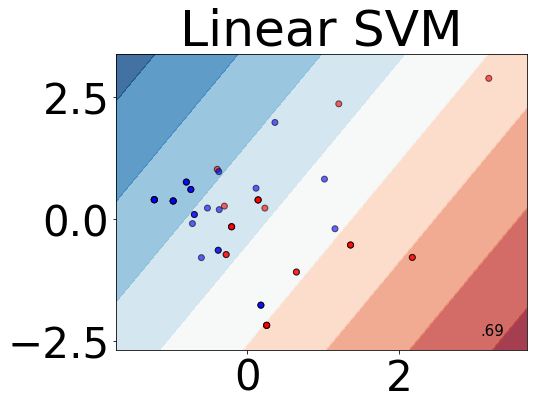

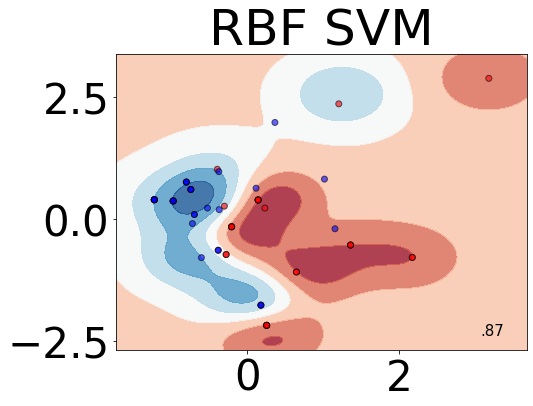

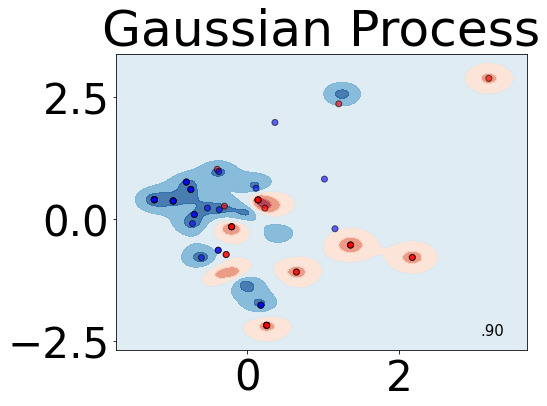

...

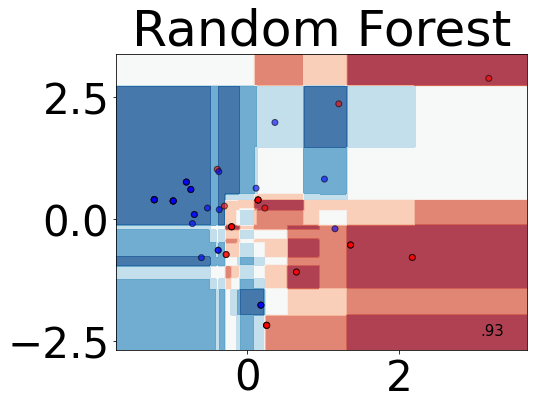

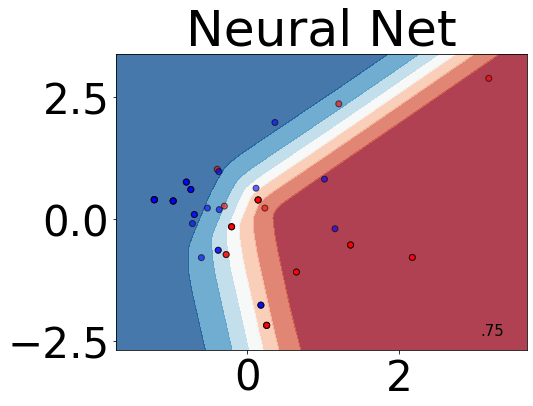

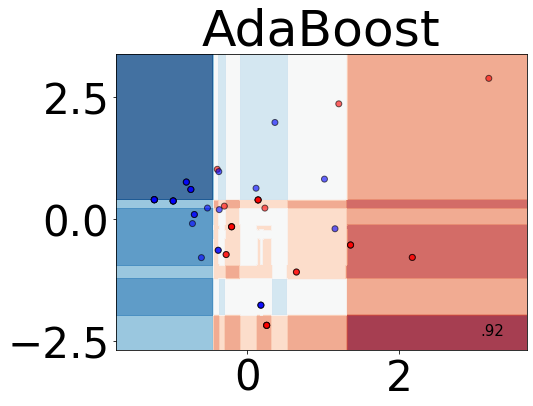

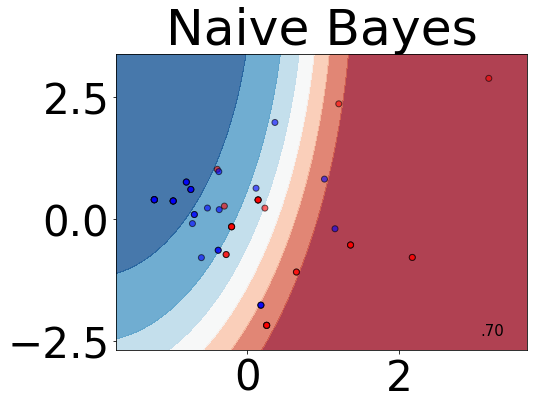

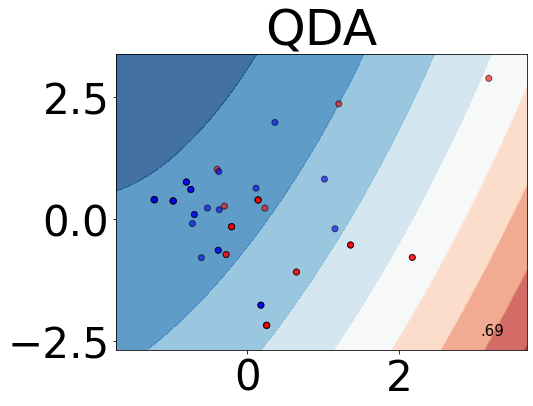

8: FC5
index:  4
Nearest Neighbors: 0.92 accuracy with a standard deviation of 0.03
Linear SVM: 0.81 accuracy with a standard deviation of 0.08
RBF SVM: 0.87 accuracy with a standard deviation of 0.08
Gaussian Process: 0.90 accuracy with a standard deviation of 0.08
Decision Tree: 0.90 accuracy with a standard deviation of 0.04
Random Forest: 0.91 accuracy with a standard deviation of 0.04
Neural Net: 0.78 accuracy with a standard deviation of 0.06
AdaBoost: 0.92 accuracy with a standard deviation of 0.06
Naive Bayes: 0.77 accuracy with a standard deviation of 0.10
QDA: 0.78 accuracy with a standard deviation of 0.09


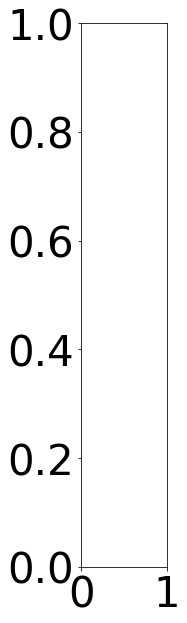

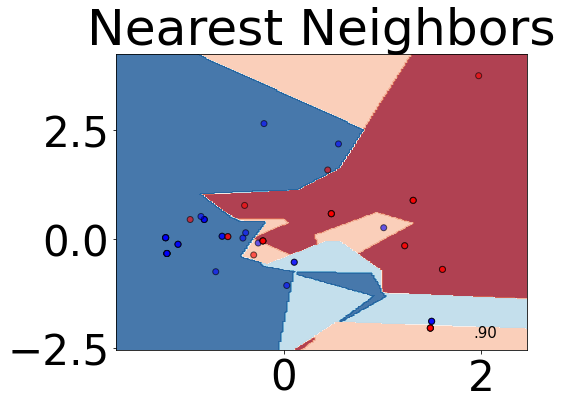

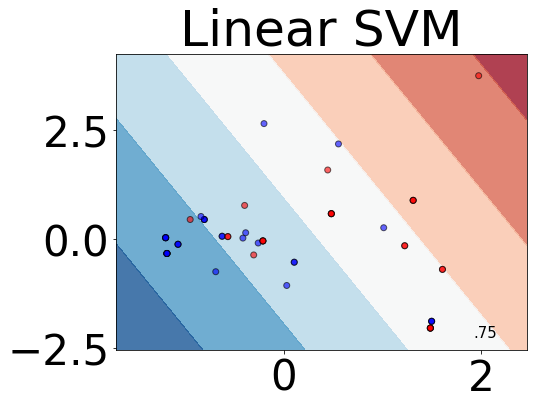

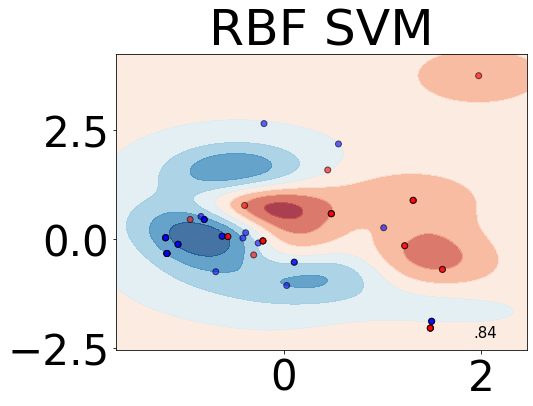

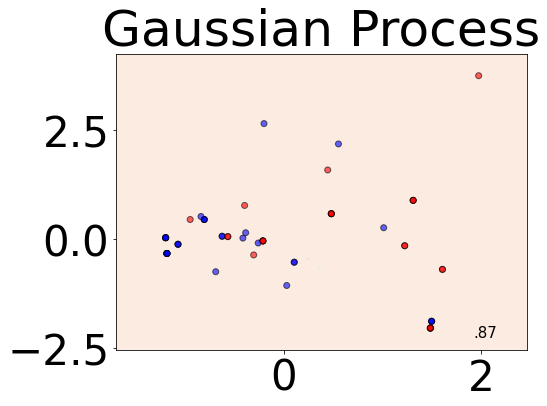

...

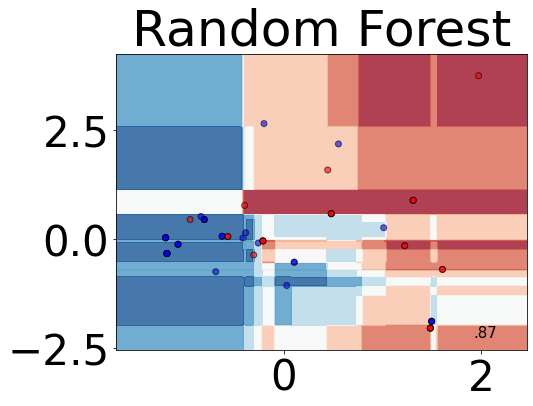

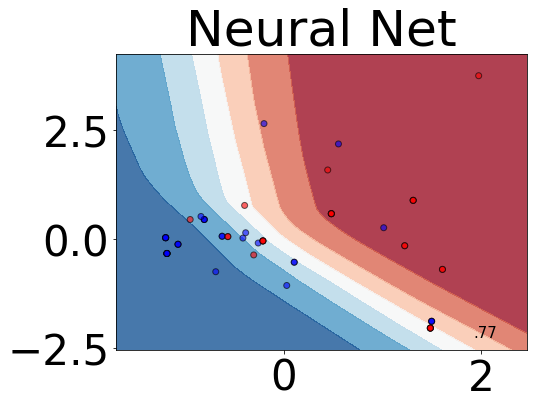

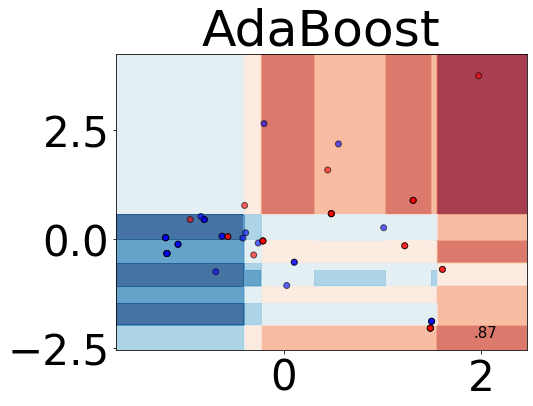

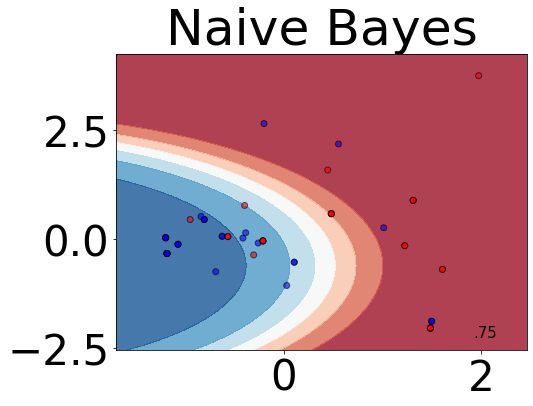

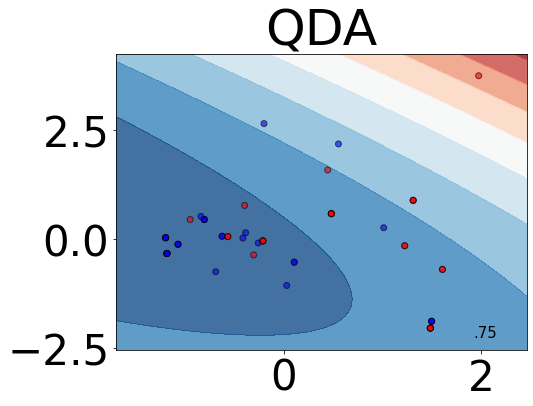

13: C5
index:  5
Nearest Neighbors: 0.88 accuracy with a standard deviation of 0.05
Linear SVM: 0.78 accuracy with a standard deviation of 0.07
RBF SVM: 0.81 accuracy with a standard deviation of 0.06
Gaussian Process: 0.93 accuracy with a standard deviation of 0.04
Decision Tree: 0.97 accuracy with a standard deviation of 0.04
----------------------------------------NEW HIGH SCORE 0.97
Random Forest: 0.95 accuracy with a standard deviation of 0.05
Neural Net: 0.80 accuracy with a standard deviation of 0.05
AdaBoost: 0.95 accuracy with a standard deviation of 0.05
Naive Bayes: 0.70 accuracy with a standard deviation of 0.14
QDA: 0.70 accuracy with a standard deviation of 0.14


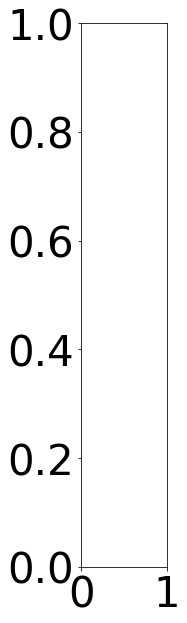

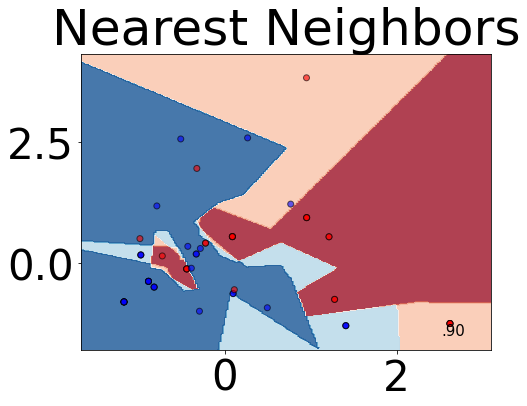

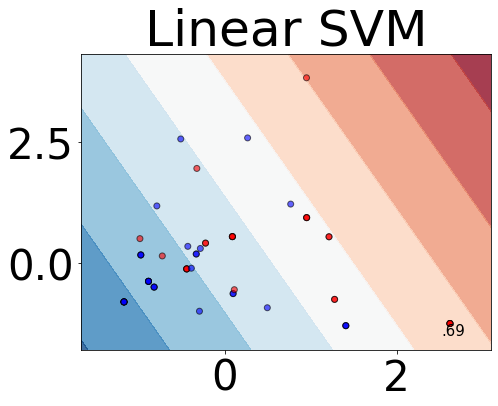

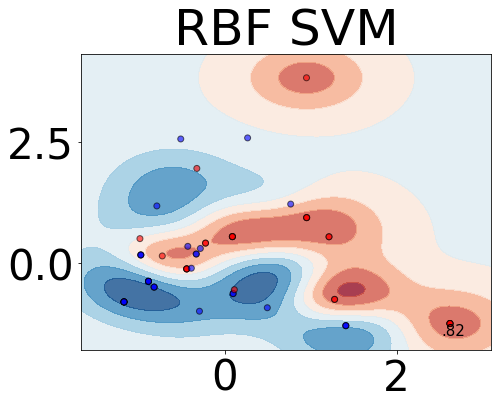

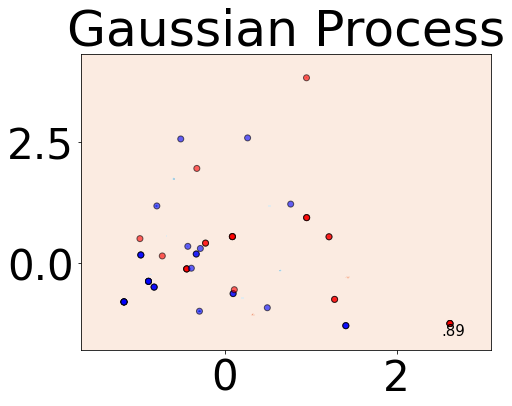

...

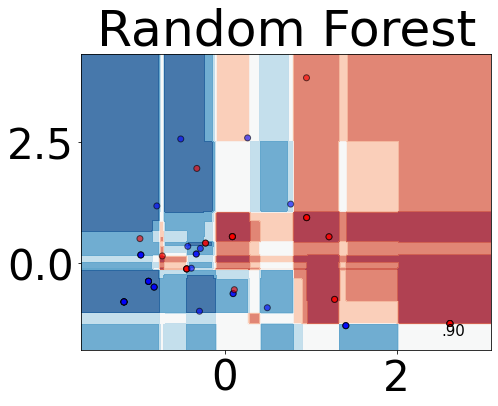

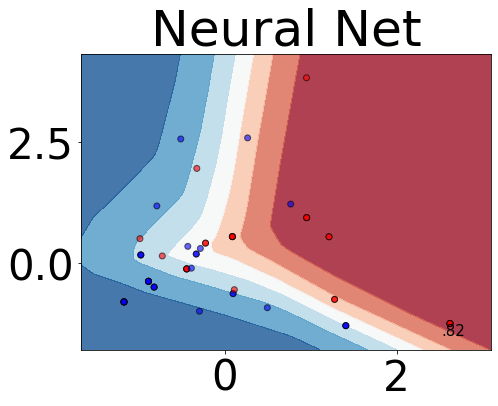

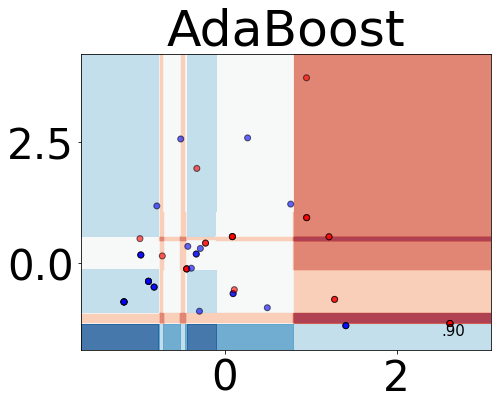

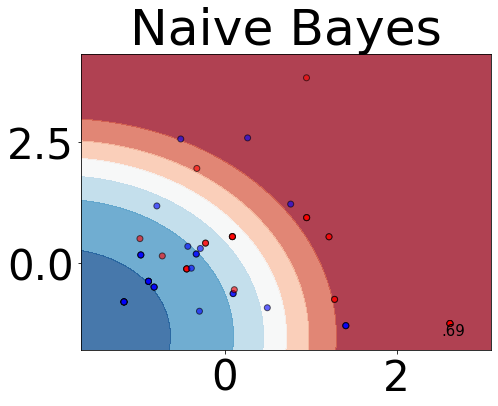

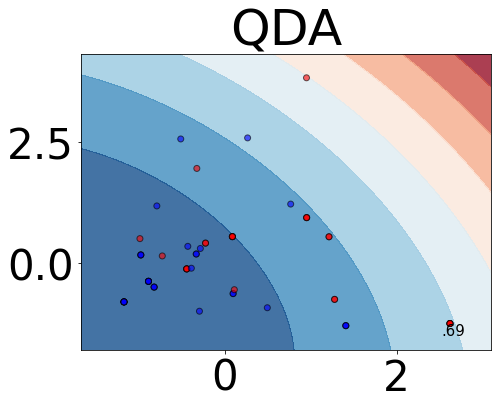

14: T7
index:  6
Nearest Neighbors: 0.81 accuracy with a standard deviation of 0.05
Linear SVM: 0.75 accuracy with a standard deviation of 0.10
RBF SVM: 0.84 accuracy with a standard deviation of 0.08
Gaussian Process: 0.93 accuracy with a standard deviation of 0.04
Decision Tree: 0.95 accuracy with a standard deviation of 0.04
Random Forest: 0.93 accuracy with a standard deviation of 0.05
Neural Net: 0.86 accuracy with a standard deviation of 0.13
AdaBoost: 0.96 accuracy with a standard deviation of 0.04
Naive Bayes: 0.74 accuracy with a standard deviation of 0.11
QDA: 0.72 accuracy with a standard deviation of 0.13


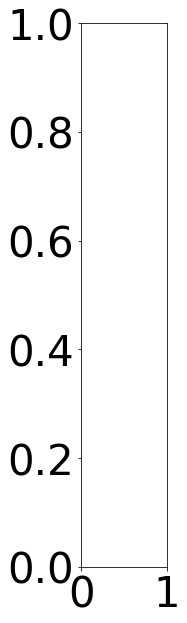

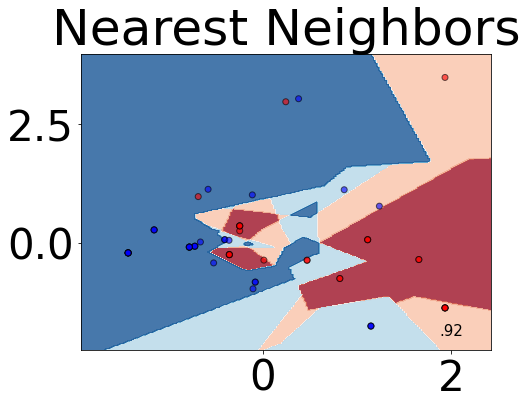

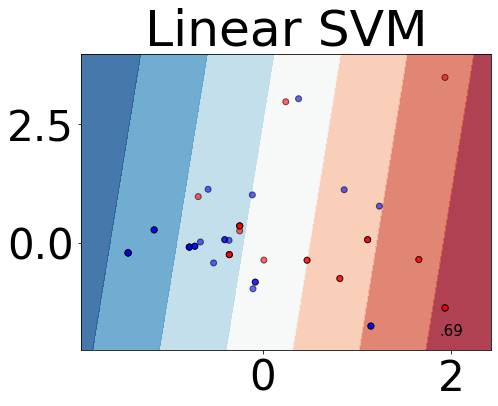

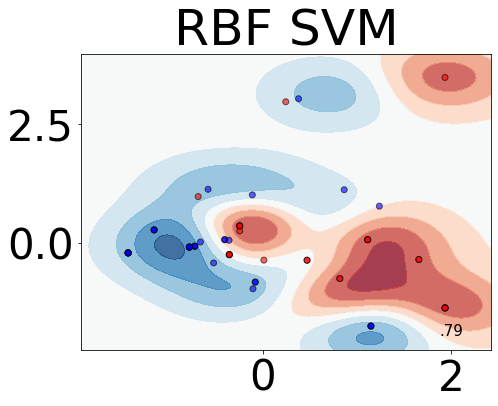

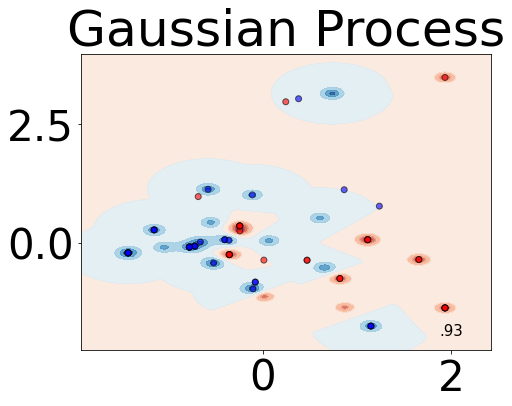

...

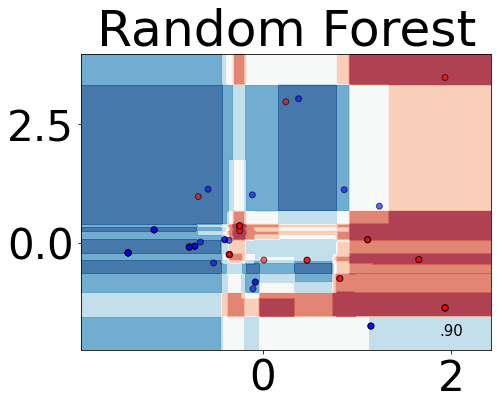

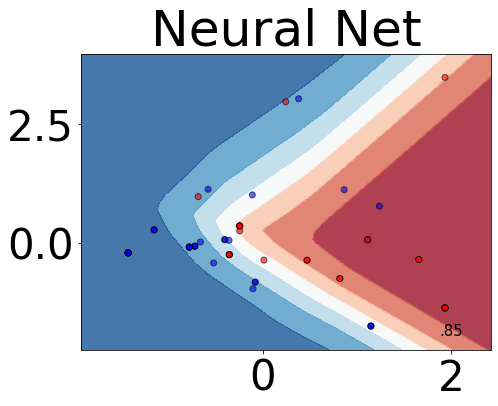

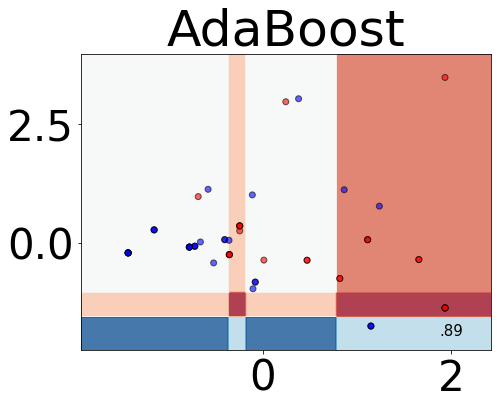

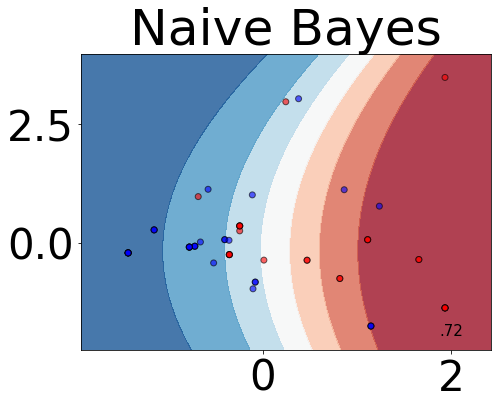

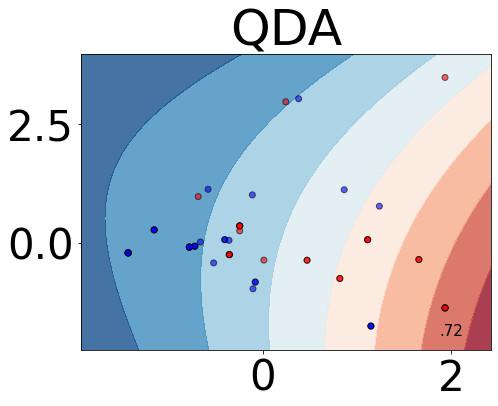

15: TP7
index:  7
Nearest Neighbors: 0.88 accuracy with a standard deviation of 0.08
Linear SVM: 0.59 accuracy with a standard deviation of 0.08
RBF SVM: 0.78 accuracy with a standard deviation of 0.15
Gaussian Process: 0.92 accuracy with a standard deviation of 0.07
Decision Tree: 0.92 accuracy with a standard deviation of 0.05
Random Forest: 0.95 accuracy with a standard deviation of 0.05
Neural Net: 0.70 accuracy with a standard deviation of 0.12
AdaBoost: 0.95 accuracy with a standard deviation of 0.05
Naive Bayes: 0.65 accuracy with a standard deviation of 0.13
QDA: 0.65 accuracy with a standard deviation of 0.10


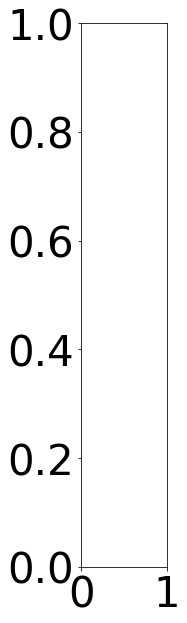

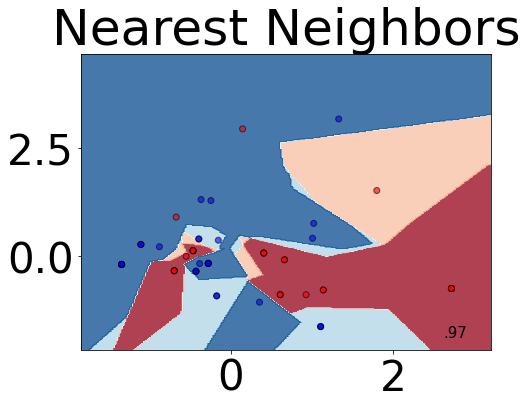

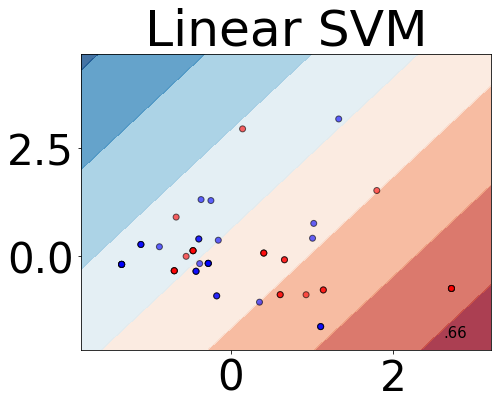

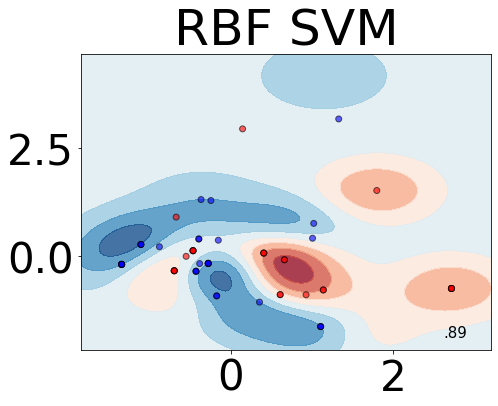

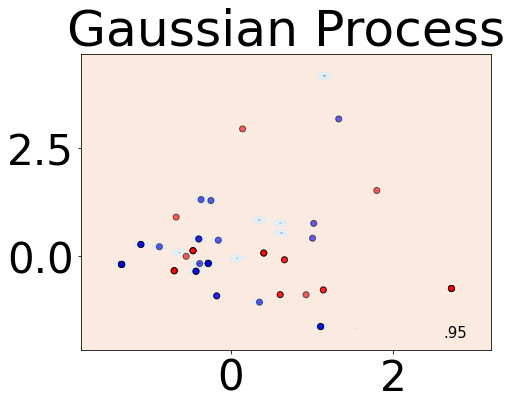

...

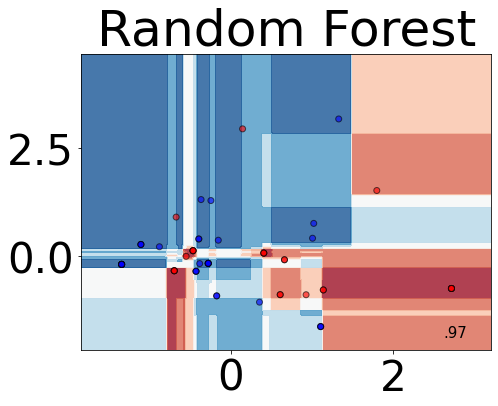

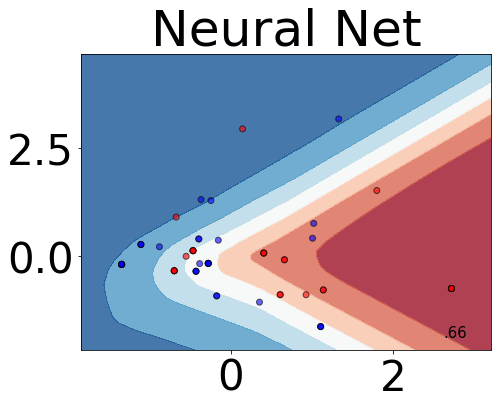

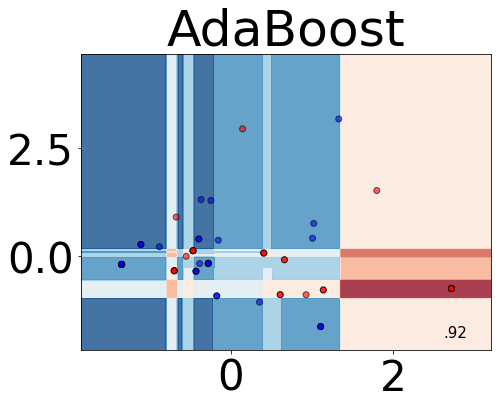

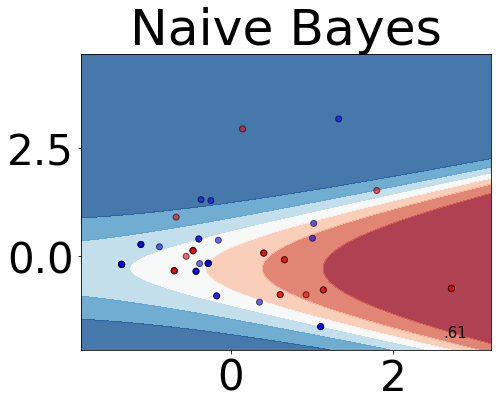

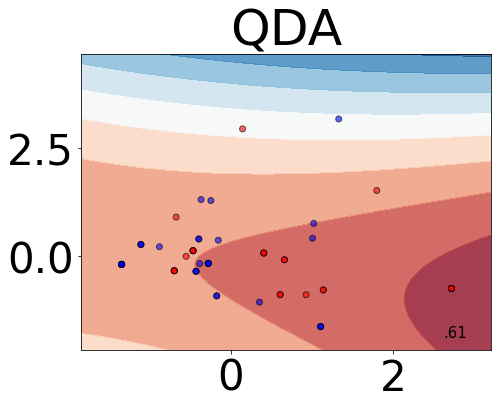

34: AF8
index:  8
Nearest Neighbors: 0.89 accuracy with a standard deviation of 0.06
Linear SVM: 0.57 accuracy with a standard deviation of 0.02
RBF SVM: 0.73 accuracy with a standard deviation of 0.11
Gaussian Process: 0.90 accuracy with a standard deviation of 0.07
Decision Tree: 0.96 accuracy with a standard deviation of 0.02
Random Forest: 0.94 accuracy with a standard deviation of 0.05
Neural Net: 0.69 accuracy with a standard deviation of 0.10
AdaBoost: 0.98 accuracy with a standard deviation of 0.03
----------------------------------------NEW HIGH SCORE 0.98
Naive Bayes: 0.56 accuracy with a standard deviation of 0.04
QDA: 0.55 accuracy with a standard deviation of 0.04


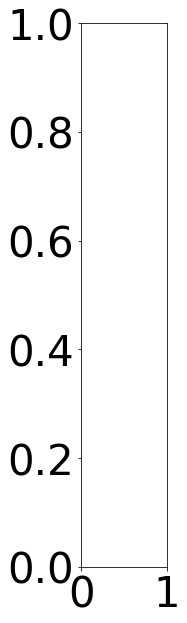

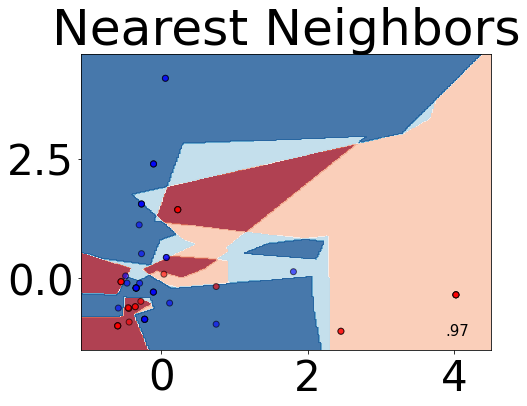

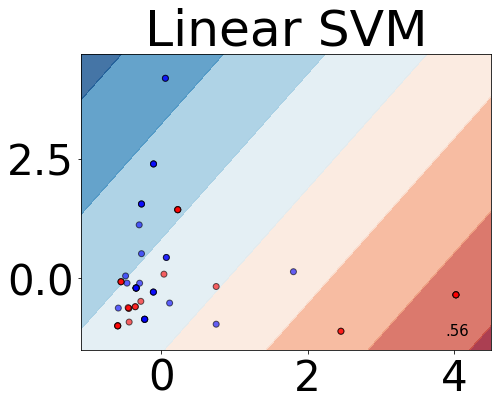

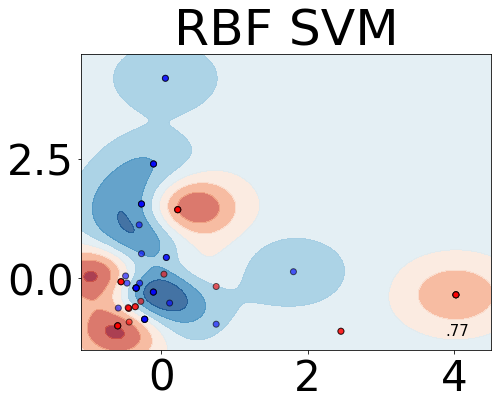

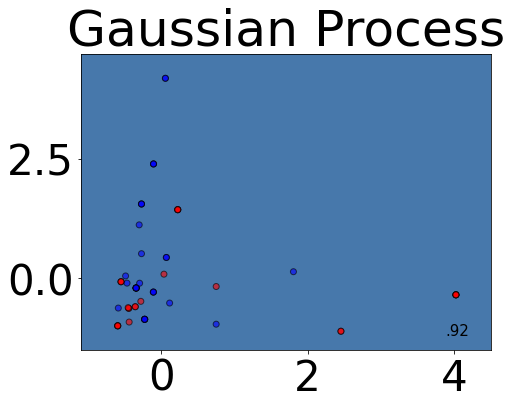

...

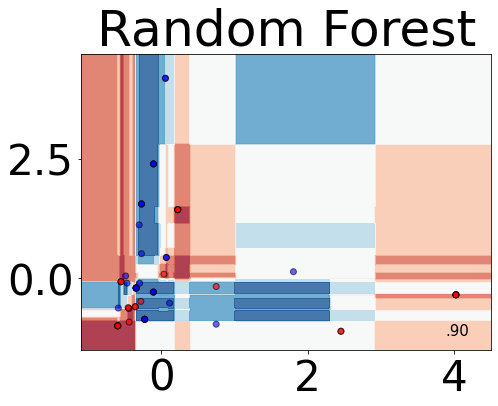

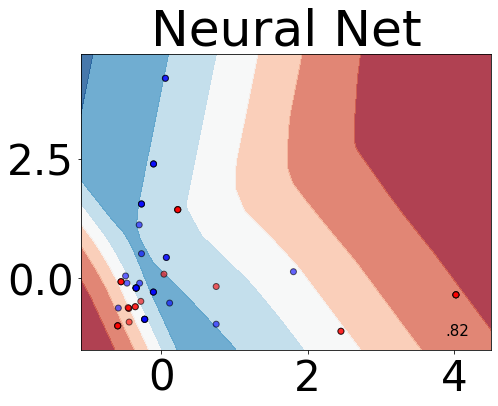

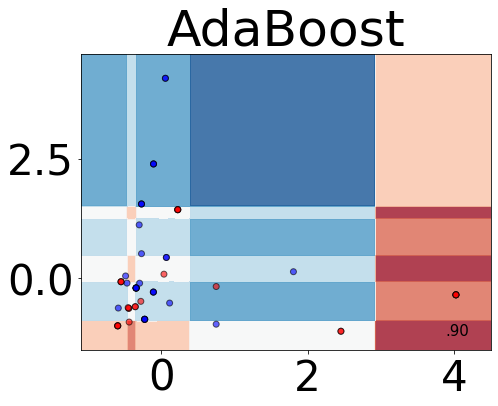

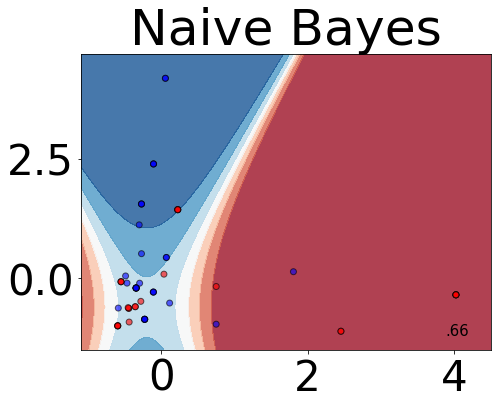

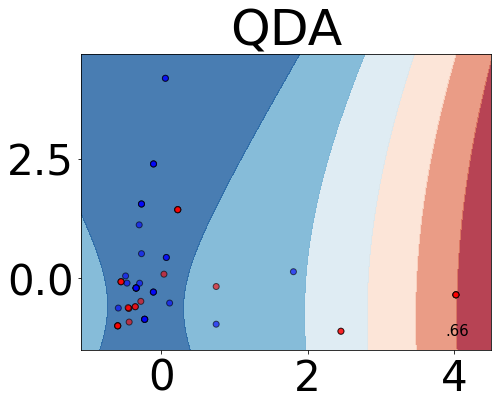

In [257]:
#!/usr/bin/python
# -*- coding: utf-8 -*-



"""
=====================
Classifier comparison
=====================

A comparison of a several classifiers in scikit-learn on synthetic datasets.
The point of this example is to illustrate the nature of decision boundaries
of different classifiers.
This should be taken with a grain of salt, as the intuition conveyed by
these examples does not necessarily carry over to real datasets.

Particularly in high-dimensional spaces, data can more easily be separated
linearly and the simplicity of classifiers such as naive Bayes and linear SVMs
might lead to better generalization than is achieved by other classifiers.

The plots show training points in solid colors and testing points
semi-transparent. The lower right shows the classification accuracy on the test
set.
"""
print(__doc__)


# Code source: Gaël Varoquaux
#              Andreas Müller
# Modified for documentation by Jaques Grobler
# License: BSD 3 clause
high_score = 0

for heureka_i, heureka_electrode in enumerate(heurekas):
    print(str(int(heurekas_n[heureka_i])) + ": " + electrode_names[int(heurekas_n[heureka_i])])
    print("index: ",heureka_i)
    #X = np.append(heureka_electrode,heurekas_test[heureka_i],axis=0)
    #y = np.append(train_labels,test_labels)
    X = heureka_electrode
    y = train_labels
    h = .02  # step size in the mesh

    names = ["Nearest Neighbors", "Linear SVM","RBF SVM", "Gaussian Process",
             "Decision Tree", "Random Forest", "Neural Net", "AdaBoost",
             "Naive Bayes", "QDA"]

    classifiers = [
        KNeighborsClassifier(3),
        SVC(kernel="linear", C=0.025),
        SVC(gamma=2, C=1),
        GaussianProcessClassifier(1.0 * RBF(1.0)),
        DecisionTreeClassifier(max_depth=5),
        RandomForestClassifier(max_depth=5, n_estimators=10, max_features=1),
        MLPClassifier(alpha=1, max_iter=1000),
        AdaBoostClassifier(),
        GaussianNB(),
        QuadraticDiscriminantAnalysis()]

    
    #figure = plt.figure(figsize=(27, 27))
    #figure.suptitle(str(int(heurekas_n[heureka_i])) + ": " + electrode_names[int(heurekas_n[heureka_i])])
    i = 1
    # iterate over datasets
    #for ds_cnt, ds in enumerate(datasets):
    # preprocess dataset, split into training and test part
    scaler = StandardScaler()
    scaler.fit(X)
    X = scaler.transform(X)
    X, X_test, y, y_test = \
        train_test_split(X, y, test_size=.4, random_state=42)
    #print(np.max(heu_test_2[heureka_i]))
    #X_test = scaler.transform(heu_test_2[heureka_i])
    #print(np.max(X_test))
    #y_test = heu_test_lab
    x_min, x_max = X[:, 0].min() - .5, X[:, 0].max() + .5
    y_min, y_max = X[:, 1].min() - .5, X[:, 1].max() + .5
    xx, yy = np.meshgrid(np.arange(x_min, x_max, h),
                         np.arange(y_min, y_max, h))

    # just plot the dataset first
    cm = plt.cm.RdBu
    cm_bright = ListedColormap(['#FF0000', '#0000FF'])
    ax = plt.subplot(1, len(classifiers) + 1, i)

    # Plot the training points
    #ax.scatter(X_train[:, 0], X_train[:, 1], c=y_train, cmap=cm_bright,
    #           edgecolors='k')
    # Plot the testing points
    #ax.scatter(X_test[:, 0], X_test[:, 1], c=y_test, cmap=cm_bright, alpha=0.6,
    #           edgecolors='k')
    #ax.set_xlim(xx.min(), xx.max())
    #ax.set_ylim(yy.min(), yy.max())
    #ax.set_xticks(())
    #ax.set_yticks(())
    
    i += 1
    
    # iterate over classifiers
    for name, clf in zip(names, classifiers):
        plt.figure(figsize=(25, 25)) 
        ax = plt.subplot(4, 3, i)
        ax.set_title(names[i-2])
        clf.fit(X, y)
        score = clf.score(X_test, y_test)
        
        # Plot the decision boundary. For that, we will assign a color to each
        # point in the mesh [x_min, x_max]x[y_min, y_max].
        if hasattr(clf, "decision_function"):
            Z = clf.decision_function(np.c_[xx.ravel(), yy.ravel()])
        else:
            Z = clf.predict_proba(np.c_[xx.ravel(), yy.ravel()])[:, 1]

        # Put the result into a color plot
        Z = Z.reshape(xx.shape)
        ax.contourf(xx, yy, Z, cmap=cm, alpha=.8)

        # Plot the training points
        #ax.scatter(X[:, 0], X[:, 1], c=y, cmap=cm_bright,
        #           edgecolors='k')
        # Plot the testing points
        ax.scatter(X_test[:, 0], X_test[:, 1], c=y_test, cmap=cm_bright,
                   edgecolors='k', alpha=0.6)

        #ax.set_xlim(xx.min(), xx.max())
        #ax.set_ylim(yy.min(), yy.max())
        #ax.set_xticks(())
        #ax.set_yticks(())
        ax.text(xx.max() - .3, yy.min() + .3, ('%.2f' % score).lstrip('0'),
                size=15, horizontalalignment='right')
        
        scores = cross_val_score(clf, X, y, cv=5)
        #print("CV score", scores)
        print(names[i-2]  + ": %0.2f accuracy with a standard deviation of %0.2f" % (scores.mean(), scores.std()))
        if scores.mean() > high_score:
            high_score = scores.mean()
            print("----------------------------------------NEW HIGH SCORE %0.2f" %scores.mean())
        i += 1
    
    #plt.tight_layout()
    plt.show()

In [260]:
#!/usr/bin/python
# -*- coding: utf-8 -*-

"""
=====================
Classifier comparison
=====================

A comparison of a several classifiers in scikit-learn on synthetic datasets.
The point of this example is to illustrate the nature of decision boundaries
of different classifiers.
This should be taken with a grain of salt, as the intuition conveyed by
these examples does not necessarily carry over to real datasets.

Particularly in high-dimensional spaces, data can more easily be separated
linearly and the simplicity of classifiers such as naive Bayes and linear SVMs
might lead to better generalization than is achieved by other classifiers.

The plots show training points in solid colors and testing points
semi-transparent. The lower right shows the classification accuracy on the test
set.
"""
print(__doc__)


# Code source: Gaël Varoquaux
#              Andreas Müller
# Modified for documentation by Jaques Grobler
# License: BSD 3 clause

import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.datasets import make_moons, make_circles, make_classification
from sklearn.neural_network import MLPClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.gaussian_process import GaussianProcessClassifier
from sklearn.gaussian_process.kernels import RBF
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.discriminant_analysis import QuadraticDiscriminantAnalysis
test_high_score = 0
for heureka_i, heureka_electrode in enumerate(heurekas):
    #X_train = heureka_electrode
    #y_train = train_labels
    #X_test = heurekas_test[heureka_i]
    #y_test = test_labels
    #print(X_train.shape)
    #print(X_test.shape)
    
    scaler = StandardScaler()
    scaler.fit(heureka_electrode)
    X = scaler.transform(heureka_electrode)
    #X, X_test, y, y_test = \
    #    train_test_split(X, y, test_size=.4, random_state=42)
    #print(np.max(heu_test_2[heureka_i]))
    X_test = scaler.transform(heurekas_test[heureka_i])
    #print(np.max(X_test))
    y_test = test_labels#heu_test_lab
    h = .02  # step size in the mesh

    names = ["Nearest Neighbors", "Linear SVM", "RBF SVM", "Gaussian Process",
             "Decision Tree", "Random Forest", "Neural Net", "AdaBoost",
             "Naive Bayes", "QDA"]

    classifiers = [
        KNeighborsClassifier(3),
        SVC(kernel="linear", C=0.025),
        SVC(gamma=2, C=1),
        GaussianProcessClassifier(1.0 * RBF(1.0)),
        DecisionTreeClassifier(max_depth=5),
        RandomForestClassifier(max_depth=5, n_estimators=10, max_features=1),
        MLPClassifier(alpha=1, max_iter=1000),
        AdaBoostClassifier(),
        GaussianNB(),
        QuadraticDiscriminantAnalysis()]

    print(str(int(heurekas_n[heureka_i])) + ": " + electrode_names[int(heurekas_n[heureka_i])])
    print("index: ",heureka_i)
    #figure = plt.figure(figsize=(27, 27))
    #figure.suptitle(str(int(heurekas_n[heureka_i])) + ": " + electrode_names[int(heurekas_n[heureka_i])])
    i = 1
    # iterate over datasets
    #for ds_cnt, ds in enumerate(datasets):
    # preprocess dataset, split into training and test part
    #X_2 = np.append(X_train,X_test,axis=0)
    #print(X_2.shape)
    #X_2 = StandardScaler().fit_transform(X_2)
    #print(X_2.shape)
    #X_train = X_2[:train_data.shape[0],:]
    #X_test = X_2[train_data.shape[0]:,:]
    #print(X_train.shape)
    #print(X_test.shape)
    #x_min, x_max = X_2[:, 0].min() - .5, X_2[:, 0].max() + .5
    #y_min, y_max = X_2[:, 1].min() - .5, X_2[:, 1].max() + .5
    #xx, yy = np.meshgrid(np.arange(x_min, x_max, h),
    #                     np.arange(y_min, y_max, h))
    """
    # just plot the dataset first
    cm = plt.cm.RdBu
    cm_bright = ListedColormap(['#FF0000', '#0000FF'])
    ax = plt.subplot(1, len(classifiers) + 1, i)

    # Plot the training points
    ax.scatter(X_train[:, 0], X_train[:, 1], c=y_train, cmap=cm_bright,
               edgecolors='k')
    # Plot the testing points
    ax.scatter(X_test[:, 0], X_test[:, 1], c=y_test, cmap=cm_bright, alpha=0.6,
               edgecolors='k')
    ax.set_xlim(xx.min(), xx.max())
    ax.set_ylim(yy.min(), yy.max())
    ax.set_xticks(())
    ax.set_yticks(())
    """
    i += 1

    # iterate over classifiers
    for name, clf in zip(names, classifiers):
        #ax = plt.subplot(4,3, i)
        #ax.set_title(names[i-2])
        clf.fit(X_train, y_train)
        score = clf.score(X_test, y_test)
            

        """
        # Plot the decision boundary. For that, we will assign a color to each
        # point in the mesh [x_min, x_max]x[y_min, y_max].
        if hasattr(clf, "decision_function"):
            Z = clf.decision_function(np.c_[xx.ravel(), yy.ravel()])
        else:
            Z = clf.predict_proba(np.c_[xx.ravel(), yy.ravel()])[:, 1]

        # Put the result into a color plot
        Z = Z.reshape(xx.shape)
        ax.contourf(xx, yy, Z, cmap=cm, alpha=.8)

        # Plot the training points
        ax.scatter(X_train[:, 0], X_train[:, 1], c=y_train, cmap=cm_bright,
                   edgecolors='k')
        # Plot the testing points
        ax.scatter(X_test[:, 0], X_test[:, 1], c=y_test, cmap=cm_bright,
                   edgecolors='k', alpha=0.6)

        ax.set_xlim(xx.min(), xx.max())
        ax.set_ylim(yy.min(), yy.max())
        ax.set_xticks(())
        ax.set_yticks(())

        ax.text(xx.max() - .3, yy.min() + .3, ('%.2f' % score).lstrip('0'),
                size=15, horizontalalignment='right')
        """
        print(names[i-2] + ": " + str(score))
        #scores = cross_val_score(clf, X_train, y_train, cv=10)
        #print("CV score", scores)
        #print(names[i-2]  + ": %0.2f accuracy with a standard deviation of %0.2f" % (scores.mean(), scores.std()))
        i += 1
        if score>test_high_score:
            print("--------------------HIGH SCORE: ", score)
            test_high_score = score

    #plt.tight_layout()
    #plt.show()



Classifier comparison

A comparison of a several classifiers in scikit-learn on synthetic datasets.
The point of this example is to illustrate the nature of decision boundaries
of different classifiers.
This should be taken with a grain of salt, as the intuition conveyed by
these examples does not necessarily carry over to real datasets.

Particularly in high-dimensional spaces, data can more easily be separated
linearly and the simplicity of classifiers such as naive Bayes and linear SVMs
might lead to better generalization than is achieved by other classifiers.

The plots show training points in solid colors and testing points
semi-transparent. The lower right shows the classification accuracy on the test
set.

4: F3
index:  0
Nearest Neighbors: 0.4868421052631579
--------------------HIGH SCORE:  0.4868421052631579
Linear SVM: 0.6842105263157895
--------------------HIGH SCORE:  0.6842105263157895
RBF SVM: 0.5921052631578947
Gaussian Process: 0.3157894736842105
Decision Tree: 0.30263

In [246]:

print(heurekas.shape)
heu = heurekas[1:2]
print(heu.shape)
multi_dim_heurekas = heu.reshape((152,2))
#multi_dim_heurekas = np.hstack((multi_dim_heurekas,heurekas[1:2].reshape((152,2))))
multi_dim_heurekas = np.hstack((multi_dim_heurekas,heurekas[5:6].reshape((152,2))))
#multi_dim_heurekas = np.hstack((multi_dim_heurekas,heurekas[1:2].reshape((127,2))))

print(multi_dim_heurekas.shape)
print(heurekas_test.shape)
heu_test = heurekas_test[1:2]
multi_dim_heurekas_test = heu_test.reshape((76,2))
#multi_dim_heurekas_test = np.hstack((multi_dim_heurekas_test,heurekas_test[1:2].reshape((76,2))))
multi_dim_heurekas_test = np.hstack((multi_dim_heurekas_test,heurekas_test[5:6].reshape((76,2))))
#multi_dim_heurekas_test = np.hstack((multi_dim_heurekas_test,heurekas_test[1:2].reshape((47,2))))

print(multi_dim_heurekas_test.shape)



(8, 152, 2)
(1, 152, 2)
(152, 4)
(8, 76, 2)
(76, 4)


In [247]:
X_train = multi_dim_heurekas
y = train_labels
#X_test = multi_dim_heurekas_test
#y_test = test_labels
#print(X_train.shape)
#print(X_test.shape)
h = .02  # step size in the mesh

names = ["Nearest Neighbors", "Linear SVM", "RBF SVM", "Gaussian Process",
         "Decision Tree", "Random Forest", "Neural Net", "AdaBoost",
         "Naive Bayes", "QDA"]

classifiers = [
    KNeighborsClassifier(3),
    SVC(kernel="linear", C=0.025),
    SVC(gamma=2, C=1),
    GaussianProcessClassifier(1.0 * RBF(1.0)),
    DecisionTreeClassifier(max_depth=5),
    RandomForestClassifier(max_depth=5, n_estimators=10, max_features=1),
    MLPClassifier(alpha=1, max_iter=1000),
    AdaBoostClassifier(),
    GaussianNB(),
    QuadraticDiscriminantAnalysis()]

X = StandardScaler().fit_transform(multi_dim_heurekas)
X, X_test, y, y_test = \
    train_test_split(X, y, test_size=.4, random_state=42)
# just plot the dataset first

# iterate over classifiers
for name, clf in zip(names, classifiers):
    clf.fit(X, y)
    #print(names[i-1] + ": " + str(score))
    #scores = cross_val_score(clf, X, y, cv=5)
    #print("CV score", scores.mean)
    #print(names[i-2]  + ": %0.2f accuracy with a standard deviation of %0.2f" % (scores.mean(), scores.std()))
    i += 1
    #scores = cross_val_score(clf, X, y, cv=10)
    #print("CV score", scores)
    #print(name  + ": %0.2f accuracy with a standard deviation of %0.2f" % (scores.mean(), scores.std()))
    score = clf.score(X_test, y_test)
    print(name+ str(score))
    


Nearest Neighbors0.8524590163934426
Linear SVM0.7704918032786885
RBF SVM0.8852459016393442
Gaussian Process0.8852459016393442
Decision Tree0.8524590163934426
Random Forest0.9016393442622951
Neural Net0.9016393442622951
AdaBoost0.9344262295081968
Naive Bayes0.7704918032786885
QDA0.819672131147541


In [249]:
#X_train = multi_dim_heurekas
#y_train = train_labels
#X_test = multi_dim_heurekas_test
#y_test = test_labels

#print(X_train.shape)
#print(X_test.shape)
h = .02  # step size in the mesh

names = ["Nearest Neighbors", "Linear SVM", "RBF SVM", "Gaussian Process",
         "Decision Tree", "Random Forest", "Neural Net", "AdaBoost",
         "Naive Bayes", "QDA"]

classifiers = [
    KNeighborsClassifier(3),
    SVC(kernel="linear", C=0.025),
    SVC(gamma=2, C=1),
    GaussianProcessClassifier(1.0 * RBF(1.0)),
    DecisionTreeClassifier(max_depth=5),
    RandomForestClassifier(max_depth=5, n_estimators=10, max_features=1),
    MLPClassifier(alpha=1, max_iter=1000),
    AdaBoostClassifier(),
    GaussianNB(),
    QuadraticDiscriminantAnalysis()]

scaler = StandardScaler()
scaler.fit(multi_dim_heurekas)
X = scaler.transform(multi_dim_heurekas)
y = train_labels
#X, X_test, y, y_test = \
#    train_test_split(X, y, test_size=.4, random_state=42)
#print(np.max(heu_test_2[heureka_i]))
X_test = scaler.transform(multi_dim_heurekas_test)
#print(np.max(X_test))
y_test = test_labels#heu_test_lab
i = 1
# iterate over datasets
#for ds_cnt, ds in enumerate(datasets):
# preprocess dataset, split into training and test part

#print(X_train.shape)
#print(X_test.shape)
# just plot the dataset first

# iterate over classifiers
for name, clf in zip(names, classifiers):
    clf.fit(X, y)
    score = clf.score(X_test, y_test)
    print(names[i-1] + ": " + str(score))
    #scores = cross_val_score(clf, X, y, cv=5)
    #print("CV score", scores.mean)
    #print(names[i-2]  + ": %0.2f accuracy with a standard deviation of %0.2f" % (scores.mean(), scores.std()))
    i += 1
    


Nearest Neighbors: 0.5394736842105263
Linear SVM: 0.5131578947368421
RBF SVM: 0.8947368421052632
Gaussian Process: 0.3157894736842105
Decision Tree: 0.42105263157894735
Random Forest: 0.6052631578947368
Neural Net: 0.4868421052631579
AdaBoost: 0.18421052631578946
Naive Bayes: 0.3157894736842105
QDA: 0.868421052631579


### Training set

[0.64705882 0.58823529 0.66666667 0.7254902  0.68627451 0.58823529
 0.70588235 0.66666667 0.78431373 0.68627451 0.7254902  0.62745098
 0.64705882 0.64705882 0.64705882 0.58823529 0.58823529 0.68627451
 0.70588235 0.64705882 0.66666667 0.56862745 0.64705882 0.62745098
 0.60784314 0.68627451 0.66666667 0.74509804 0.62745098 0.62745098
 0.68627451 0.64705882 0.66666667 0.76470588 0.58823529 0.62745098
 0.68627451 0.66666667 0.66666667 0.68627451 0.58823529 0.56862745
 0.62745098 0.74509804 0.7254902  0.58823529 0.62745098 0.66666667
 0.66666667 0.70588235 0.70588235 0.68627451 0.62745098 0.74509804
 0.80392157 0.76470588 0.78431373 0.76470588 0.60784314 0.64705882
 0.70588235 0.66666667 0.68627451 0.62745098]


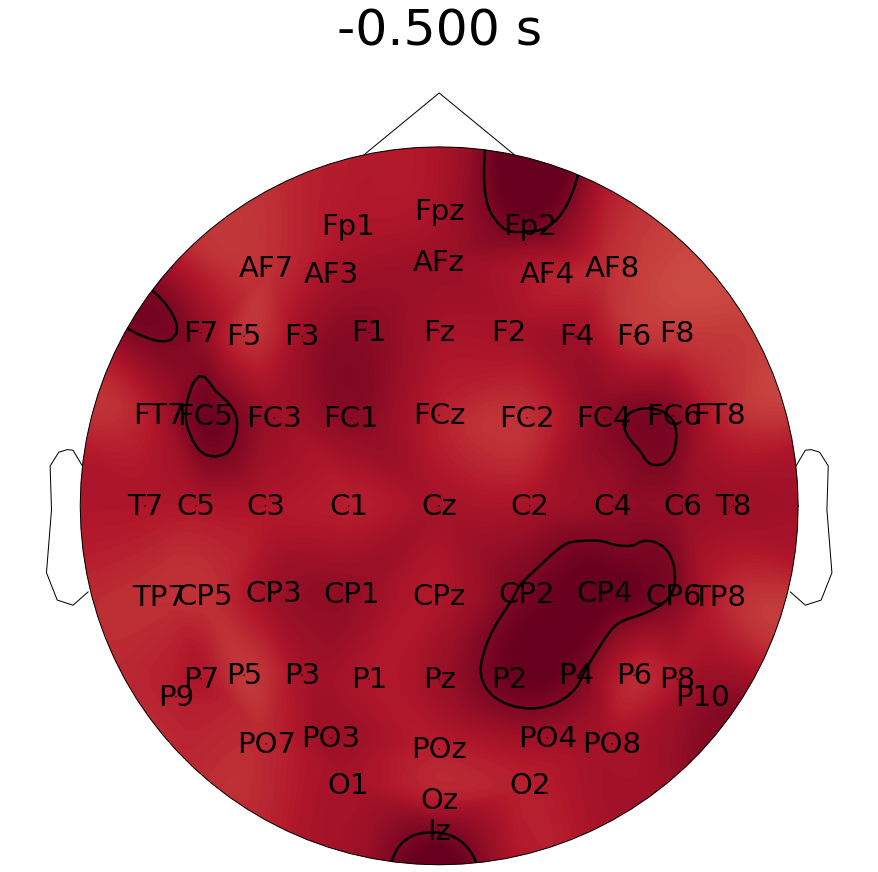

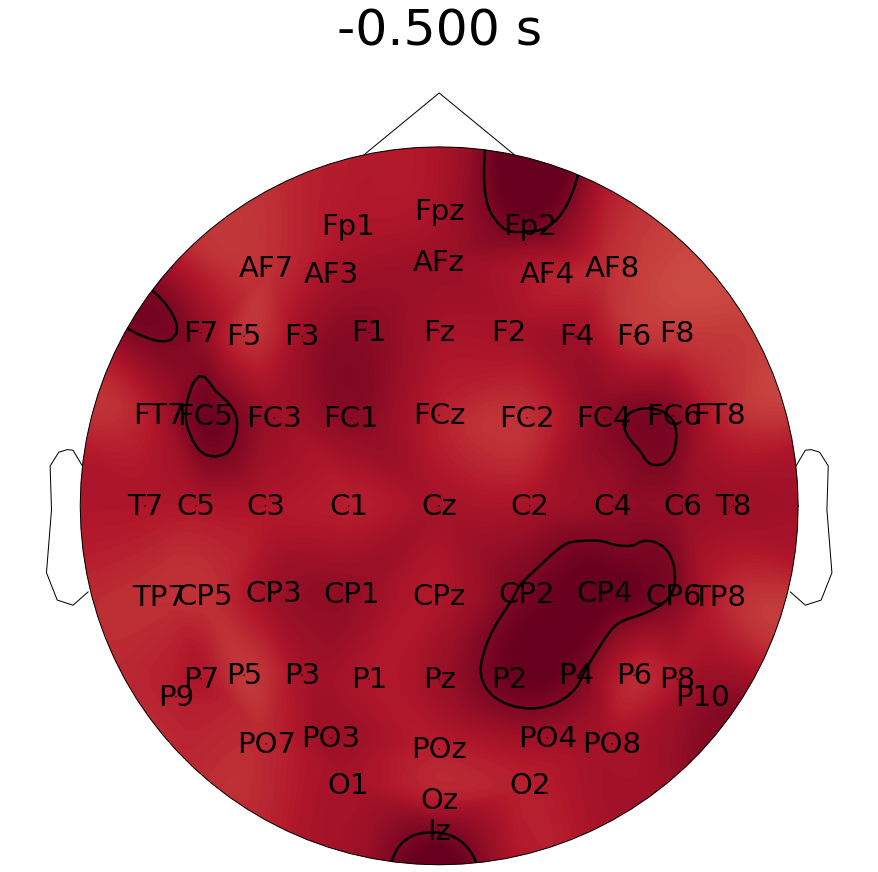

In [26]:
print(k_class_scores)
k_class = k_class_scores.reshape((64,1))
evoked_array = mne.EvokedArray(k_class, info, tmin=-0.5,
                               nave=k_class.shape[0], comment='simulated')

#mne.viz.plot_topomap(heurekas_topo,heurekas_topo.shape)

evoked_array.plot_topomap(-0.5, ch_type='eeg', time_unit='s',colorbar=False,
                    size=10, res=128, show_names=True)

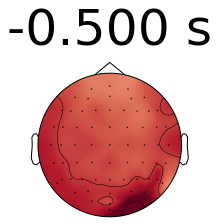

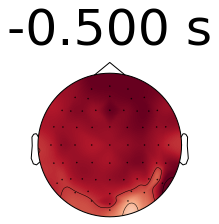

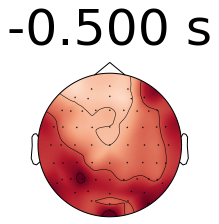

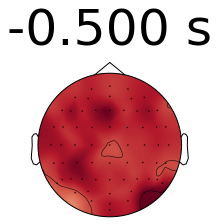

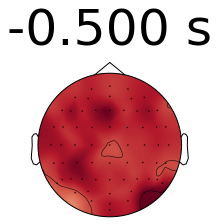

In [287]:
mat_mean_p_p= np.array(arr_mean_p_p).reshape((64,1))

evoked_array = mne.EvokedArray(mat_mean_p_p, info, tmin=-0.5,
                               nave=mat_mean_p_p.shape[0], comment='simulated')
evoked_array.plot_topomap(-0.5, ch_type='eeg', time_unit='s',colorbar=False,
                    size=2, res=128)

mat_mean_u_u = np.array(arr_mean_u_u).reshape((64,1))

evoked_array = mne.EvokedArray(mat_mean_u_u, info, tmin=-0.5,
                               nave=mat_mean_u_u.shape[0], comment='simulated')
evoked_array.plot_topomap(-0.5, ch_type='eeg', time_unit='s',colorbar=False,
                    size=2, res=128)


mat_med_p_p= np.array(arr_med_p_p).reshape((64,1))

evoked_array = mne.EvokedArray(mat_med_p_p, info, tmin=-0.5,
                               nave=mat_med_p_p.shape[0], comment='simulated')
evoked_array.plot_topomap(-0.5, ch_type='eeg', time_unit='s',colorbar=False,
                    size=2, res=128)

mat_med_u_u = np.array(arr_med_u_u).reshape((64,1))

evoked_array = mne.EvokedArray(mat_med_u_u, info, tmin=-0.5,
                               nave=mat_med_u_u.shape[0], comment='simulated')
evoked_array.plot_topomap(-0.5, ch_type='eeg', time_unit='s',colorbar=False,
                    size=2, res=128)

In [ ]:
heurekas_n

### Test data

0
mean unp to unp 0.6447191295465786
mean unp to p 0.6883935318008778
mean p to p 0.6725680826693667
median unp to unp 0.057464891239170424
median unp to p 0.3559346469256754
median p to p 0.35918186296095345
--------------SUCCEESS----------------------
1
mean unp to unp 0.676413859316679
mean unp to p 0.6841446069469223
mean p to p 0.6391705181915389
median unp to unp 0.08505382032291225
median unp to p 0.46997538897801894
median p to p 0.47695165261338746
--------------SUCCEESS----------------------
2
mean unp to unp 0.5968072088056191
mean unp to p 0.653208360542384
mean p to p 0.6346632046462267
median unp to unp 0.04298971232521146
median unp to p 0.4456898084374654
median p to p 0.4638125779885153
--------------SUCCEESS----------------------
3
mean unp to unp 0.5514678002369188
mean unp to p 0.6318093872798243
mean p to p 0.6330914545230594
median unp to unp 0.05414009164887888
median unp to p 0.32969538874759996
median p to p 0.33822971339435237
4
mean unp to unp 0.5664312495854

/opt/anaconda3/envs/behavenet/lib/python3.7/site-packages/ipykernel_launcher.py:76: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


21
mean unp to unp 0.3510119536933939
mean unp to p 0.38560335380462324
mean p to p 0.38736891272707924
median unp to unp 0.13250879313927733
median unp to p 0.2045479347785192
median p to p 0.19755551441488314
--------------SUCCEESS----------------------
22
mean unp to unp 0.21248084714285106
mean unp to p 0.4070572405309702
mean p to p 0.559580162697343
median unp to unp 0.1075092922662457
median unp to p 0.18465170437123613
median p to p 0.20185966690648666
23
mean unp to unp 0.25850195305575974
mean unp to p 0.3551864828232284
mean p to p 0.35794992530525893
median unp to unp 0.1222895115864608
median unp to p 0.27572128618751984
median p to p 0.22079051455739793
--------------SUCCEESS----------------------
24
mean unp to unp 0.2796883845224015
mean unp to p 0.2896276214198724
mean p to p 0.2706111619839073
median unp to unp 0.13686598701350808
median unp to p 0.18889574316647922
median p to p 0.15935404690777027
--------------SUCCEESS----------------------
--------------SUCCEESS--

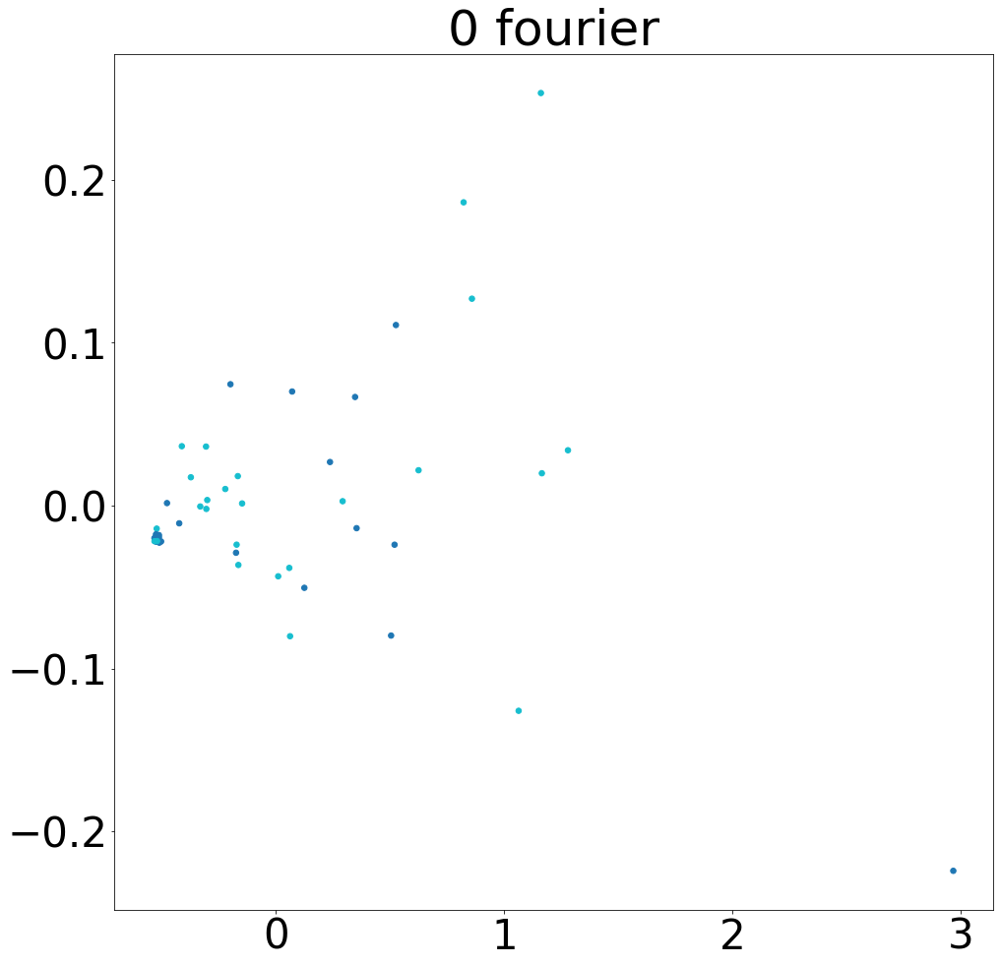

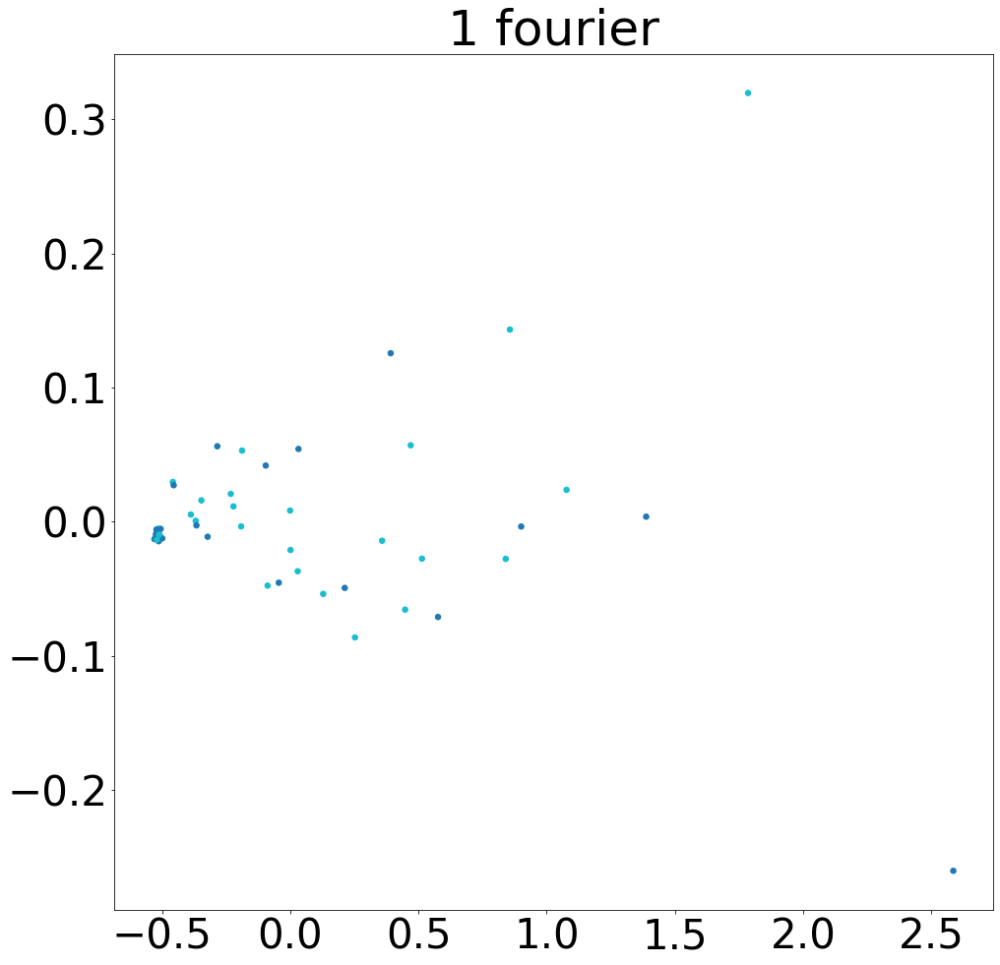

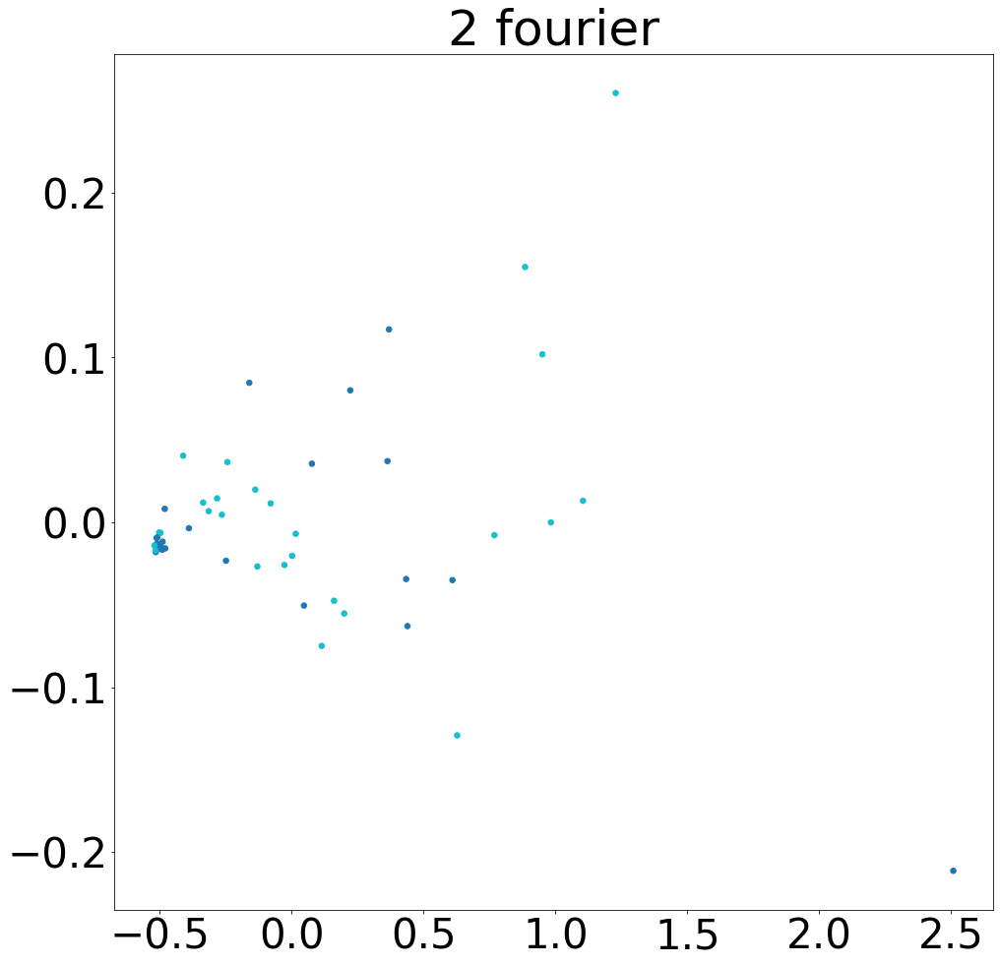

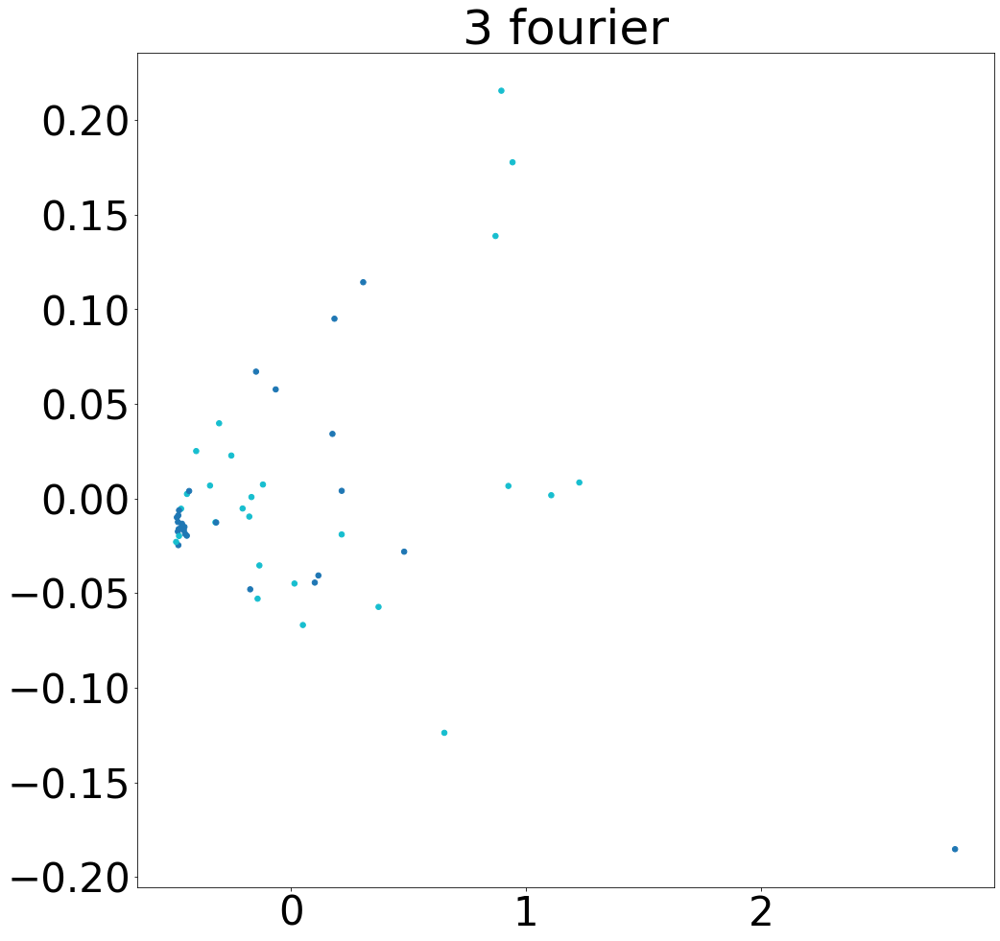

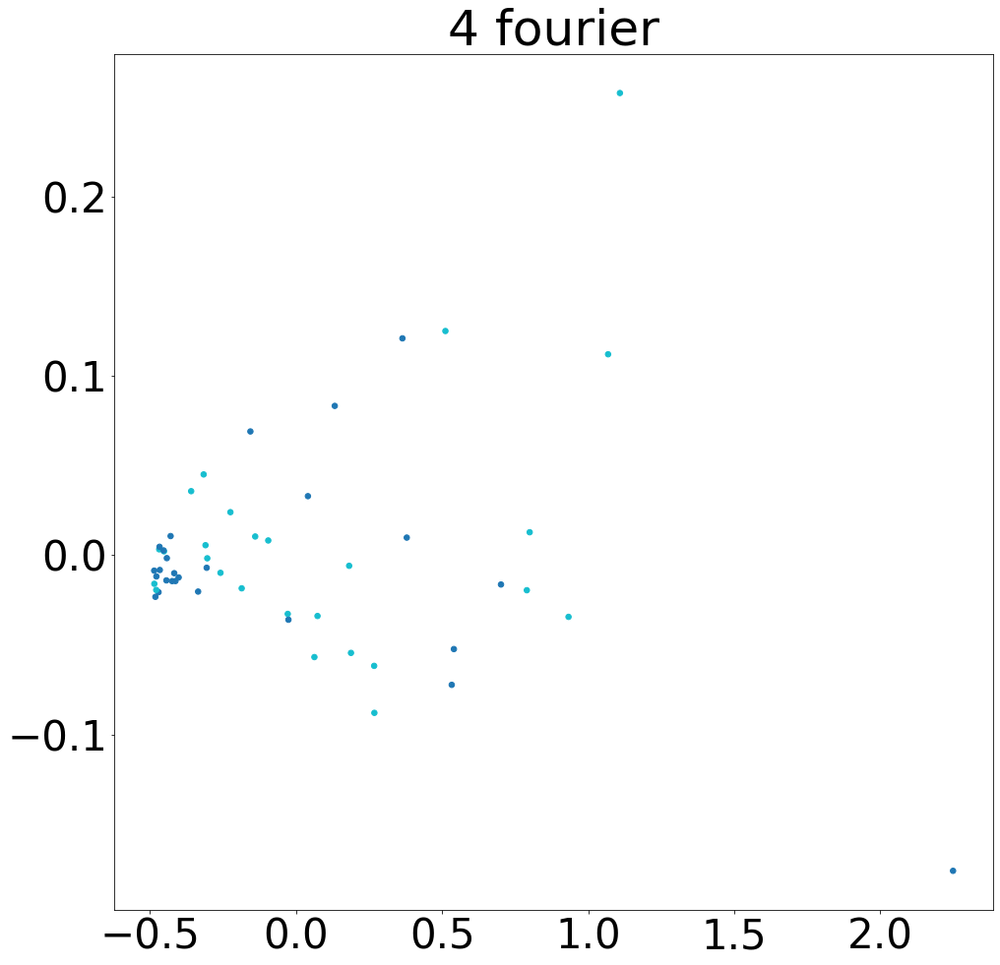

...

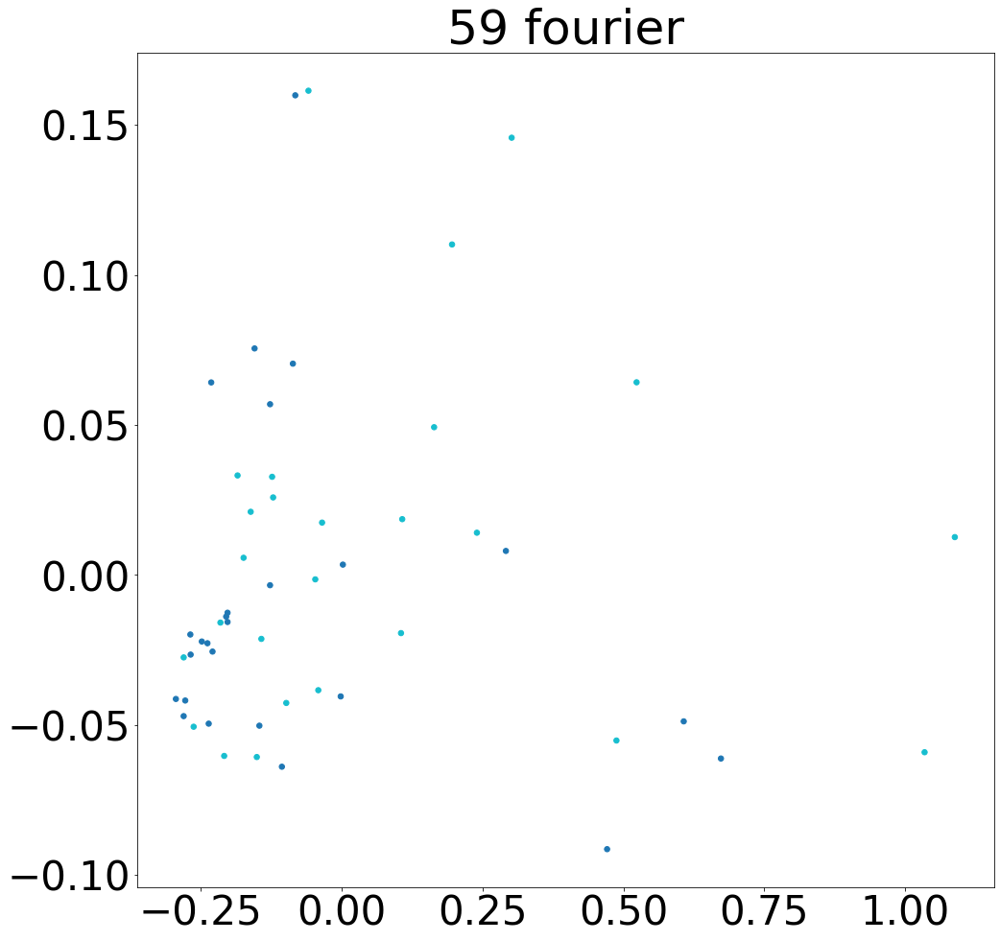

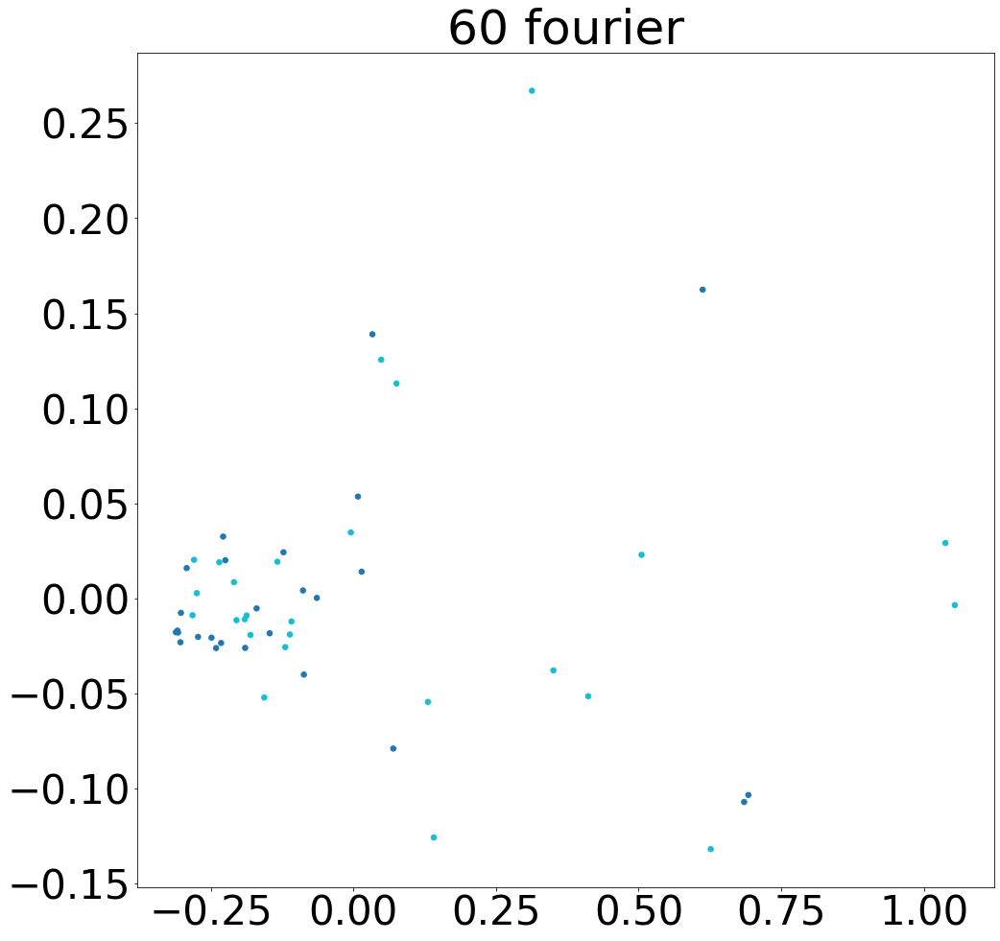

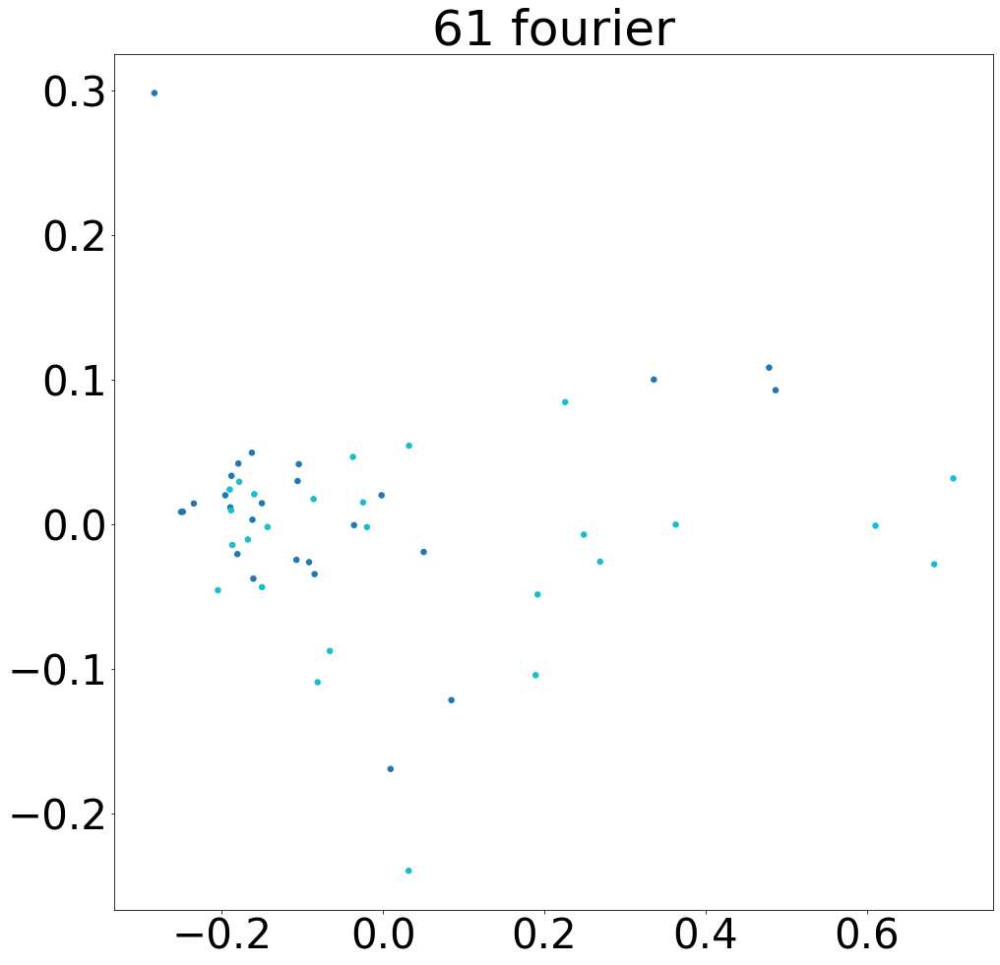

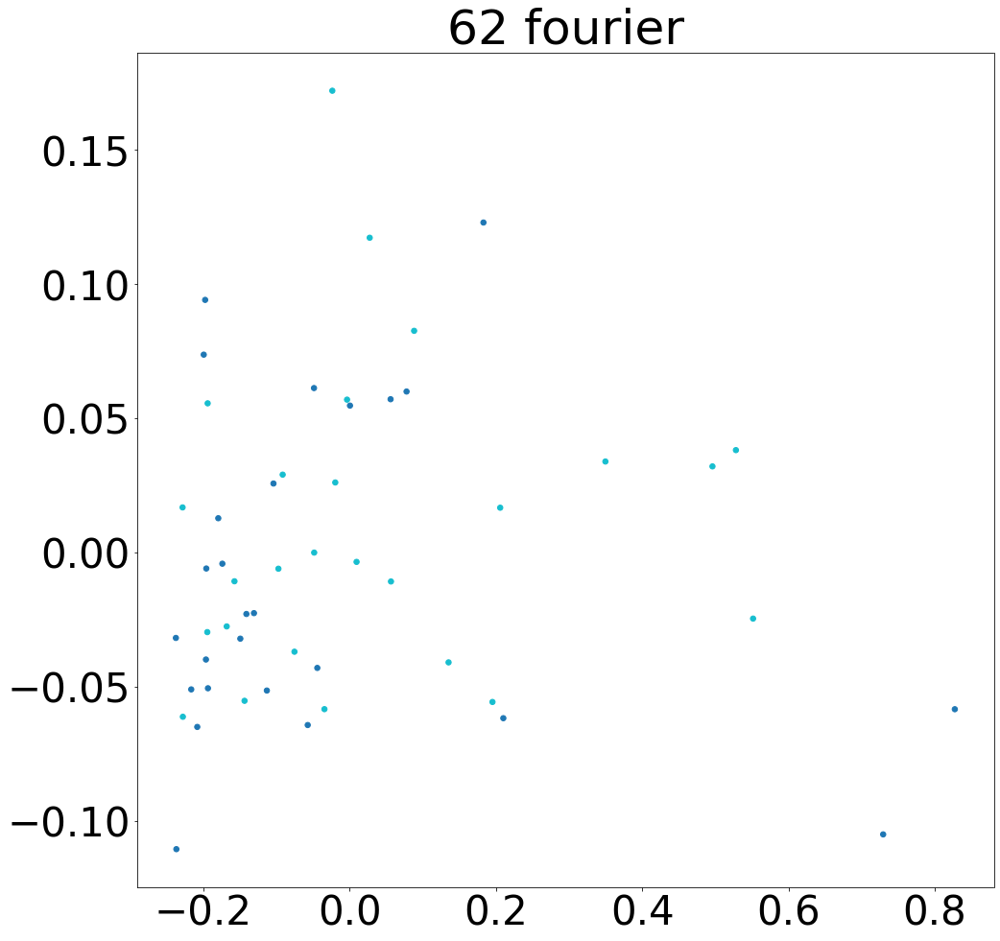

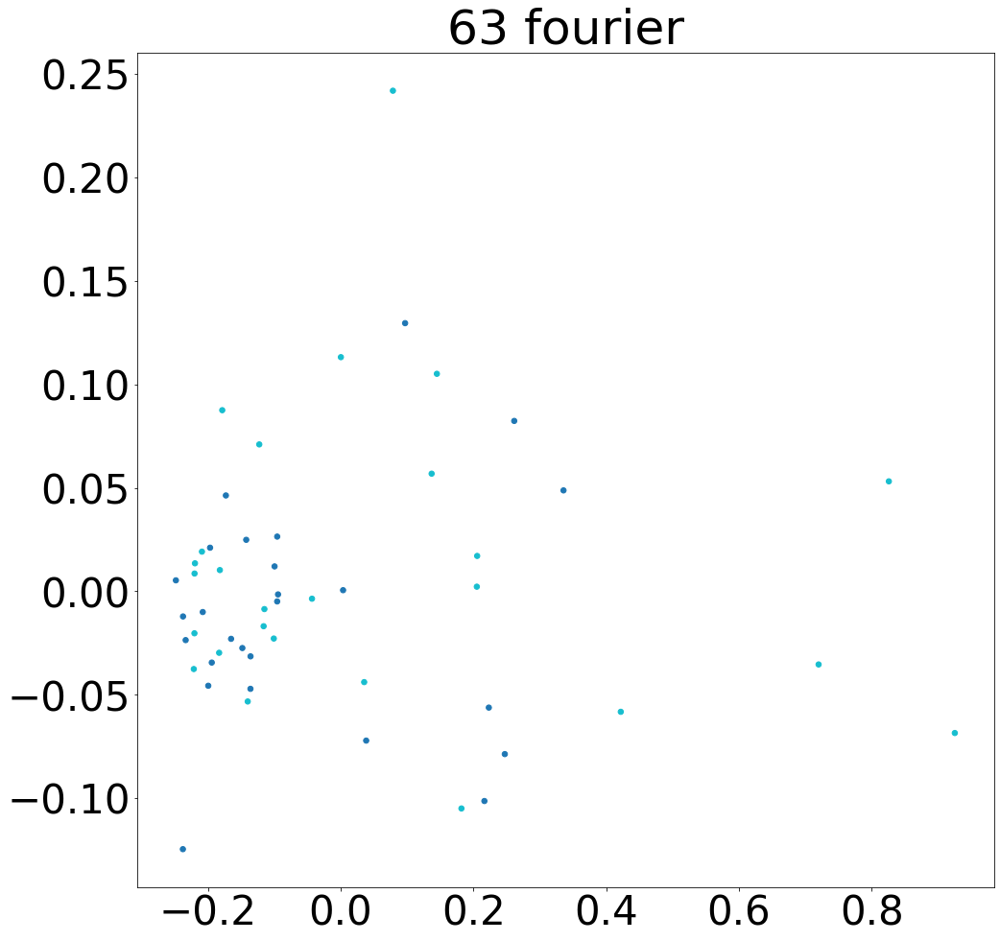

In [119]:
#Beta 8-13 Hz
for i in range(scaled_test_data.shape[2]):
    sig = test_fourier[:,:,i]
    filter_ = signal.butter(10, [8,13], 'band', fs=f_s, output='sos')
    sos = filter_
    filtered = signal.sosfilt(sos, sig)
    pca = PCA(n_components=2)
    PCA_DR = pca.fit_transform(filtered)

    
    median_0s = np.zeros(len(test_labels))
    median_1s = np.zeros(len(test_labels))

    mean_0s = np.zeros(len(test_labels))
    mean_1s = np.zeros(len(test_labels))

    for index in range(len(test_labels)):
        median_0, median_1, mean_0, mean_1 = mean_median(index, PCA_DR, test_labels)
        median_0s[index] = median_0
        median_1s[index] = median_1

        mean_0s[index] = mean_0
        mean_1s[index] = mean_1

    mean_0_0s = np.zeros(len(test_labels))
    mean_0_1s = np.zeros(len(test_labels))
    mean_1_1s = np.zeros(len(test_labels))

    median_0_0s = np.zeros(len(test_labels))
    median_0_1s = np.zeros(len(test_labels))
    median_1_1s = np.zeros(len(test_labels))

    for index in range(len(mean_0s)):

        if test_labels[index] == 0:
            mean_0_0s[index] = mean_0s[index]
            median_0_0s[index] = median_0s[index]
        else:
            mean_0_1s[index] = mean_0s[index]
            mean_1_1s[index] = mean_1s[index]

            median_0_1s[index] = median_0s[index]
            median_1_1s[index] = median_1s[index]

    mean_0_0s = mean_0_0s[mean_0_0s != 0]
    mean_0_1s = mean_0_1s[mean_0_1s != 0]
    mean_1_1s = mean_1_1s[mean_1_1s != 0]

    median_0_0s = median_0_0s[median_0_0s != 0]
    median_0_1s = median_0_1s[median_0_1s != 0]
    median_1_1s = median_1_1s[median_1_1s != 0]

    mean_between_unpleasant_unpleasant = np.mean(mean_0_0s)
    mean_between_pleasant_unpleasant = np.mean(mean_0_1s)
    mean_between_pleasant_pleasant = np.mean(mean_1_1s)

    median_between_unpleasant_unpleasant = np.median(median_0_0s)
    median_between_pleasant_unpleasant = np.median(median_0_1s)
    median_between_pleasant_pleasant = np.median(median_1_1s)
    
    print(i)
    print("mean unp to unp", mean_between_unpleasant_unpleasant)
    print("mean unp to p", mean_between_pleasant_unpleasant)
    print("mean p to p", mean_between_pleasant_pleasant)

    print("median unp to unp", median_between_unpleasant_unpleasant)
    print("median unp to p", median_between_pleasant_unpleasant)
    print("median p to p", median_between_pleasant_pleasant)
    
    if mean_between_unpleasant_unpleasant < mean_between_pleasant_unpleasant and mean_between_pleasant_pleasant < mean_between_pleasant_unpleasant:
        print("--------------SUCCEESS----------------------")
        
    if median_between_unpleasant_unpleasant < median_between_pleasant_unpleasant and median_between_pleasant_pleasant < median_between_pleasant_unpleasant:
        print("--------------SUCCEESS----------------------")
    #scatter_plot(PCA_DR)
    fig, ax = plt.subplots(figsize=(16, 16))
    sc = ax.scatter(
        PCA_DR[:, 0],
        PCA_DR[:, 1],
        c=test_labels.astype(int),
        cmap="tab10",
        s=30,
        alpha=1,
        rasterized=True,
    )
    plt.title(str(i) + " fourier")
    #plt.xlim(-0.5,0)
    #plt.ylim(-0.5,0.5)

